In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [3]:
df = pd.read_csv('Employee_Compensation.csv')

In [4]:
df.shape

(840505, 22)

In [5]:
df.dtypes

Organization Group Code      int64
Job Family Code             object
Job Code                    object
Year Type                   object
Year                         int64
Organization Group          object
Department Code             object
Department                  object
Union Code                 float64
Union                       object
Job Family                  object
Job                         object
Employee Identifier          int64
Salaries                   float64
Overtime                   float64
Other Salaries             float64
Total Salary               float64
Retirement                 float64
Health and Dental          float64
Other Benefits             float64
Total Benefits             float64
Total Compensation         float64
dtype: object

In [6]:
df.isna().sum()

Organization Group Code      0
Job Family Code              0
Job Code                     0
Year Type                    0
Year                         0
Organization Group           0
Department Code              2
Department                   2
Union Code                 180
Union                      179
Job Family                   0
Job                          5
Employee Identifier          0
Salaries                     0
Overtime                     0
Other Salaries               0
Total Salary                 0
Retirement                   0
Health and Dental            0
Other Benefits               0
Total Benefits               0
Total Compensation           0
dtype: int64

In [7]:
dups = df[df.duplicated()]

In [8]:
df.drop_duplicates()

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
0,3,1400,1404,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,790.0,"SEIU, Local 1021, Misc",...,37486688,60720.01,0.00,0.00,60720.01,13653.20,14733.76,4904.34,33291.30,94011.31
1,3,9700,9703,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,39646203,91677.00,0.00,0.00,91677.00,17524.20,14733.76,7411.13,39669.09,131346.09
2,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37486043,89106.03,0.00,1540.00,90646.03,17327.20,14733.76,7401.92,39462.88,130108.91
3,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37615772,85581.11,3355.94,337.75,89274.80,16359.16,14151.56,7096.21,37606.93,126881.73
4,3,2900,2905,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37500212,86457.00,0.00,2090.00,88547.00,16925.97,14733.76,7257.89,38917.62,127464.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
840500,2,7300,7345,Fiscal,2014,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,6.0,"Electrical Workers, Local 6",...,53853,93249.36,5158.03,1740.00,100147.39,20251.75,12512.55,8233.87,40998.17,141145.56
840501,2,7300,7345,Fiscal,2013,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,6.0,"Electrical Workers, Local 6",...,53853,91338.06,955.10,1860.00,94153.16,16971.40,12801.79,7872.93,37646.12,131799.28
840502,2,7300,7345,Calendar,2016,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,6.0,"Electrical Workers, Local 6",...,53853,0.00,0.00,2133.90,2133.90,0.00,98.16,163.24,261.40,2395.30
840503,2,7300,7345,Calendar,2015,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,6.0,"Electrical Workers, Local 6",...,53853,93580.00,593.51,1869.00,96042.51,19749.36,11946.64,7900.63,39596.63,135639.14


In [9]:
df.columns

Index(['Organization Group Code', 'Job Family Code', 'Job Code', 'Year Type',
       'Year', 'Organization Group', 'Department Code', 'Department',
       'Union Code', 'Union', 'Job Family', 'Job', 'Employee Identifier',
       'Salaries', 'Overtime', 'Other Salaries', 'Total Salary', 'Retirement',
       'Health and Dental', 'Other Benefits', 'Total Benefits',
       'Total Compensation'],
      dtype='object')

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840505 entries, 0 to 840504
Data columns (total 22 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Organization Group Code  840505 non-null  int64  
 1   Job Family Code          840505 non-null  object 
 2   Job Code                 840505 non-null  object 
 3   Year Type                840505 non-null  object 
 4   Year                     840505 non-null  int64  
 5   Organization Group       840505 non-null  object 
 6   Department Code          840503 non-null  object 
 7   Department               840503 non-null  object 
 8   Union Code               840325 non-null  float64
 9   Union                    840326 non-null  object 
 10  Job Family               840505 non-null  object 
 11  Job                      840500 non-null  object 
 12  Employee Identifier      840505 non-null  int64  
 13  Salaries                 840505 non-null  float64
 14  Over

In [11]:
import re
pattern = r'^[^a-zA-Z0-9\s]+|[^a-zA-Z0-9\s]+$'

for column in df.columns:
    df[column] = df[column].replace(pattern, '')

In [12]:
df = df.dropna()

In [13]:
df.shape[0]

840318

In [14]:
187/840505*100

0.022248529158065685

In [15]:
df.rename(columns={'Organization Group Code':'Organization_Group_Code','Job Family Code':'Job_Family_Code','Job Code':'Job_Code','Year Type':'Year_Type','Organization Group':'Organization_Group','Department Code':'Department_Code','Union Code':'Union_Code','Job Family':'Job_Family' ,'Employee Identifier':'Employee_Identifier','Other Salaries':'Other_Salaries','Total Salary':'Total_Salary','Health and Dental':'Health_and_Dental','Other Benefits':'Other_Benefits','Total Benefits':'Total_Benefits','Total Compensation':'Total_Compensation'},inplace=True)

# <center>Level 1 Analysis

In [16]:
cat = df.select_dtypes(exclude=['int64','float64'])

In [17]:
num = df.select_dtypes(include=['int64','float64'])

In [18]:
num.columns

Index(['Organization_Group_Code', 'Year', 'Union_Code', 'Employee_Identifier',
       'Salaries', 'Overtime', 'Other_Salaries', 'Total_Salary', 'Retirement',
       'Health_and_Dental', 'Other_Benefits', 'Total_Benefits',
       'Total_Compensation'],
      dtype='object')

In [19]:
cat.columns

Index(['Job_Family_Code', 'Job_Code', 'Year_Type', 'Organization_Group',
       'Department_Code', 'Department', 'Union', 'Job_Family', 'Job'],
      dtype='object')

# Operation on Categorical Data

In [20]:
def categorical(col):
    print(f"Number of Unique values in {col} is {df[col].unique()}")
    print(f"Number of Missing values in {col} is {df[col].isnull().sum()}")
    print(f"Mode of {col} is {df[col].mode()[0]}")

Analysis of column Job Family Code

In [21]:
categorical('Job_Family_Code')

Number of Unique values in Job_Family_Code is ['1400' '9700' '2900' '9900' '7300' '1900' '9100' '5200' '8200' '1000'
 '7500' 'Q000' '9200' '0000' '2700' '3500' '1800' '6100' '6300' '7200'
 '0900' '5500' '6200' '5300' '1600' '8100' '4200' '1200' '1300' '1500'
 '2300' '2500' '2200' '2400' '2800' '2600' '7100' '2100' '3400' '1100'
 '7400' '5100' '1700' 'H000' '3300' '5600' '4300' '8300' '8400' '3600'
 '9500' '5400' '8600' '9300' '4100' '3200' '__UNASSIGNED__' 'SCRT' 'SFRA']
Number of Missing values in Job_Family_Code is 0
Mode of Job_Family_Code is 2300


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\1143136052.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.Job_Family_Code,rotation=90,fontsize=8)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


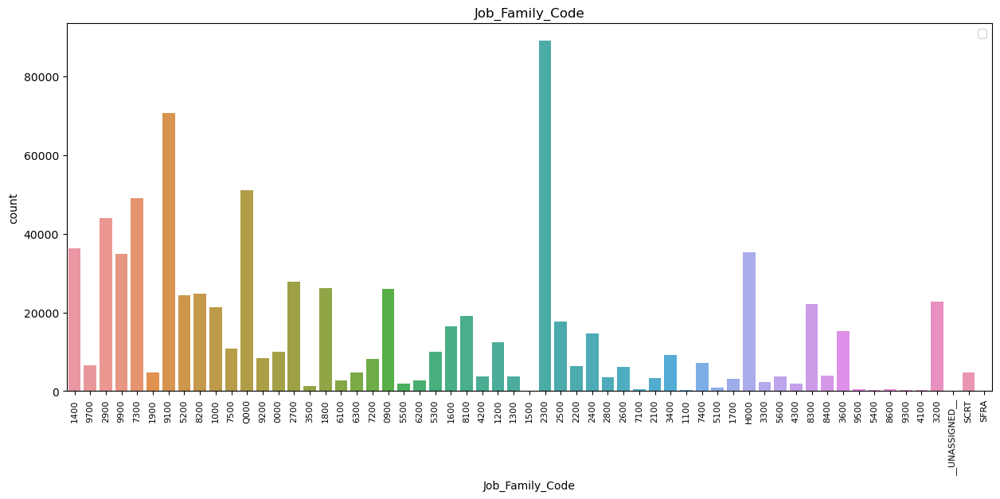

In [22]:
fig,ax = plt.subplots(figsize=(15,6))
ax.set_title("Job_Family_Code")
#ax[1].set_title("Job_Family_Code")
ax.set_xticklabels(df.Job_Family_Code,rotation=90,fontsize=8)
percentage=df.Job_Family_Code.value_counts()

sns.countplot(x=df['Job_Family_Code'])
#plt.pie(percentage, labels = percentage.index,shadow=True, autopct='%0.2f%%')
plt.legend();

In [23]:
categorical('Job_Family')

Number of Unique values in Job_Family is ['Clerical, Secretarial & Steno' 'Community Development' 'Human Services'
 'Public Service Aide' 'Journeyman Trade' 'Purchasing & Storekeeping'
 'Street Transit' 'Professional Engineering' 'Protection & Apprehension'
 'Information Systems' 'Semi-Skilled & General Labor' 'Police Services'
 'Airport Operation' 'Untitled' 'Housekeeping & Laundry'
 'Museum & Cultural Affairs' 'Budget, Admn & Stats Analysis'
 'Health & Sanitation Inspection' 'Construction Inspection'
 'Supervisory-Labor & Trade' 'Management' 'Construction Project Mgmt'
 'Public Safety Inspection' 'Sub-Professional Engineering'
 'Payroll, Billing & Accounting' 'Legal & Court' 'Appraisal & Taxation'
 'Personnel' 'Pub Relations & Spec Assts' 'Administrative Secretarial'
 'Nursing' 'Med Therapy & Auxiliary' 'Medical & Dental'
 'Lab, Pharmacy & Med Techs' 'Public Health' 'Dietary & Food'
 'Administrative-Labor & Trades' 'Hospital Administration'
 'Agriculture & Horticulture' 'Administrati

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\59848579.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.Job_Family,rotation=90,fontsize=8)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


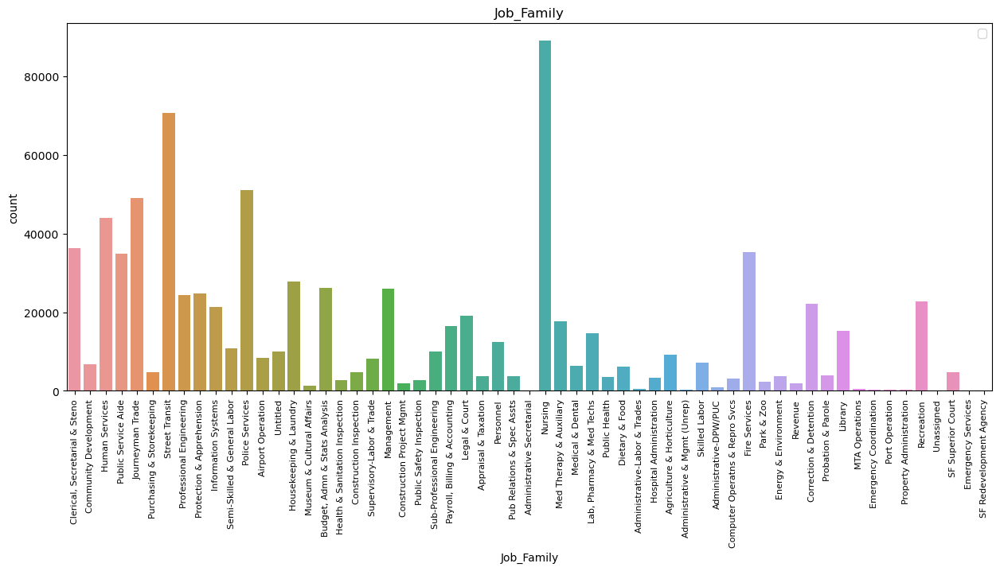

In [24]:
fig,ax = plt.subplots(figsize=(15,6))
ax.set_title("Job_Family")
ax.set_xticklabels(df.Job_Family,rotation=90,fontsize=8)
percentage=df.Job_Family.value_counts()

sns.countplot(x=df['Job_Family'])
#plt.pie(percentage, labels = percentage.index,shadow=True, autopct='%0.2f%%')
plt.legend();

In [25]:
for x in cat.columns:
    print(categorical(x))
    print('#'*125)
    

Number of Unique values in Job_Family_Code is ['1400' '9700' '2900' '9900' '7300' '1900' '9100' '5200' '8200' '1000'
 '7500' 'Q000' '9200' '0000' '2700' '3500' '1800' '6100' '6300' '7200'
 '0900' '5500' '6200' '5300' '1600' '8100' '4200' '1200' '1300' '1500'
 '2300' '2500' '2200' '2400' '2800' '2600' '7100' '2100' '3400' '1100'
 '7400' '5100' '1700' 'H000' '3300' '5600' '4300' '8300' '8400' '3600'
 '9500' '5400' '8600' '9300' '4100' '3200' '__UNASSIGNED__' 'SCRT' 'SFRA']
Number of Missing values in Job_Family_Code is 0
Mode of Job_Family_Code is 2300
None
#############################################################################################################################
Number of Unique values in Job_Code is ['1404' '9703' '2918' ... '2933' '2440' '6266']
Number of Missing values in Job_Code is 0
Mode of Job_Code is 9163
None
#############################################################################################################################
Number of Unique values in 

Number of Unique values in Job_Family is ['Clerical, Secretarial & Steno' 'Community Development' 'Human Services'
 'Public Service Aide' 'Journeyman Trade' 'Purchasing & Storekeeping'
 'Street Transit' 'Professional Engineering' 'Protection & Apprehension'
 'Information Systems' 'Semi-Skilled & General Labor' 'Police Services'
 'Airport Operation' 'Untitled' 'Housekeeping & Laundry'
 'Museum & Cultural Affairs' 'Budget, Admn & Stats Analysis'
 'Health & Sanitation Inspection' 'Construction Inspection'
 'Supervisory-Labor & Trade' 'Management' 'Construction Project Mgmt'
 'Public Safety Inspection' 'Sub-Professional Engineering'
 'Payroll, Billing & Accounting' 'Legal & Court' 'Appraisal & Taxation'
 'Personnel' 'Pub Relations & Spec Assts' 'Administrative Secretarial'
 'Nursing' 'Med Therapy & Auxiliary' 'Medical & Dental'
 'Lab, Pharmacy & Med Techs' 'Public Health' 'Dietary & Food'
 'Administrative-Labor & Trades' 'Hospital Administration'
 'Agriculture & Horticulture' 'Administrati

In [26]:
'''
fig,ax = plt.subplots(figsize=(15,6))
ax.set_title("Job")
ax.set_xticklabels(df.Job,rotation=90,fontsize=8)
percentage=df.Job.value_counts()

sns.countplot(x=df['Job'])
#plt.pie(percentage, labels = percentage.index,shadow=True, autopct='%0.2f%%')
plt.legend();
'''

'\nfig,ax = plt.subplots(figsize=(15,6))\nax.set_title("Job")\nax.set_xticklabels(df.Job,rotation=90,fontsize=8)\npercentage=df.Job.value_counts()\n\nsns.countplot(x=df[\'Job\'])\n#plt.pie(percentage, labels = percentage.index,shadow=True, autopct=\'%0.2f%%\')\nplt.legend();\n'

In [27]:
df.Job.value_counts()

Transit Operator                  53477
Special Nurse                     31411
Registered Nurse                  28287
Firefighter                       17278
Police Officer 3                  17003
                                  ...  
Special Assistant 1                   1
Sr Sprvg Institut Mgr (PERS)          1
Musm Exhibit Packer & Repairer        1
Court Adr Coord                       1
Court Supervisor I                    1
Name: Job, Length: 1368, dtype: int64

In [28]:
cat.columns

Index(['Job_Family_Code', 'Job_Code', 'Year_Type', 'Organization_Group',
       'Department_Code', 'Department', 'Union', 'Job_Family', 'Job'],
      dtype='object')

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\4091504128.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.Year_Type,rotation=90,fontsize=12)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


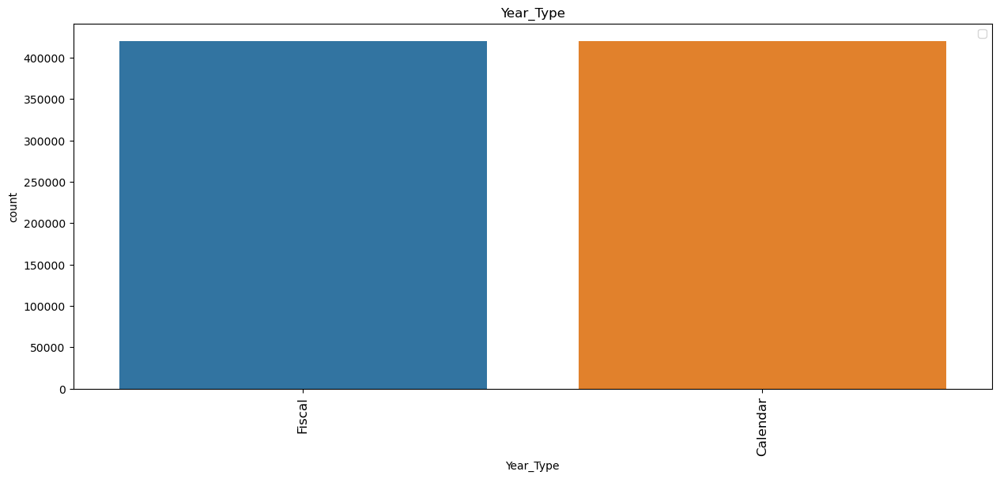

In [29]:
fig,ax = plt.subplots(figsize=(15,6))
ax.set_title("Year_Type")
ax.set_xticklabels(df.Year_Type,rotation=90,fontsize=12)
percentage=df.Year_Type.value_counts()

sns.countplot(x=df['Year_Type'])
#plt.pie(percentage, labels = percentage.index,shadow=True, autopct='%0.2f%%')
plt.legend();

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\1692331410.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.Organization_Group,rotation=90,fontsize=12)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


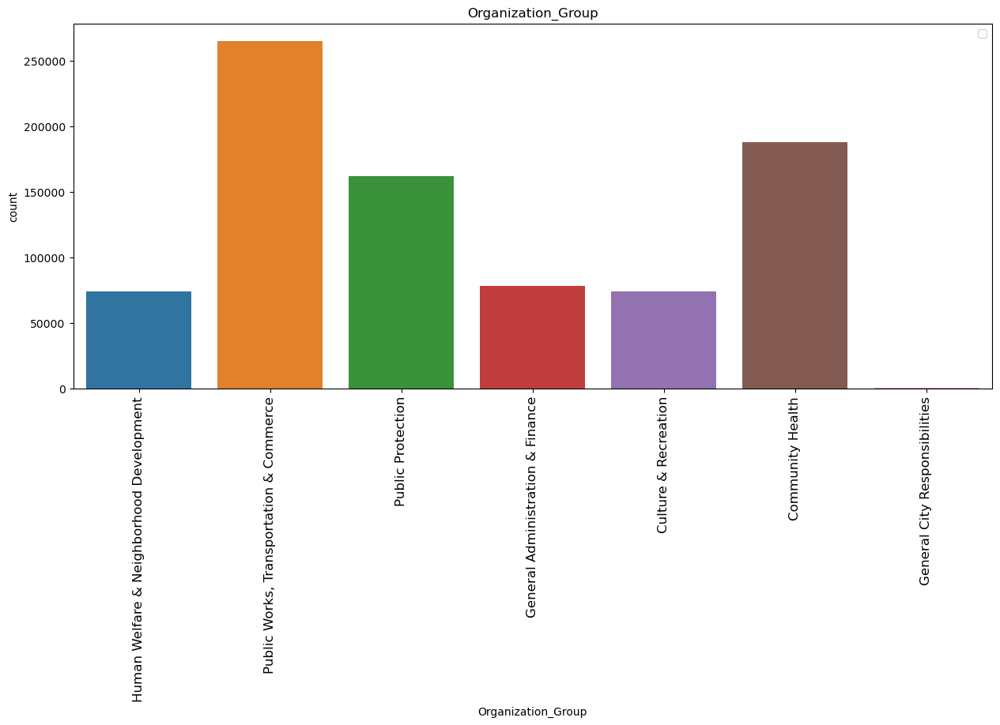

In [30]:
fig,ax = plt.subplots(figsize=(15,6))
ax.set_title("Organization_Group")
ax.set_xticklabels(df.Organization_Group,rotation=90,fontsize=12)
percentage=df.Organization_Group.value_counts()

sns.countplot(x=df['Organization_Group'])
#plt.pie(percentage, labels = percentage.index,shadow=True, autopct='%0.2f%%')
plt.legend();

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3047498734.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.Union,rotation=90,fontsize=8)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


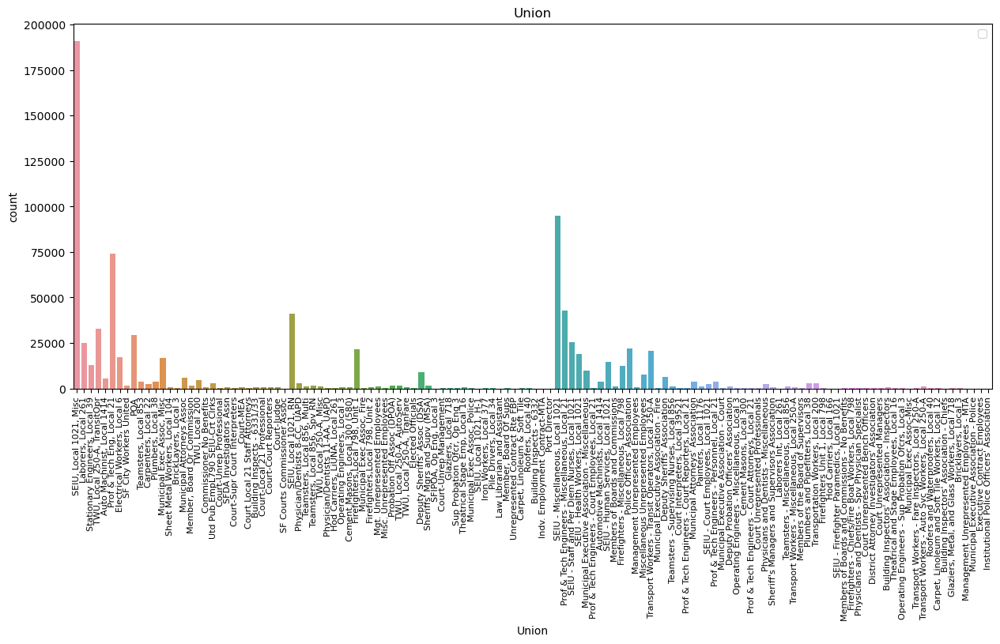

In [31]:
fig,ax = plt.subplots(figsize=(15,6))
ax.set_title("Union")
ax.set_xticklabels(df.Union,rotation=90,fontsize=8)
percentage=df.Union.value_counts()

sns.countplot(x=df['Union'])
#plt.pie(percentage, labels = percentage.index,shadow=True, autopct='%0.2f%%')
plt.legend();

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\1034478860.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.Department_Code,rotation=90,fontsize=8)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


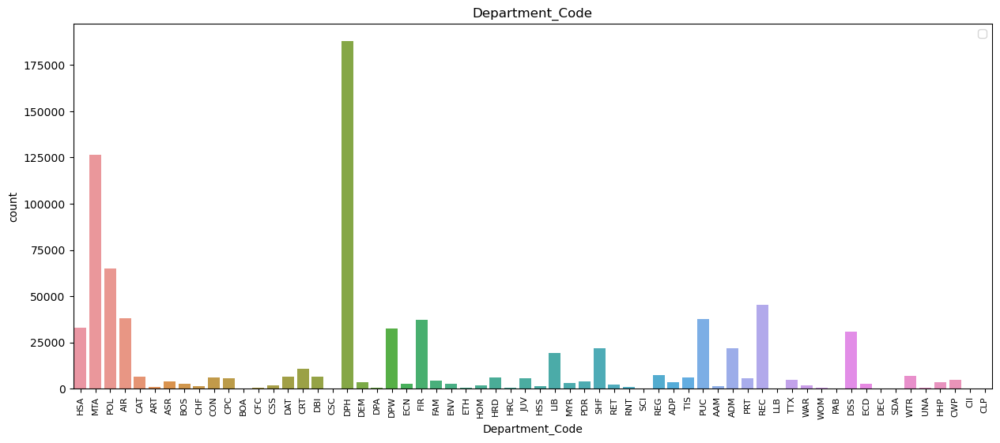

In [32]:
fig,ax = plt.subplots(figsize=(15,6))
ax.set_title("Department_Code")
ax.set_xticklabels(df.Department_Code,rotation=90,fontsize=8)
percentage=df.Department_Code.value_counts()

sns.countplot(x=df['Department_Code'])
#plt.pie(percentage, labels = percentage.index,shadow=True, autopct='%0.2f%%')
plt.legend();

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\2492575826.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.Department,rotation=90,fontsize=8)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


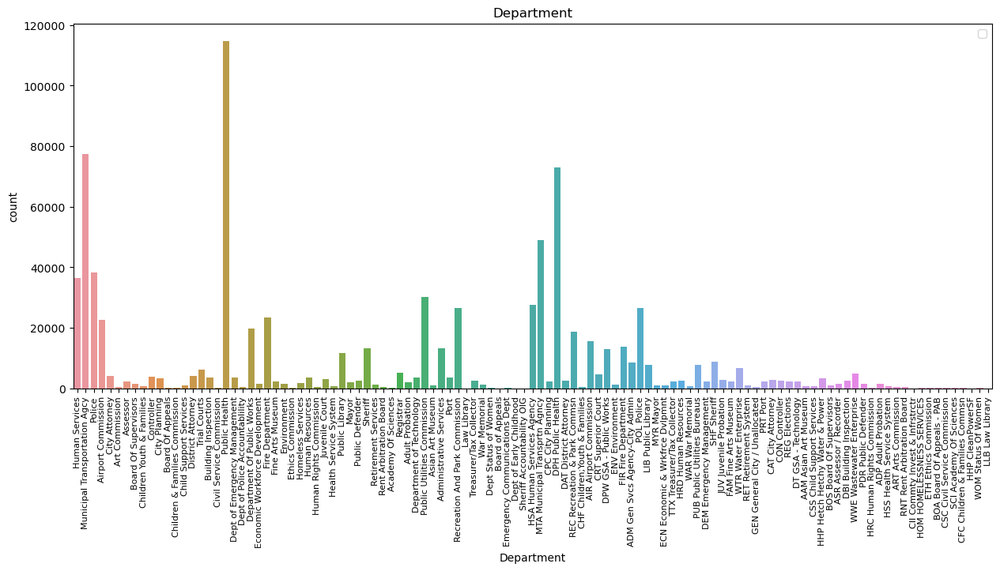

In [33]:
fig,ax = plt.subplots(figsize=(15,6))
ax.set_title("Department")
ax.set_xticklabels(df.Department,rotation=90,fontsize=8)
percentage=df.Department.value_counts()

sns.countplot(x=df['Department'])
#plt.pie(percentage, labels = percentage.index,shadow=True, autopct='%0.2f%%')
plt.legend();

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv("employee_compensation.csv")

# Calculate the average total compensation for each department
departments = data["Department"].unique()
average_total_compensation = {}
for department in departments:
    filtered_data = data[data["Department"] == department]
    average_total_compensation[department] = filtered_data["Total Compensation"].mean()

# Sort the departments by average total compensation
sorted_departments = sorted(average_total_compensation.items(), key=lambda x: x[1], reverse=True)

# Print the top 10 departments
for department, average_total_compensation in sorted_departments[:10]:
    print(f"{department}: {average_total_compensation:.2f}")


Law Library: 231382.23
City Attorney: 200365.49
Fire Department: 192875.04
LLB Law Library: 187457.89
Sheriff: 185456.65
Retirement Services: 176988.89
Police: 173296.68
Public Defender: 171843.55
District Attorney: 168030.84
Dept of Emergency Management: 157395.47


In [35]:
average_total_compensation={}
dept = []
comp = []
for x in df.Department.unique():
    filtered_data = df[df["Department"] == x]
    #average_total_compensation[department_name] = filtered_data["Total_Compensation"].mean()
#print(average_total_compensation)
    dept.append(x)
    comp.append(filtered_data["Total_Compensation"].mean())
print(comp)
average_total_compensation['department_name'] = dept
average_total_compensation['Mean_compensation'] = comp

dff = pd.DataFrame(average_total_compensation)

[95624.28897620687, 119388.26252513229, 173296.68489357253, 125733.80973692381, 200365.4941365462, 106935.6958938053, 129208.14159090909, 103725.53976567884, 132208.87808900524, 151140.00842311713, 123755.97614923584, 68608.30786324787, 135687.1856521739, 130318.96239325842, 168030.83507333495, 110463.41161932274, 146738.30655228315, 82846.755, 122477.80052462874, 157395.46986180212, 147139.7935412844, 119862.13253760927, 145684.71518449028, 192875.03959334327, 68099.90164216714, 96299.75201005026, 134185.81397849464, 123797.98290753606, 101071.88274137933, 91899.72534216335, 107202.71630848662, 128040.31530282638, 87935.6689316386, 137587.8551173709, 171843.54587771202, 185456.64655245442, 176988.88894273128, 130164.46425493716, 146988.1220805369, 20175.529130519353, 133501.46935748792, 153213.78286795627, 140577.34258743117, 91134.26096452329, 113247.3012701749, 140097.8645022883, 51805.11540867925, 231382.22624999998, 125948.76980244962, 88137.03390739235, 58950.14004524887, 60083.6

In [36]:
dff

,department_name,Mean_compensation
0,Human Services,95624.288976
1,Municipal Transportation Agcy,119388.262525
2,Police,173296.684894
3,Airport Commission,125733.809737
4,City Attorney,200365.494137
...,...,...
106,SCI Academy Of Sciences,106688.527265
107,CFC Children & Families Commsn,96112.145578
108,HHP CleanPowerSF,29308.076923
109,WOM Status Of Women,47707.315726


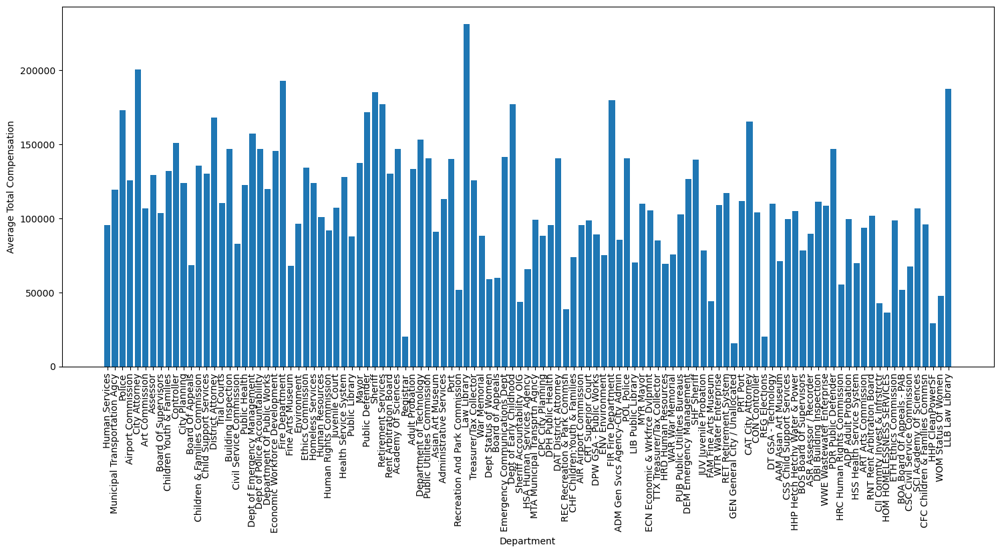

In [37]:
fig,ax=plt.subplots(figsize=(18,7))
plt.bar(dff.department_name, dff.Mean_compensation)
plt.xlabel("Department")
plt.ylabel("Average Total Compensation")
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.show()

<Axes: xlabel='department_name', ylabel='Mean_compensation'>

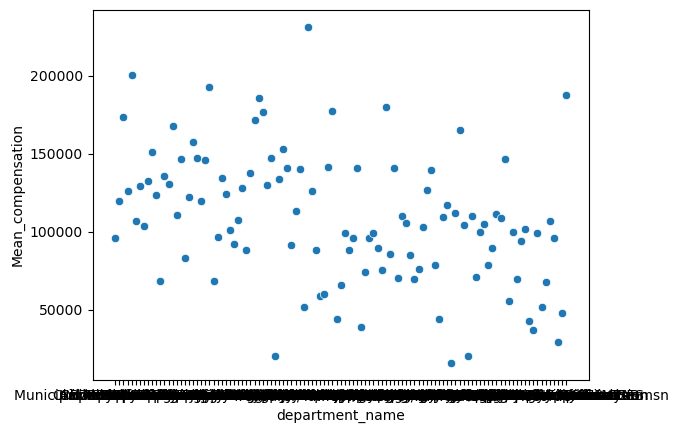

In [38]:
sns.scatterplot(data = dff,x='department_name',y= 'Mean_compensation')

In [39]:
num.columns

Index(['Organization_Group_Code', 'Year', 'Union_Code', 'Employee_Identifier',
       'Salaries', 'Overtime', 'Other_Salaries', 'Total_Salary', 'Retirement',
       'Health_and_Dental', 'Other_Benefits', 'Total_Benefits',
       'Total_Compensation'],
      dtype='object')

In [40]:
def numerical_data(col):
    print(f"Number of Missing values in {col} is {df[col].isnull().sum()}")
    print(f"Mode of {col} is {df[col].mode()[0]}")
    print(f"Mean of {col} is {round(df[col].mean(),3)}")
    print(f"Median of {col} is {df[col].median()}")
    print(f"Standard Deviation of {col} is {round(df[col].std(),3)}")
    print(f"Unique Values in {col} are {len(df[col].unique())}")

In [41]:
df = df[(df['Union_Code']>=0)&(df['Year']>=0)&(df['Organization_Group_Code']>=0)&(df['Salaries']>=0)&(df['Salaries']>=0)&(df['Overtime']>=0)&(df['Other_Salaries']>=0)&(df['Total_Salary']>=0)&(df['Retirement']>=0)&(df['Health_and_Dental']>=0)&(df['Other_Benefits']>=0)&(df['Total_Benefits']>=0)&(df['Total_Compensation']>=0)]

# Analysis of Organization_Group_Code

In [42]:
numerical_data('Organization_Group_Code')

Number of Missing values in Organization_Group_Code is 0
Mode of Organization_Group_Code is 2
Mean of Organization_Group_Code is 2.979
Median of Organization_Group_Code is 2.0
Standard Deviation of Organization_Group_Code is 1.582
Unique Values in Organization_Group_Code are 7


In [43]:
df['Organization_Group_Code'].value_counts()

2    264685
4    186936
1    161380
6     77863
5     73711
3     73656
7       387
Name: Organization_Group_Code, dtype: int64

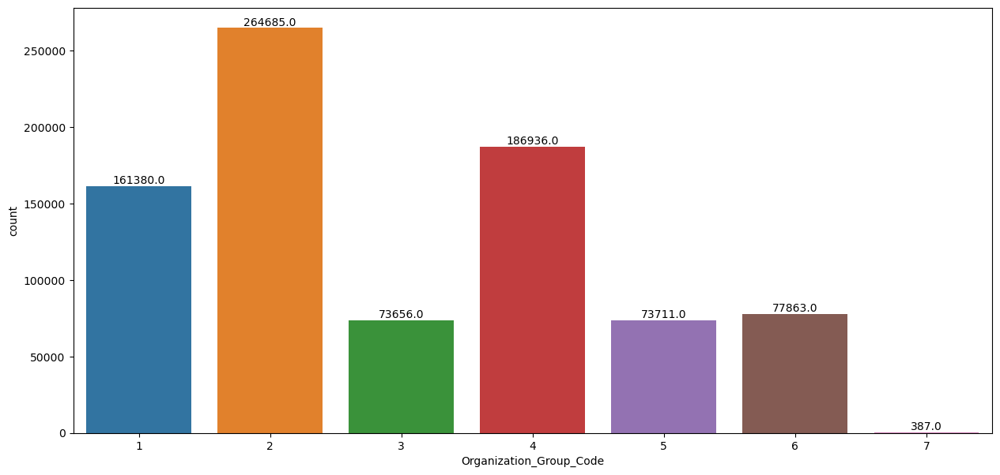

In [44]:
fig,ax=plt.subplots(figsize=(15,7))
ax=sns.countplot(x=df['Organization_Group_Code'])
for bar in ax.patches:
    percentage =f'{round(bar.get_height(),2)}'
    x=bar.get_x()+bar.get_width()/2
    y=bar.get_height()
    ax.annotate(percentage,(x,y),va='bottom', ha='center')

# Analysis of Year

In [45]:
numerical_data('Year')

Number of Missing values in Year is 0
Mode of Year is 2019
Mean of Year is 2017.504
Median of Year is 2018.0
Standard Deviation of Year is 2.834
Unique Values in Year are 10


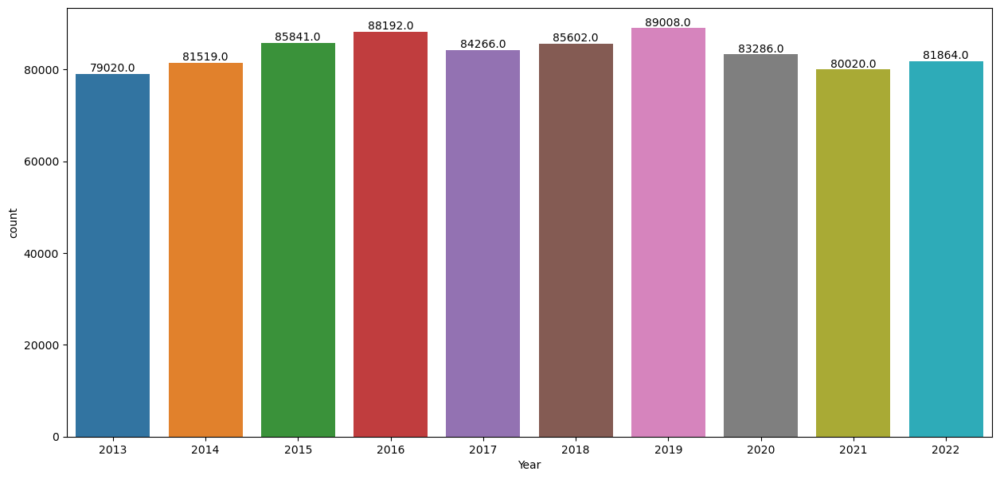

In [46]:
fig,ax=plt.subplots(figsize=(15,7))
ax=sns.countplot(x=df['Year'])
for bar in ax.patches:
    percentage =f'{round(bar.get_height(),2)}'
    x=bar.get_x()+bar.get_width()/2
    y=bar.get_height()
    ax.annotate(percentage,(x,y),va='bottom', ha='center')

# Analysis of Union_Code

In [47]:
numerical_data('Union_Code')

Number of Missing values in Union_Code is 0
Mode of Union_Code is 790.0
Mean of Union_Code is 491.408
Median of Union_Code is 535.0
Standard Deviation of Union_Code is 330.124
Unique Values in Union_Code are 70


In [48]:
df['Union_Code'].value_counts()

790.0    235134
21.0     110365
791.0     65649
253.0     53437
911.0     51271
          ...  
220.0        42
357.0        26
969.0        22
302.0        21
604.0        11
Name: Union_Code, Length: 70, dtype: int64

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\1676846050.py:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.Union_Code,rotation=90,fontsize=10)


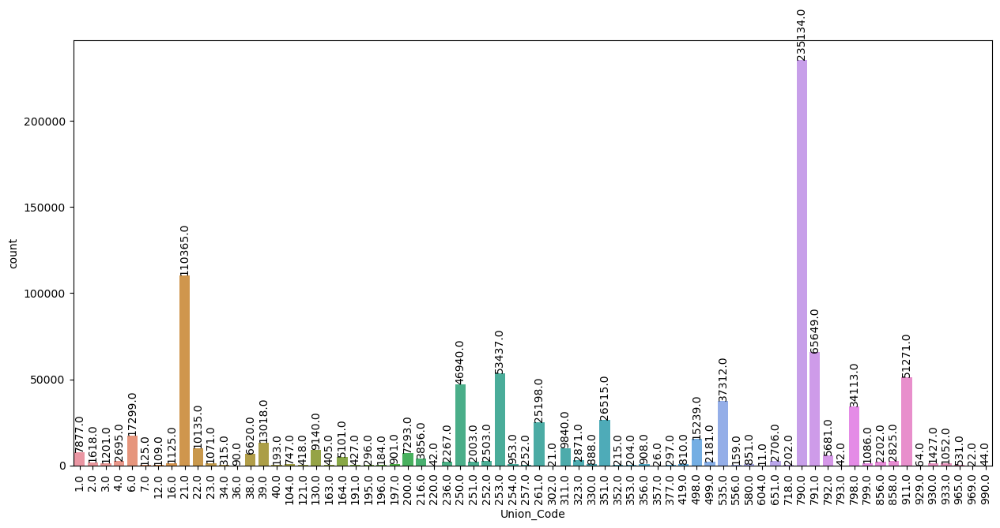

In [49]:
fig,ax=plt.subplots(figsize=(15,7))
ax.set_xticklabels(df.Union_Code,rotation=90,fontsize=10)
ax=sns.countplot(x=df['Union_Code'])
for bar in ax.patches:
    percentage =f'{round(bar.get_height(),2)}'
    x=bar.get_x()+bar.get_width()/2
    y=bar.get_height()
    ax.annotate(percentage,(x,y),va='bottom', ha='center',rotation=90)

# Analysis of Employee_Identifier

In [50]:
def barcount(ax):
    for bar in ax.patches:
        percentage =f'{round(bar.get_height(),2)}'
        x=bar.get_x()+bar.get_width()/2
        y=bar.get_height()
        ax.annotate(percentage,(x,y),va='bottom', ha='center',rotation=90)

In [51]:
def outlier(col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    print("Q1 :",q1,"Q3 :",q3)
    iqr = q3-q1
    print('Inter Quartile Range ', iqr)
    UF = q3+1.5*iqr
    LF = q1-1.5*iqr
    print("UPPER_FRAME :",UF,"LOWER_FRAME :",LF)
    DC2 = df[(df[col]>LF)&(df[col]<UF)]
    
    fig,ax=plt.subplots(2,1,figsize=(15,10))
    ax[0] = sns.histplot(DC2[col], bins=50,ax=ax[0])
    ax[1] = sns.boxplot(DC2[col],ax=ax[1],orient='h')
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {col}')
    barcount(ax[0])
    plt.show()

In [52]:
df['Employee_Identifier'].value_counts()

0           49
43227       22
7041        21
19638       20
30585       19
            ..
50882132     1
50866906     1
51636514     1
51947017     1
42196325     1
Name: Employee_Identifier, Length: 470825, dtype: int64

In [53]:
numerical_data('Employee_Identifier')

Number of Missing values in Employee_Identifier is 0
Mode of Employee_Identifier is 0
Mean of Employee_Identifier is 25396654.92
Median of Employee_Identifier is 37085657.0
Standard Deviation of Employee_Identifier is 21027881.304
Unique Values in Employee_Identifier are 470825


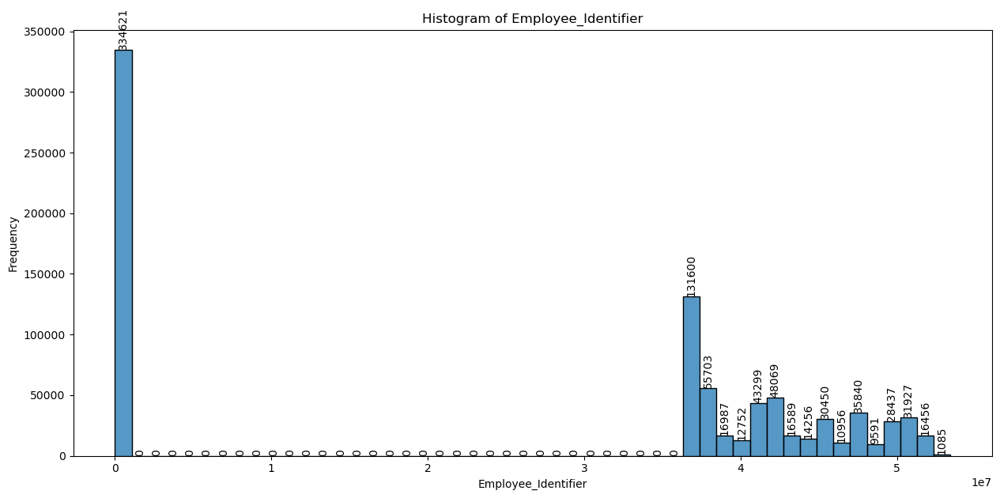

In [54]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Employee_Identifier'], bins=50)
plt.xlabel('Employee_Identifier')
plt.ylabel('Frequency')
plt.title('Histogram of Employee_Identifier')

barcount(ax)
plt.show()

Q1 : 35818.0 Q3 : 42444426.75
Inter Quartile Range  42408608.75
UPPER_FRAME : 106057339.875 LOWER_FRAME : -63577095.125


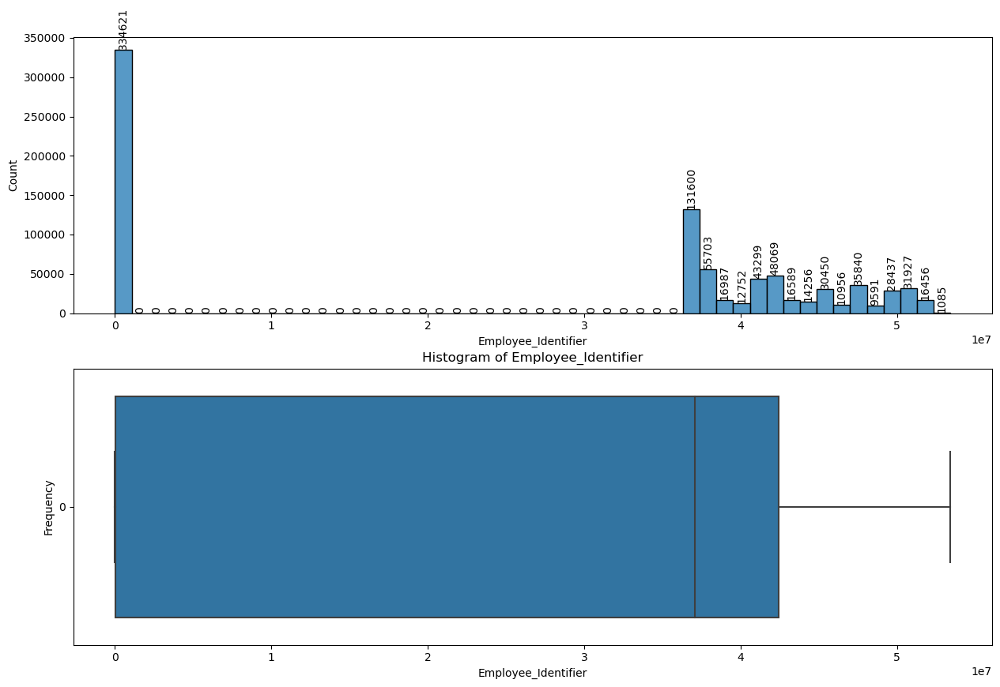

In [55]:
outlier('Employee_Identifier')

# Analysis of Salaries

In [56]:
numerical_data('Salaries')

Number of Missing values in Salaries is 0
Mode of Salaries is 0.0
Mean of Salaries is 74555.787
Median of Salaries is 72770.405
Standard Deviation of Salaries is 50089.658
Unique Values in Salaries are 612509


In [57]:
df['Salaries'].value_counts()

0.00         12852
135096.00      714
9463.59        495
66978.00       442
66041.00       411
             ...  
72494.84         1
134280.03        1
135961.99        1
81767.04         1
94305.09         1
Name: Salaries, Length: 612509, dtype: int64

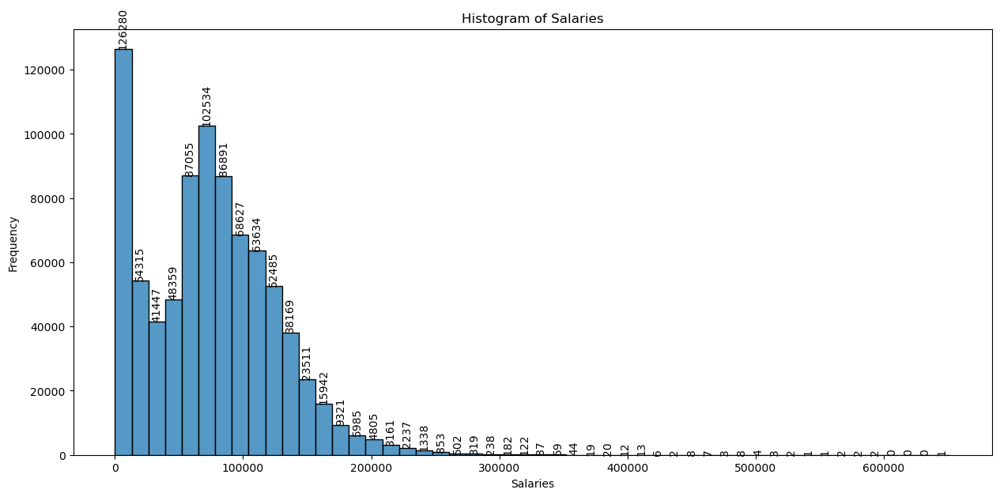

In [58]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Salaries'], bins=50)
plt.xlabel('Salaries')
plt.ylabel('Frequency')
plt.title('Histogram of Salaries')
barcount(ax)
plt.show()

Q1 : 34966.3125 Q3 : 107168.82
Inter Quartile Range  72202.5075
UPPER_FRAME : 215472.58125000002 LOWER_FRAME : -73337.44875000001


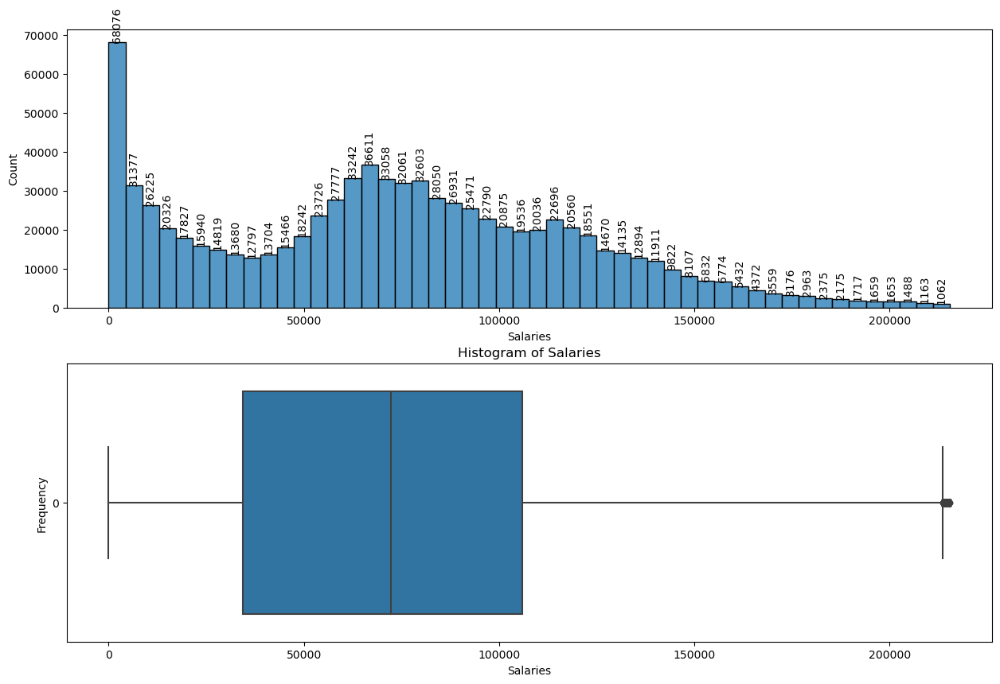

In [59]:
outlier('Salaries')

# Analysis of Overtime

In [60]:
numerical_data('Overtime')

Number of Missing values in Overtime is 0
Mode of Overtime is 0.0
Mean of Overtime is 6141.182
Median of Overtime is 0.0
Standard Deviation of Overtime is 14796.746
Unique Values in Overtime are 331962


In [61]:
df['Overtime'].max()

374502.76

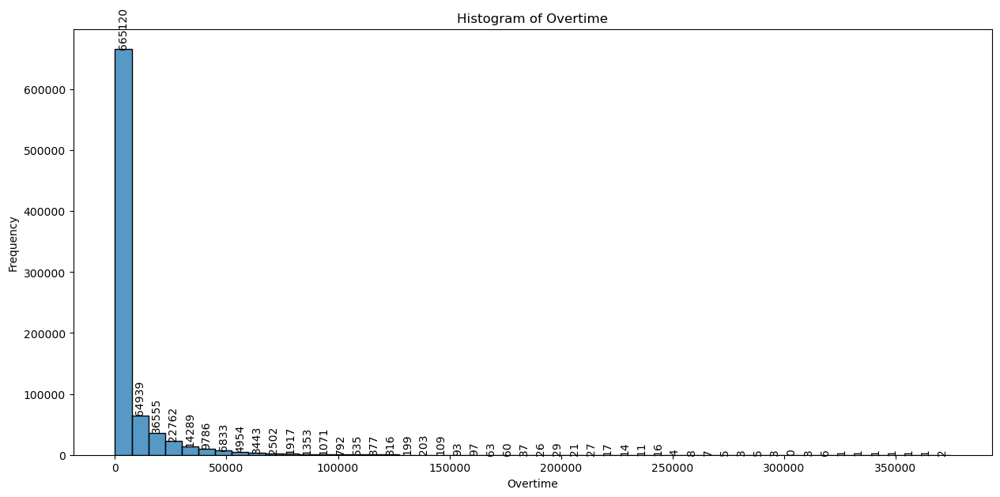

In [62]:
fig,ax=plt.subplots(figsize=(15,7))
ax= sns.histplot(df['Overtime'], bins=50)
plt.xlabel('Overtime')
plt.ylabel('Frequency')
plt.title('Histogram of Overtime')
barcount(ax)
plt.show()

Q1 : 0.0 Q3 : 4960.455
Inter Quartile Range  4960.455
UPPER_FRAME : 12401.1375 LOWER_FRAME : -7440.6825


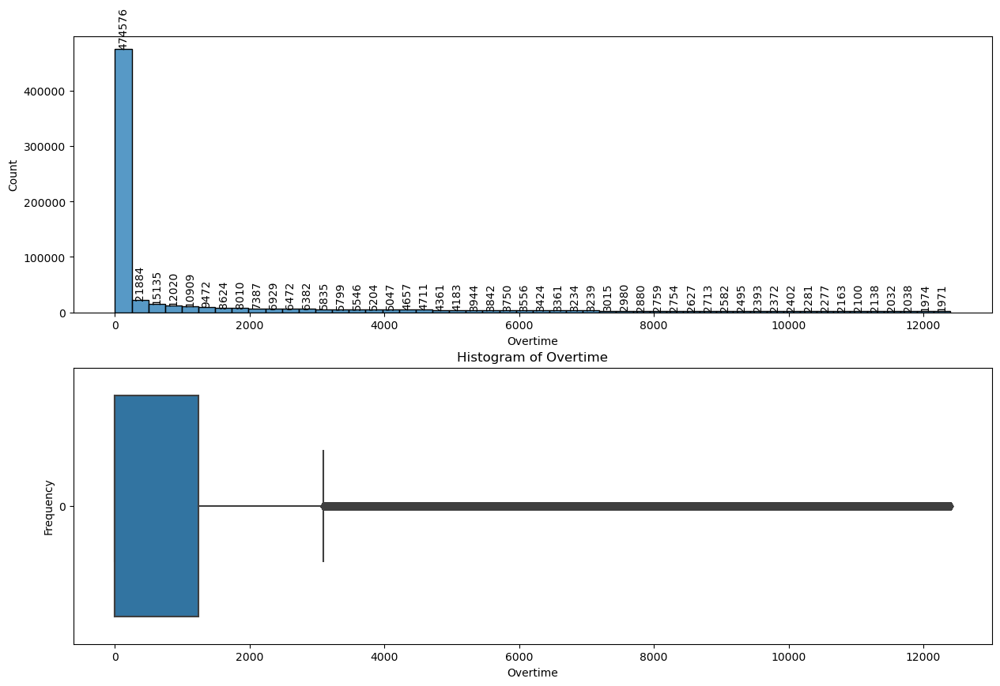

In [63]:
outlier('Overtime')

# Analysis of Other_Salaries

In [64]:
numerical_data('Other_Salaries')

Number of Missing values in Other_Salaries is 0
Mode of Other_Salaries is 0.0
Mean of Other_Salaries is 3848.52
Median of Other_Salaries is 797.405
Standard Deviation of Other_Salaries is 7686.477
Unique Values in Other_Salaries are 369309


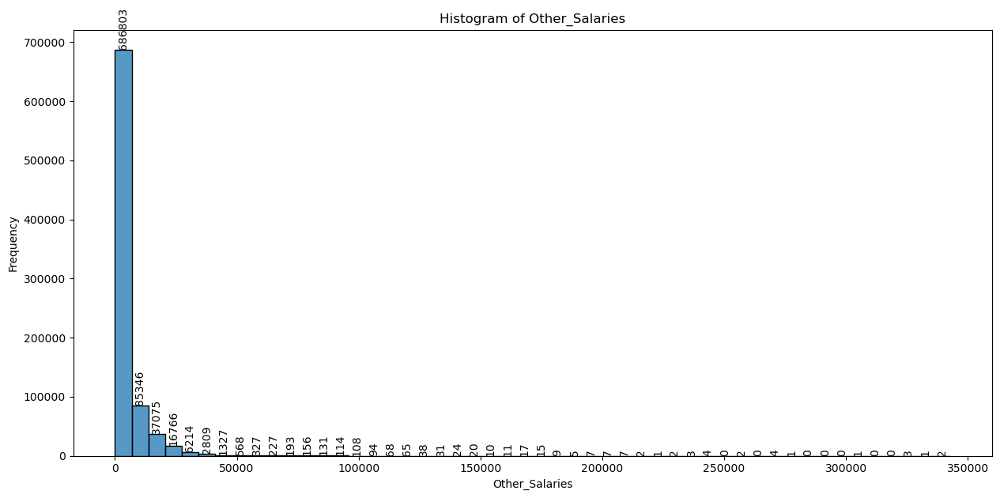

In [65]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Other_Salaries'], bins=50)
plt.xlabel('Other_Salaries')
plt.ylabel('Frequency')
plt.title('Histogram of Other_Salaries')
barcount(ax)
plt.show()


Q1 : 0.0 Q3 : 4585.36
Inter Quartile Range  4585.36
UPPER_FRAME : 11463.399999999998 LOWER_FRAME : -6878.039999999999


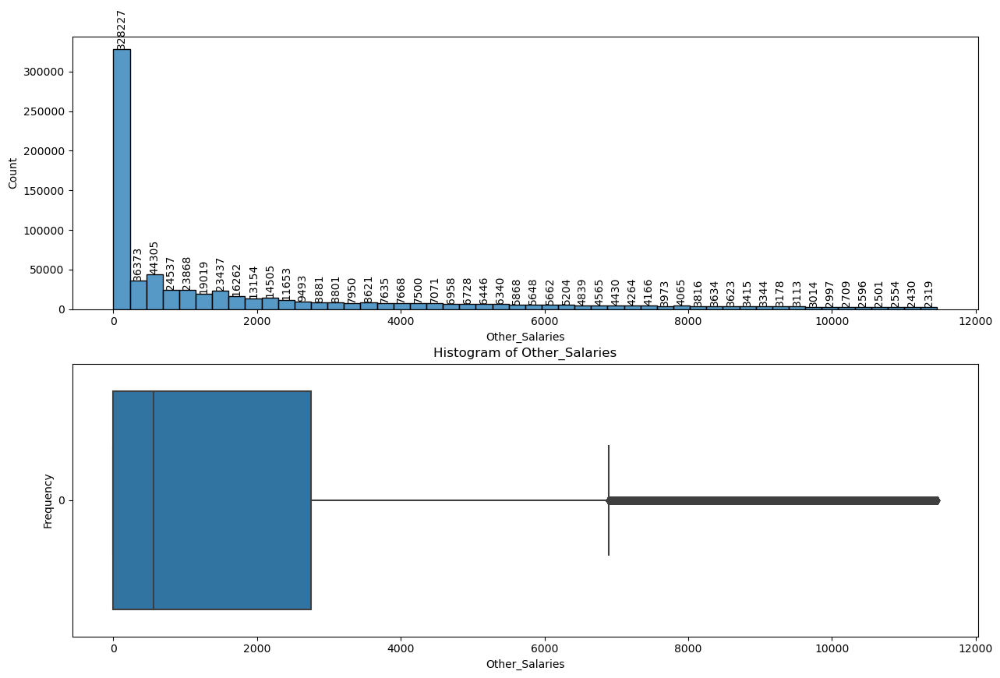

In [66]:
outlier('Other_Salaries')

# Analysis of Total_Salary

In [67]:
numerical_data('Total_Salary')

Number of Missing values in Total_Salary is 0
Mode of Total_Salary is 250.0
Mean of Total_Salary is 84545.489
Median of Total_Salary is 80251.785
Standard Deviation of Total_Salary is 58913.129
Unique Values in Total_Salary are 755716


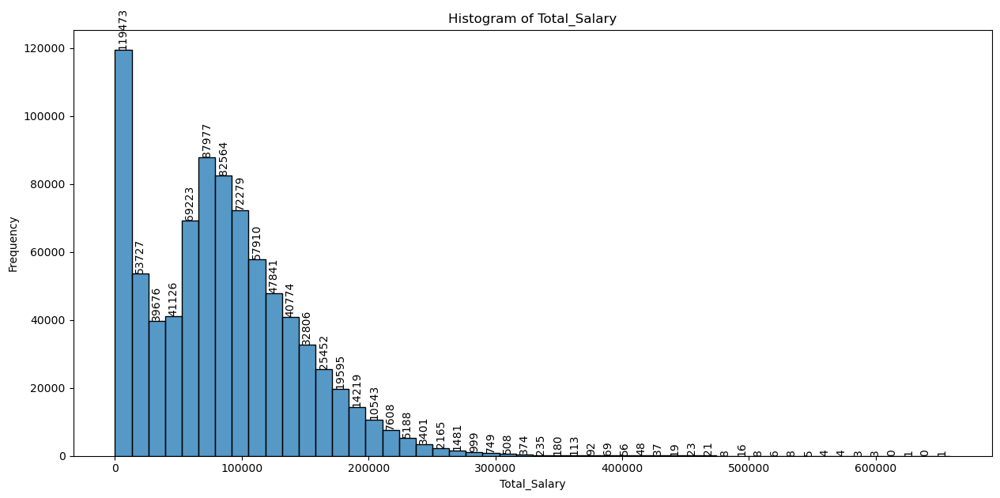

In [68]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Total_Salary'], bins=50)
plt.xlabel('Total_Salary')
plt.ylabel('Frequency')
plt.title('Histogram of Total_Salary')
barcount(ax)
plt.show()

Q1 : 38419.96 Q3 : 119910.01
Inter Quartile Range  81490.04999999999
UPPER_FRAME : 242145.08499999996 LOWER_FRAME : -83815.11499999999


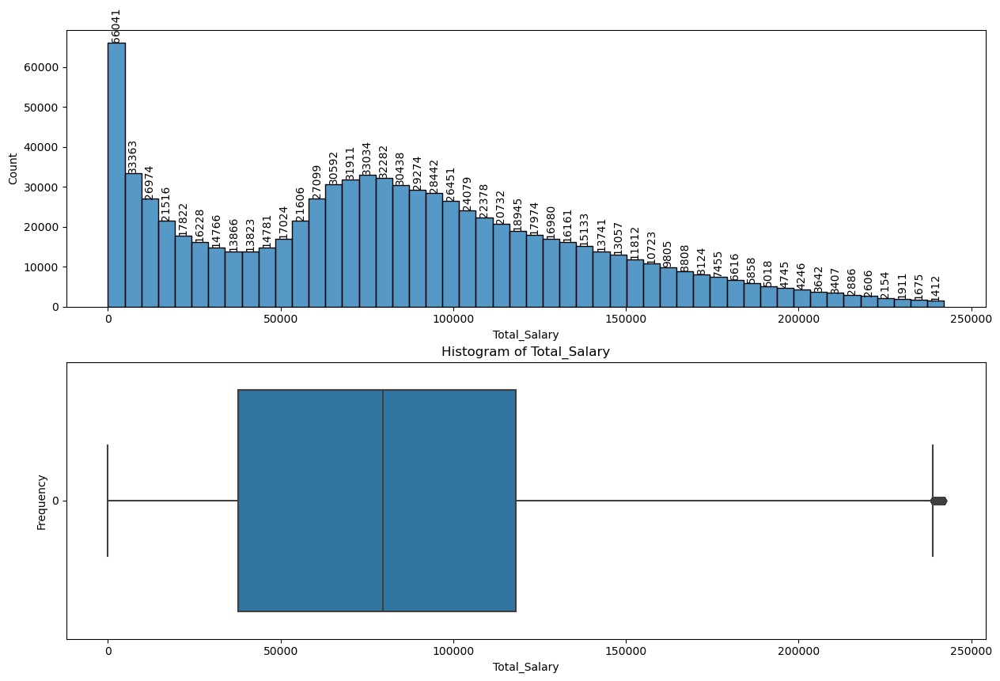

In [69]:
outlier('Total_Salary')

# Analysis of Retirement

In [70]:
numerical_data('Retirement')

Number of Missing values in Retirement is 0
Mode of Retirement is 0.0
Mean of Retirement is 15121.313
Median of Retirement is 15116.12
Standard Deviation of Retirement is 11319.857
Unique Values in Retirement are 557758


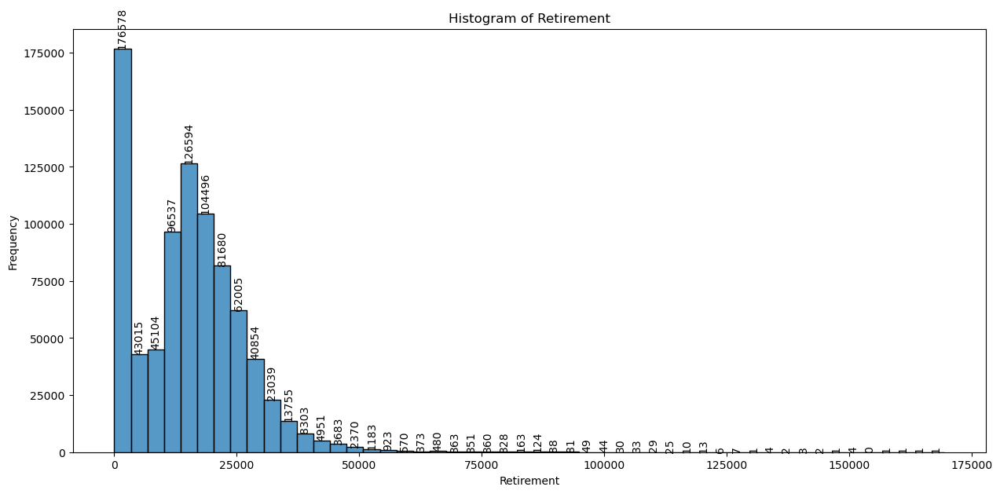

In [71]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Retirement'], bins=50)
plt.xlabel('Retirement')
plt.ylabel('Frequency')
plt.title('Histogram of Retirement')
barcount(ax)
plt.show()

Q1 : 6014.5025000000005 Q3 : 21734.1075
Inter Quartile Range  15719.604999999998
UPPER_FRAME : 45313.515 LOWER_FRAME : -17564.905


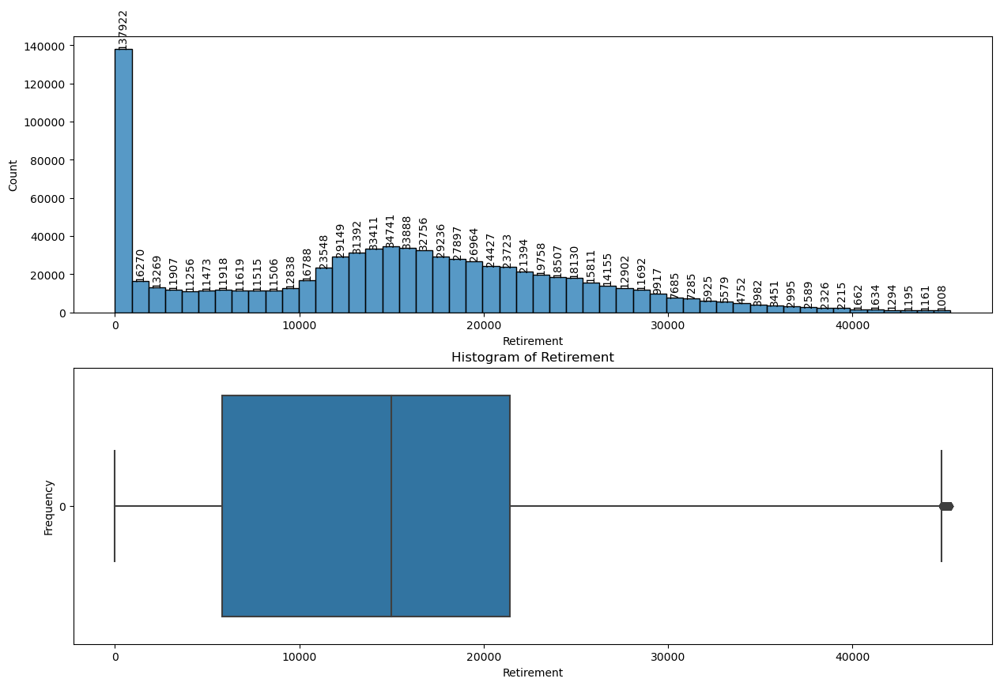

In [72]:
outlier('Retirement')

# Analysis of Health_and_Dental

In [73]:
numerical_data('Health_and_Dental')

Number of Missing values in Health_and_Dental is 0
Mode of Health_and_Dental is 0.0
Mean of Health_and_Dental is 10090.836
Median of Health_and_Dental is 12548.45
Standard Deviation of Health_and_Dental is 6355.17
Unique Values in Health_and_Dental are 242278


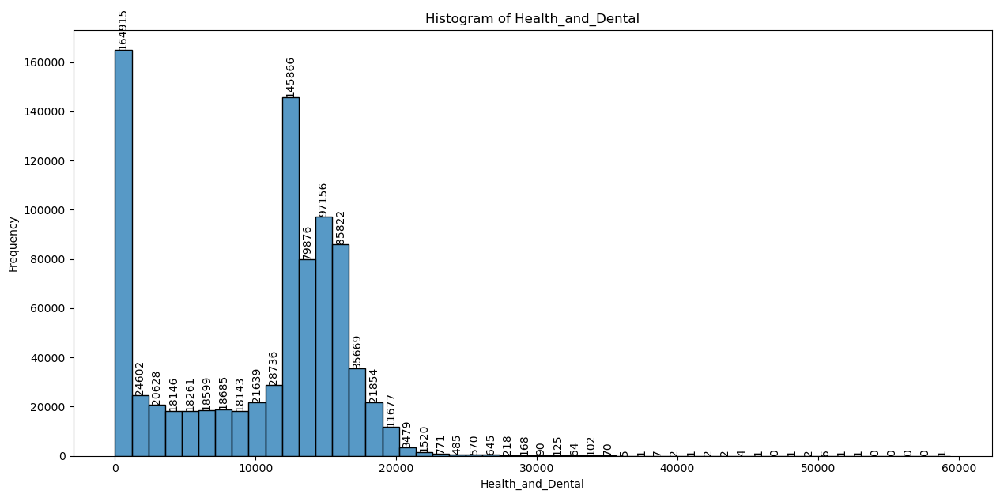

In [74]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Health_and_Dental'], bins=50)
plt.xlabel('Health_and_Dental')
plt.ylabel('Frequency')
plt.title('Histogram of Health_and_Dental')
barcount(ax)
plt.show()

Q1 : 3526.95 Q3 : 14950.3
Inter Quartile Range  11423.349999999999
UPPER_FRAME : 32085.324999999997 LOWER_FRAME : -13608.074999999997


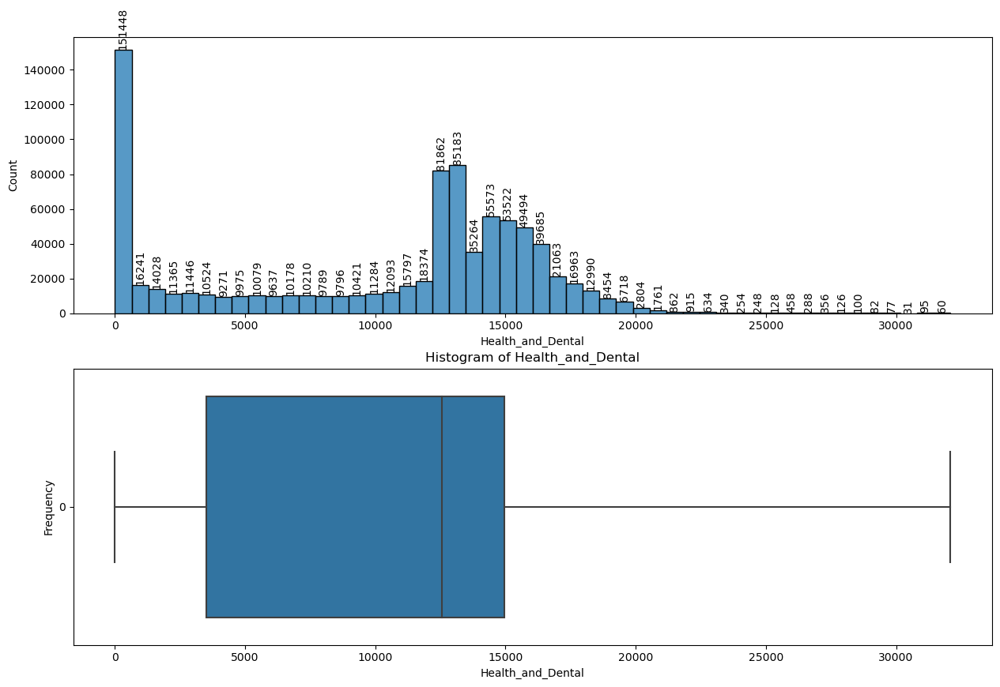

In [75]:
outlier('Health_and_Dental')

In [76]:
num.columns

Index(['Organization_Group_Code', 'Year', 'Union_Code', 'Employee_Identifier',
       'Salaries', 'Overtime', 'Other_Salaries', 'Total_Salary', 'Retirement',
       'Health_and_Dental', 'Other_Benefits', 'Total_Benefits',
       'Total_Compensation'],
      dtype='object')

# Analysis of Other_Benefits

In [77]:
numerical_data('Other_Benefits')

Number of Missing values in Other_Benefits is 0
Mode of Other_Benefits is 0.0
Mean of Other_Benefits is 5342.521
Median of Other_Benefits is 5233.245
Standard Deviation of Other_Benefits is 3801.656
Unique Values in Other_Benefits are 586210


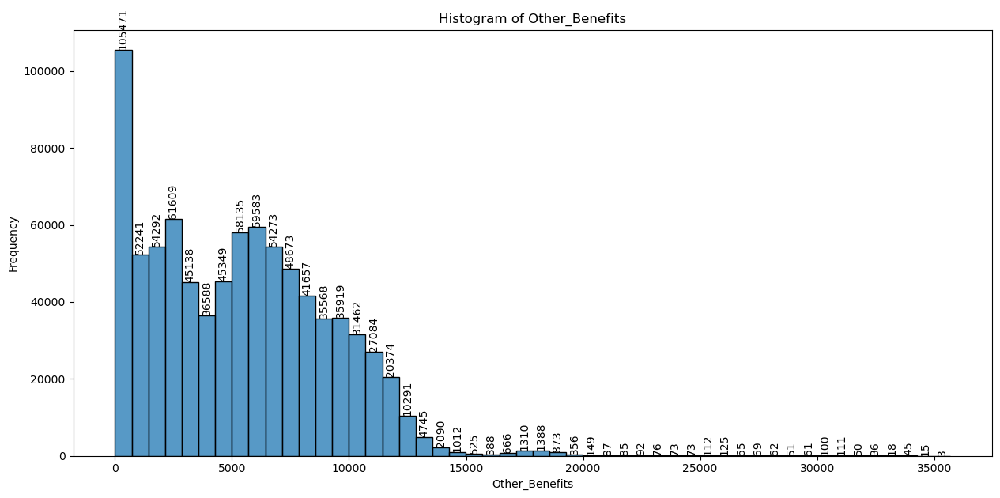

In [78]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Other_Benefits'], bins=50)
plt.xlabel('Other_Benefits')
plt.ylabel('Frequency')
plt.title('Histogram of Other_Benefits')
barcount(ax)
plt.show()

Q1 : 2114.04 Q3 : 7972.3975
Inter Quartile Range  5858.3575
UPPER_FRAME : 16759.93375 LOWER_FRAME : -6673.496250000001


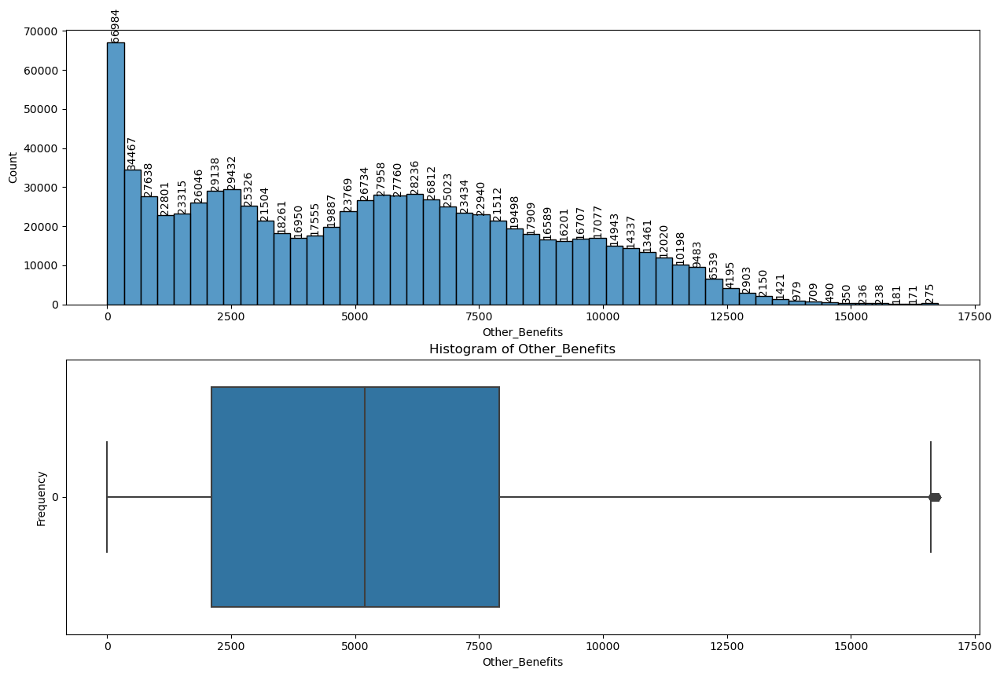

In [79]:
outlier('Other_Benefits')

# Analysis of Total_Benefits

In [80]:
numerical_data('Total_Benefits')

Number of Missing values in Total_Benefits is 0
Mode of Total_Benefits is 0.0
Mean of Total_Benefits is 30554.67
Median of Total_Benefits is 33886.905
Standard Deviation of Total_Benefits is 19034.973
Unique Values in Total_Benefits are 749936


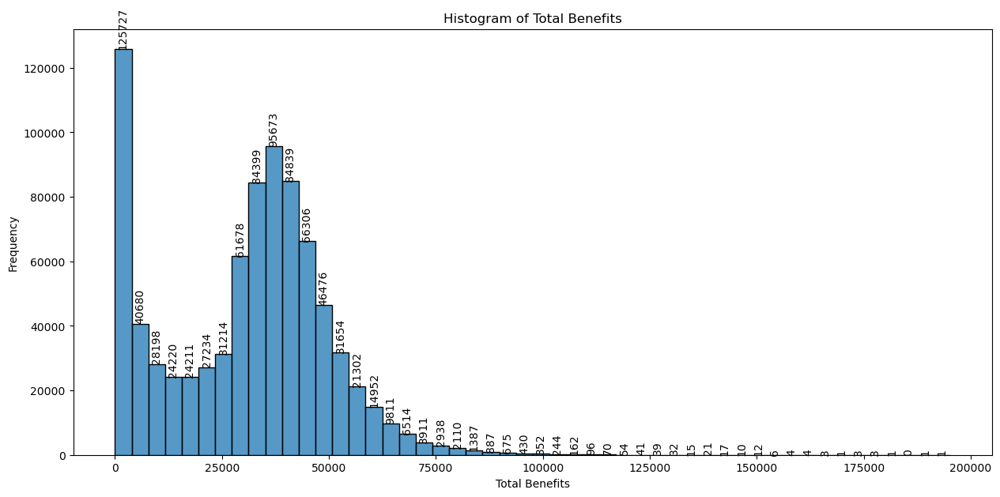

In [81]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Total_Benefits'], bins=50)
plt.xlabel('Total Benefits')
plt.ylabel('Frequency')
plt.title('Histogram of Total Benefits')
barcount(ax)
plt.show()


Q1 : 14147.4175 Q3 : 42995.275
Inter Quartile Range  28847.857500000002
UPPER_FRAME : 86267.06125 LOWER_FRAME : -29124.368750000005


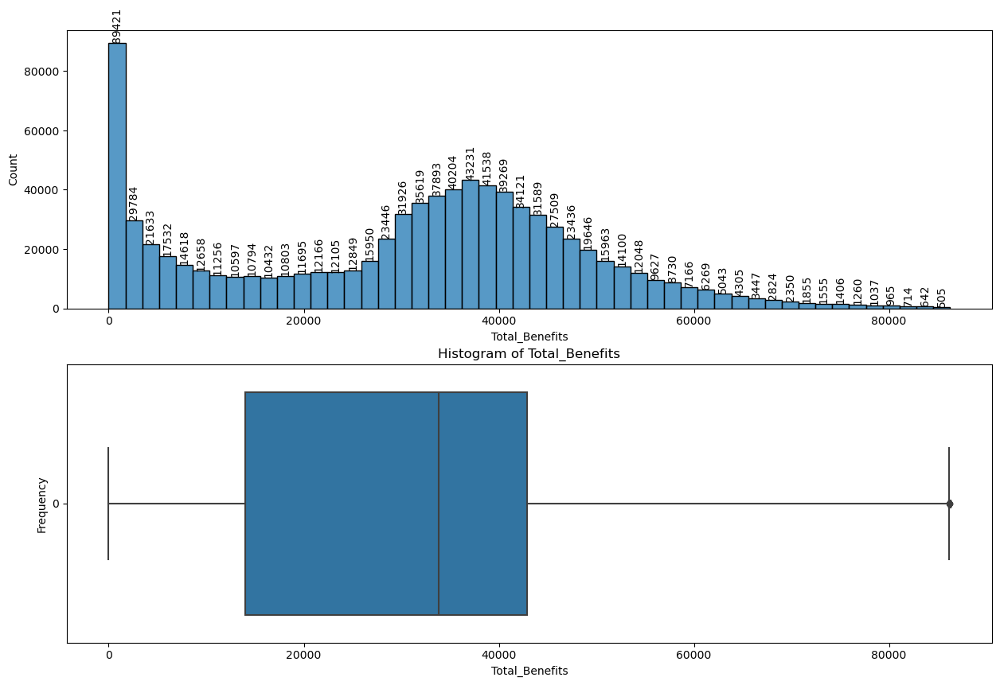

In [82]:
outlier('Total_Benefits')

# Analysis of Target Variable Total_Compensation

In [83]:
numerical_data('Total_Compensation')

Number of Missing values in Total_Compensation is 0
Mode of Total_Compensation is 268.74
Mean of Total_Compensation is 115100.159
Median of Total_Compensation is 114431.545
Standard Deviation of Total_Compensation is 76254.74
Unique Values in Total_Compensation are 806753


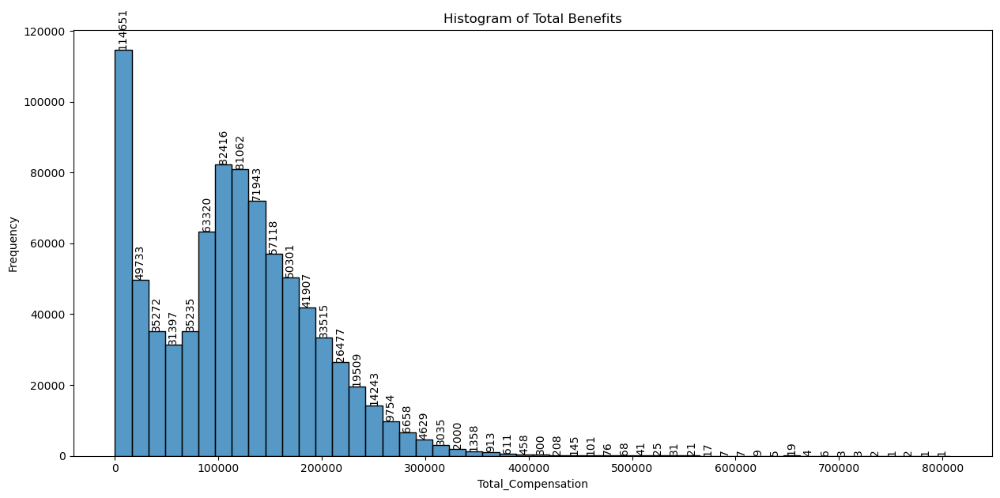

In [84]:
fig,ax=plt.subplots(figsize=(15,7))
ax = sns.histplot(df['Total_Compensation'], bins=50)
plt.xlabel('Total_Compensation')
plt.ylabel('Frequency')
plt.title('Histogram of Total Benefits')
barcount(ax)
plt.show()

Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


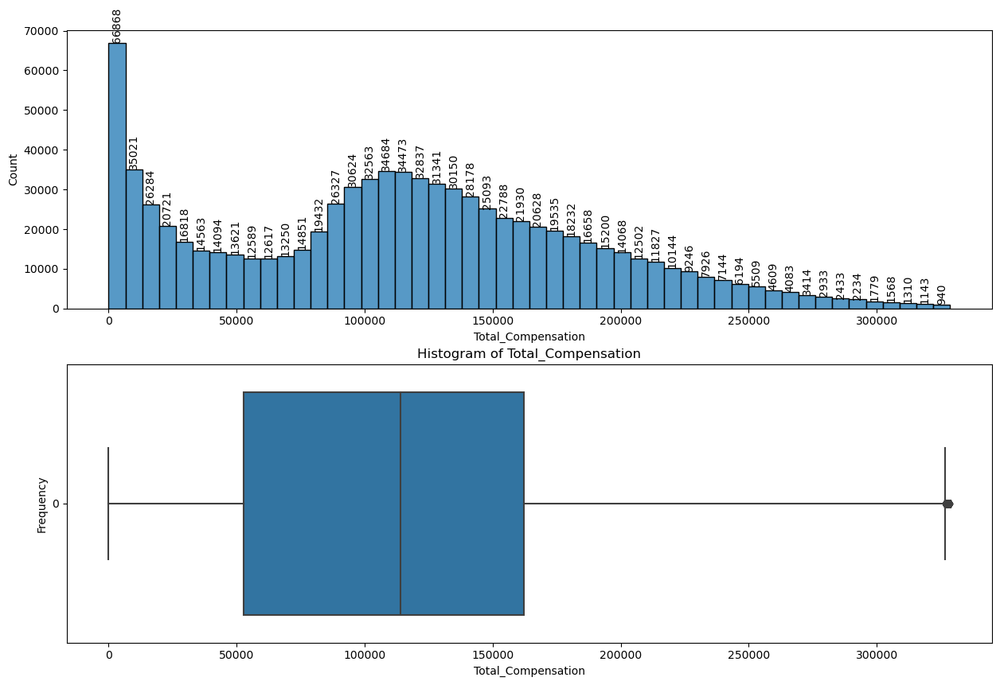

In [85]:
outlier('Total_Compensation')

In [86]:
num.corr()

,Organization_Group_Code,Year,Union_Code,Employee_Identifier,Salaries,Overtime,Other_Salaries,Total_Salary,Retirement,Health_and_Dental,Other_Benefits,Total_Benefits,Total_Compensation
Organization_Group_Code,1.000000,0.001975,-0.009197,0.003127,-0.180270,-0.290362,-0.220627,-0.255011,-0.225375,-0.205507,0.044183,-0.193758,-0.245372
Year,0.001975,1.000000,-0.000499,0.916597,0.199154,0.102290,0.031000,0.199084,0.207039,0.084061,0.163924,0.183863,0.199699
Union_Code,-0.009197,-0.000499,1.000000,0.001303,-0.110295,0.089384,0.138479,-0.053259,-0.115132,-0.102316,-0.343545,-0.171191,-0.083892
Employee_Identifier,0.003127,0.916597,0.001303,1.000000,0.192346,0.096762,0.016107,0.189959,0.185639,0.123706,0.153906,0.182378,0.192280
Salaries,-0.180270,0.199154,-0.110295,0.192346,1.000000,0.254514,0.292705,0.952598,0.922356,0.660642,0.738752,0.916336,0.964676
Overtime,-0.290362,0.102290,0.089384,0.096762,0.254514,1.000000,0.349699,0.513025,0.310215,0.238659,0.076013,0.279255,0.466026
Other_Salaries,-0.220627,0.031000,0.138479,0.016107,0.292705,0.349699,1.000000,0.467519,0.325948,0.164786,0.069577,0.262658,0.426730
Total_Salary,-0.255011,0.199084,-0.053259,0.189959,0.952598,0.513025,0.467519,1.000000,0.904887,0.643270,0.656447,0.883718,0.993146
Retirement,-0.225375,0.207039,-0.115132,0.185639,0.922356,0.310215,0.325948,0.904887,1.000000,0.667765,0.654305,0.948005,0.935730
Health_and_Dental,-0.205507,0.084061,-0.102316,0.123706,0.660642,0.238659,0.164786,0.643270,0.667765,1.000000,0.562348,0.843083,0.707442


Further Analysis Columns - Salaries,Overtime,Other_Salaries,Total_Salary,Retirement,Health_and_Dental,Other_Benefits,Total_Benefits

# <center> Level 2 Analysis

In [87]:
def outlier2(col1,col2):
    q11 = df[col1].quantile(0.25)
    q31 = df[col1].quantile(0.75)
    print("Q1 :",q11,"Q3 :",q31)
    iqr1 = q31-q11
    print('Inter Quartile Range ', iqr1)
    UF1 = q3+1.5*iqr1
    LF1 = q1-1.5*iqr1
    print("UPPER_FRAME :",UF1,"LOWER_FRAME :",LF1)
    
    q12 = df[col2].quantile(0.25)
    q32 = df[col2].quantile(0.75)
    print("Q1 :",q12,"Q3 :",q32)
    iqr2 = q32-q12
    print('Inter Quartile Range ', iqr2)
    UF2 = q32+1.5*iqr2
    LF2 = q12-1.5*iqr2
    print("UPPER_FRAME :",UF2,"LOWER_FRAME :",LF2)
    DC2 = df[(df[col2]>LF2)&(df[col2]<UF2)&(df[col1]>LF1)&(df[col1]<UF1)]
    
    fig,ax=plt.subplots(figsize=(15,7))
    sns.set(style='darkgrid')
    ax = sns.scatterplot(x=col1,y=col2,data=DC2)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

# Analysis of Total_Compensation vs Salaries

In [88]:
q1 = df.Salaries.quantile(0.25)
q3 = df.Salaries.quantile(0.75)
print("Q1 :",q1,"Q3 :",q3)
iqr = q3-q1
print('Inter Quartile Range ', iqr)
UF = q3+1.5*iqr
LF = q1-1.5*iqr
print("UPPER_FRAME :",UF,"LOWER_FRAME :",LF)
DC2 = df[(df.Salaries>LF)&(df.Salaries<UF)]

Q1 : 34966.3125 Q3 : 107168.82
Inter Quartile Range  72202.5075
UPPER_FRAME : 215472.58125000002 LOWER_FRAME : -73337.44875000001


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3877581925.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90);


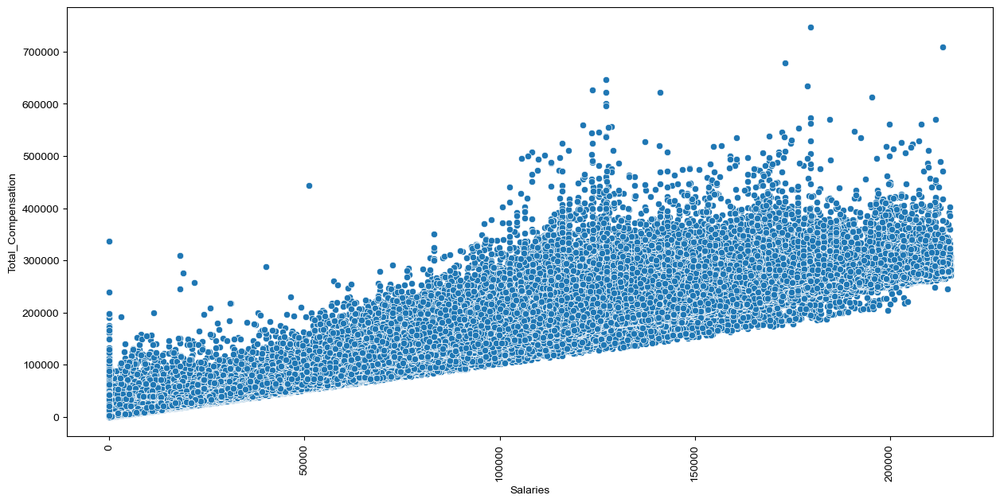

In [89]:
fig,ax=plt.subplots(figsize=(15,7))
sns.set(style='darkgrid')
ax = sns.scatterplot(x='Salaries',y='Total_Compensation',data=DC2)
#ax = sns.barplot(x='Salaries',y='Total_Compensation',data=DC2)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

# Analysis of Total_Compensation vs Overtime

Q1 : 0.0 Q3 : 4960.455
Inter Quartile Range  4960.455
UPPER_FRAME : 114609.5025 LOWER_FRAME : 27525.63
Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3739596390.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


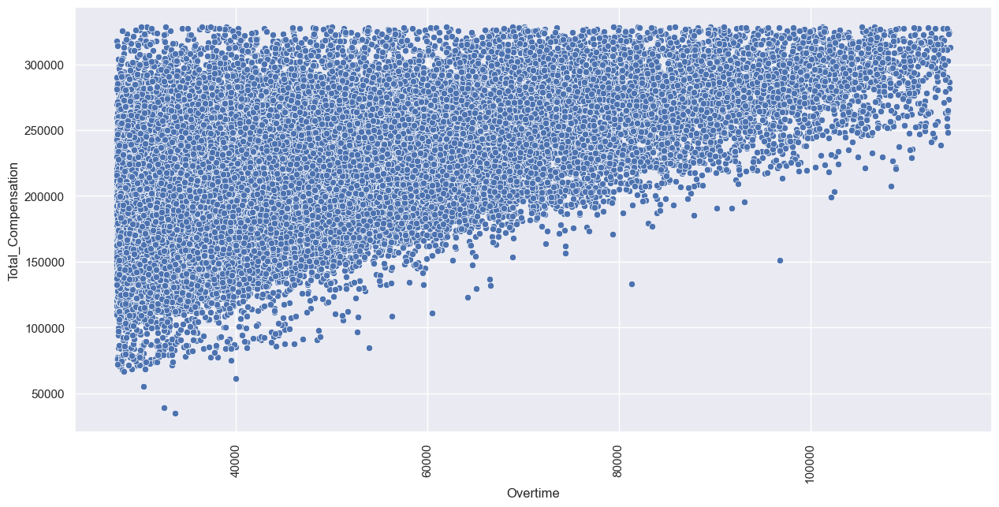

In [90]:
outlier2('Overtime','Total_Compensation')

# Analysis of Total_Compensation vs Other_Salaries

Q1 : 0.0 Q3 : 4585.36
Inter Quartile Range  4585.36
UPPER_FRAME : 114046.86 LOWER_FRAME : 28088.2725
Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3739596390.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


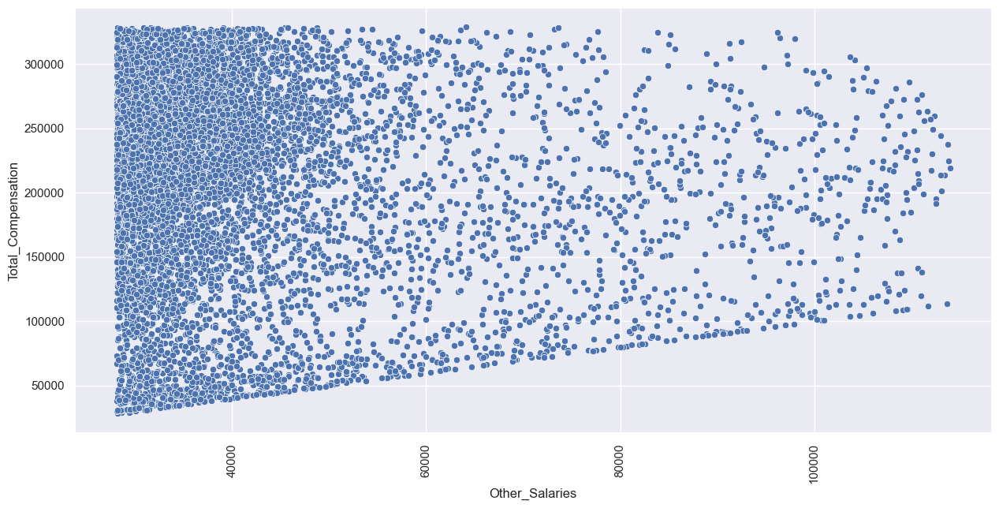

In [91]:
outlier2('Other_Salaries','Total_Compensation')

# Analysis of Total_Compensation vs Total_Salary

Q1 : 38419.96 Q3 : 119910.01
Inter Quartile Range  81490.04999999999
UPPER_FRAME : 229403.895 LOWER_FRAME : -87268.76249999998
Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3739596390.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


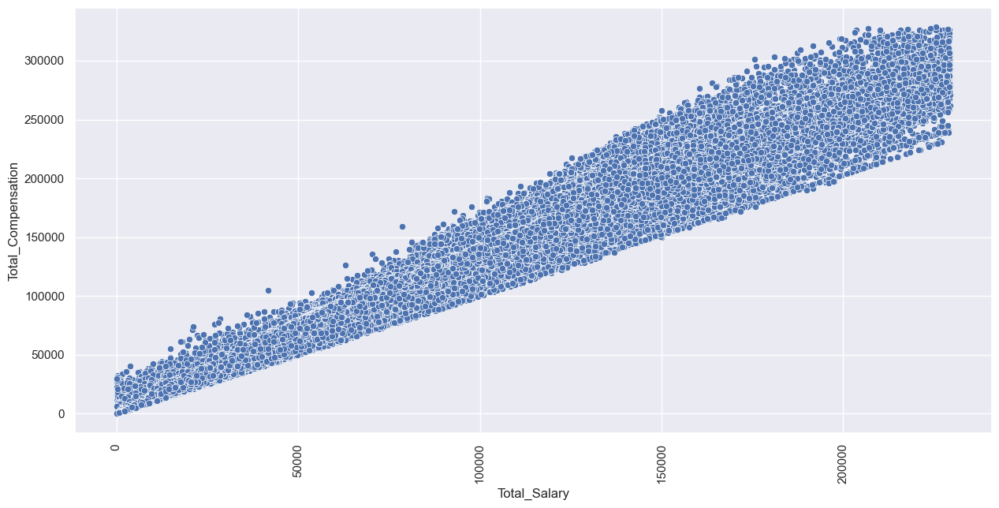

In [92]:
outlier2('Total_Salary','Total_Compensation')

# Analysis of Total_Compensation vs Retirement

Q1 : 6014.5025000000005 Q3 : 21734.1075
Inter Quartile Range  15719.604999999998
UPPER_FRAME : 130748.22750000001 LOWER_FRAME : 11386.905000000002
Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3739596390.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


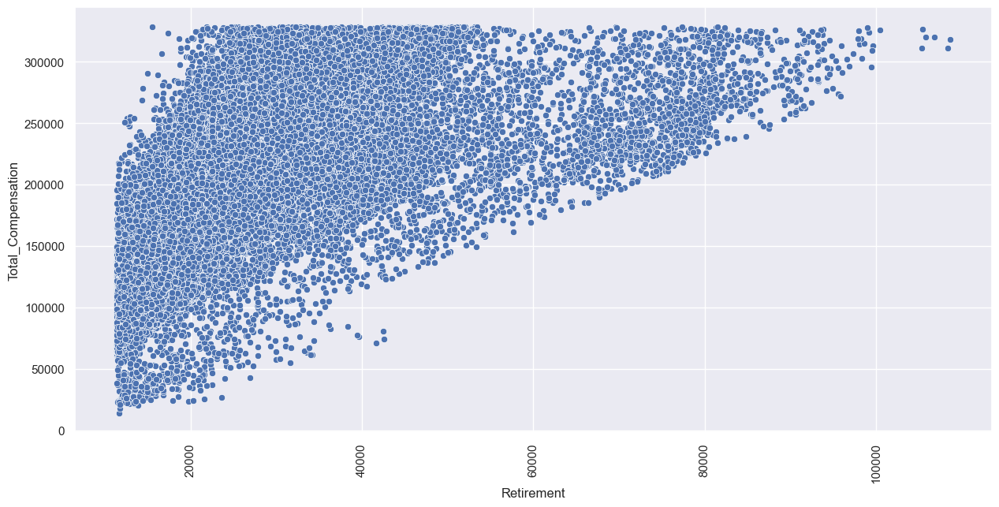

In [93]:
outlier2('Retirement','Total_Compensation')

# Analysis of Total_Compensation vs Health_and_Dental

Q1 : 3526.95 Q3 : 14950.3
Inter Quartile Range  11423.349999999999
UPPER_FRAME : 124303.845 LOWER_FRAME : 17831.287500000002
Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3739596390.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


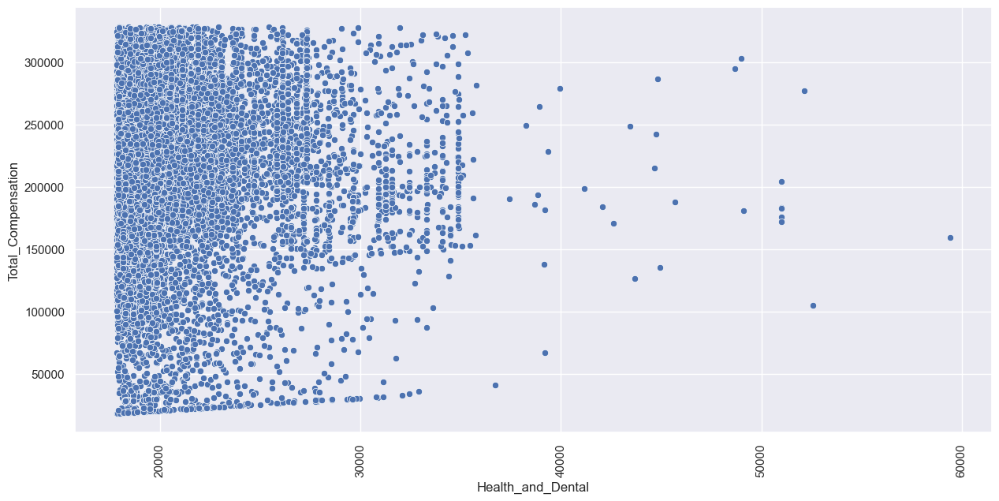

In [94]:
outlier2('Health_and_Dental','Total_Compensation')

# Analysis of Total_Compensation vs Other_Benefits

Q1 : 2114.04 Q3 : 7972.3975
Inter Quartile Range  5858.3575
UPPER_FRAME : 115956.35625000001 LOWER_FRAME : 26178.77625
Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3739596390.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


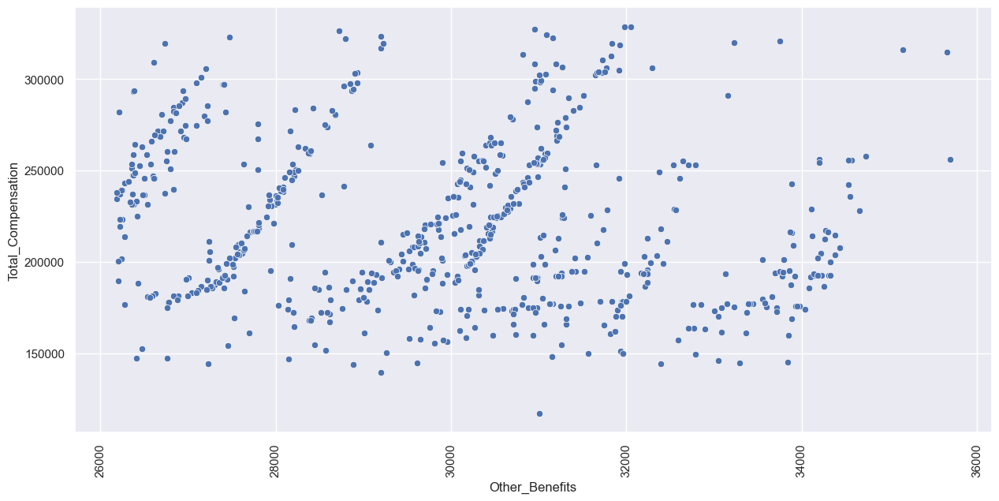

In [95]:
outlier2('Other_Benefits','Total_Compensation')

# Analysis of Total_Compensation vs Total_Benefits

Q1 : 14147.4175 Q3 : 42995.275
Inter Quartile Range  28847.857500000002
UPPER_FRAME : 150440.60625 LOWER_FRAME : -8305.473750000005
Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3739596390.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


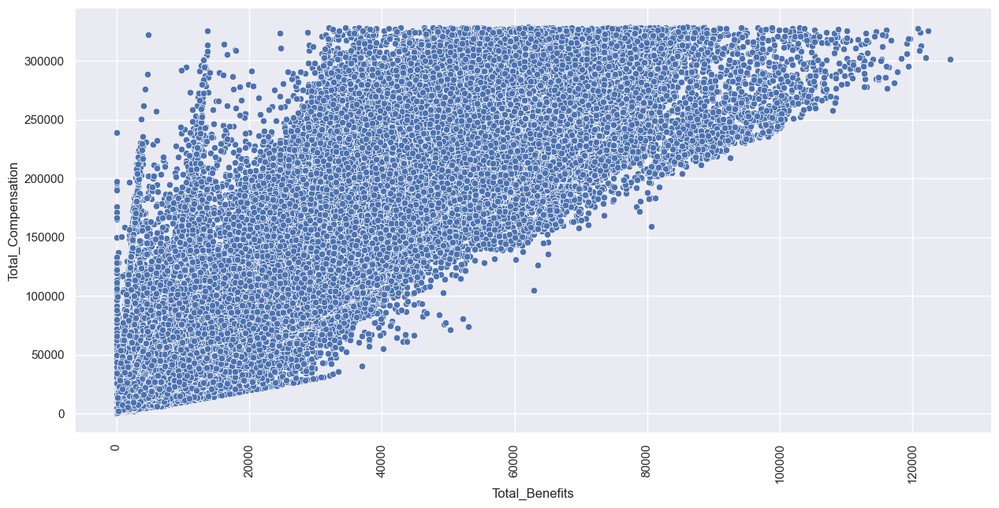

In [96]:
outlier2('Total_Benefits','Total_Compensation')

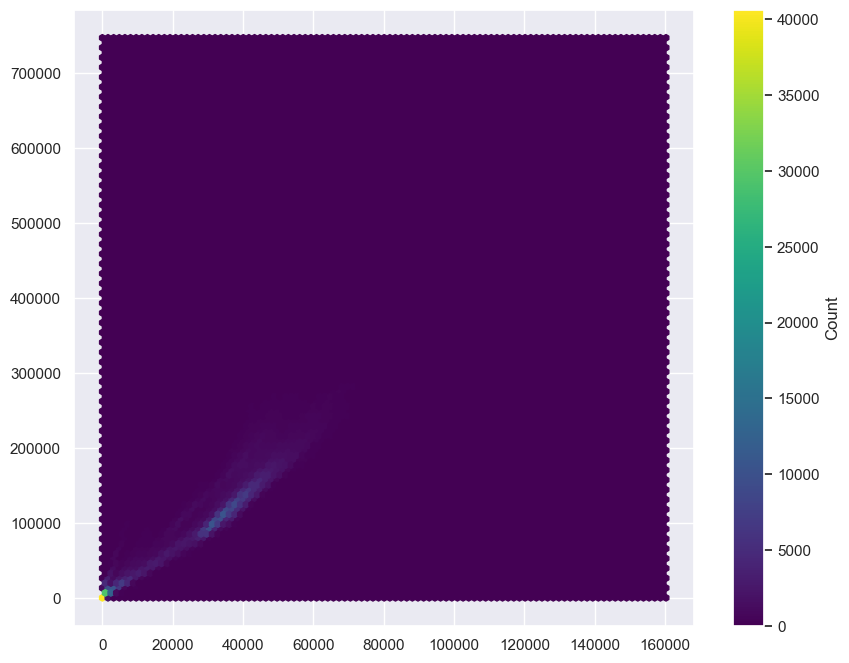

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 8))
sns.set(style='darkgrid')

#ax = sns.boxplot(x='Total_Benefits', y='Total_Compensation', data=DC2)
# Create a hexbin plot

ax = plt.hexbin(x='Total_Benefits', y='Total_Compensation', data=DC2, gridsize=100, cmap='viridis')

# Add a colorbar
cbar = plt.colorbar(ax)
cbar.set_label('Count')

# Set labels and title
#ax.set_xlabel('Column 1')
#ax.set_ylabel('Column 2')
#ax.set_title('Hexbin Plot')
plt.show()


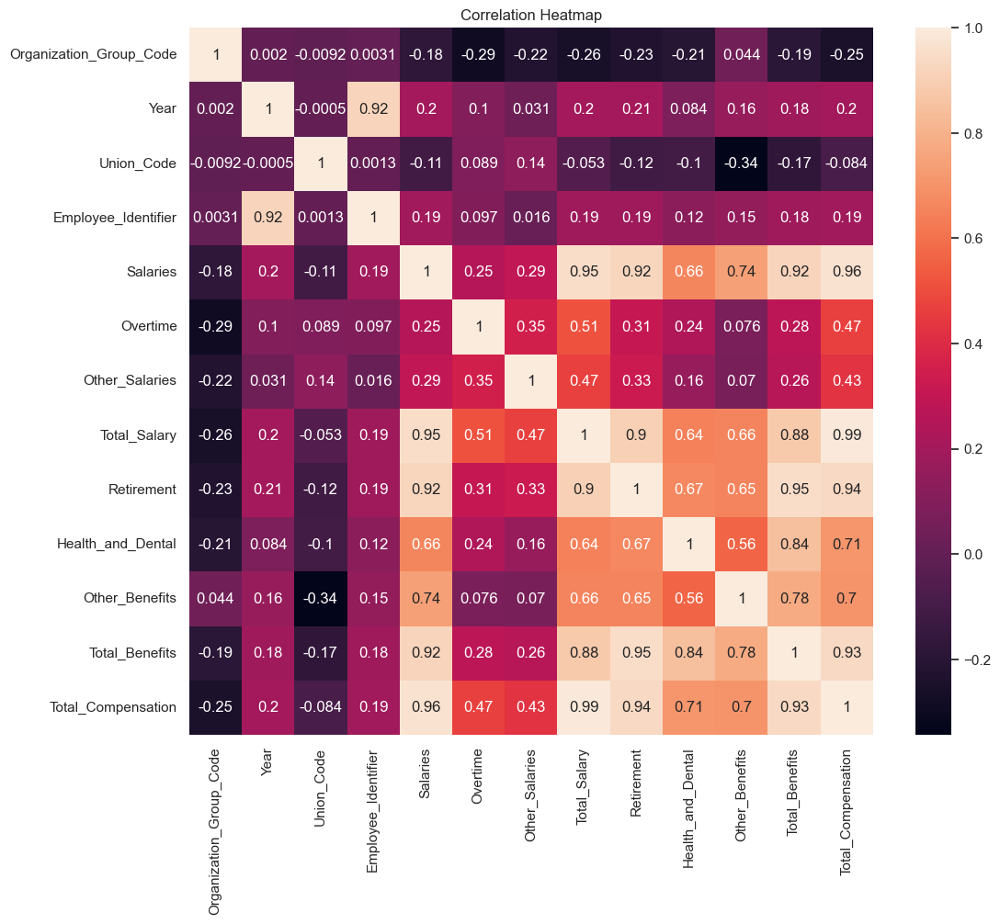

In [98]:
import seaborn as sns

fig, ax = plt.subplots(figsize=(12, 10))
correlation_matrix = num.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Heatmap')
plt.show()

In [99]:
cat

,Job_Family_Code,Job_Code,Year_Type,Organization_Group,Department_Code,Department,Union,Job_Family,Job
0,1400,1404,Fiscal,Human Welfare & Neighborhood Development,HSA,Human Services,"SEIU, Local 1021, Misc","Clerical, Secretarial & Steno",Clerk
1,9700,9703,Fiscal,Human Welfare & Neighborhood Development,HSA,Human Services,"SEIU, Local 1021, Misc",Community Development,HSA Emp & Training Spec II
2,2900,2918,Fiscal,Human Welfare & Neighborhood Development,HSA,Human Services,"SEIU, Local 1021, Misc",Human Services,HSA Social Worker
3,2900,2918,Fiscal,Human Welfare & Neighborhood Development,HSA,Human Services,"SEIU, Local 1021, Misc",Human Services,HSA Social Worker
4,2900,2905,Fiscal,Human Welfare & Neighborhood Development,HSA,Human Services,"SEIU, Local 1021, Misc",Human Services,HSA Sr Eligibility Worker
...,...,...,...,...,...,...,...,...,...
840500,7300,7345,Fiscal,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,"Electrical Workers, Local 6",Journeyman Trade,Electrician
840501,7300,7345,Fiscal,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,"Electrical Workers, Local 6",Journeyman Trade,Electrician
840502,7300,7345,Calendar,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,"Electrical Workers, Local 6",Journeyman Trade,Electrician
840503,7300,7345,Calendar,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,"Electrical Workers, Local 6",Journeyman Trade,Electrician


In [100]:
df.columns

Index(['Organization_Group_Code', 'Job_Family_Code', 'Job_Code', 'Year_Type',
       'Year', 'Organization_Group', 'Department_Code', 'Department',
       'Union_Code', 'Union', 'Job_Family', 'Job', 'Employee_Identifier',
       'Salaries', 'Overtime', 'Other_Salaries', 'Total_Salary', 'Retirement',
       'Health_and_Dental', 'Other_Benefits', 'Total_Benefits',
       'Total_Compensation'],
      dtype='object')

Q1 : 53442.3425 Q3 : 163540.1575
Inter Quartile Range  110097.815
UPPER_FRAME : 328686.88 LOWER_FRAME : -111704.38


<Axes: xlabel='Total_Compensation', ylabel='Count'>

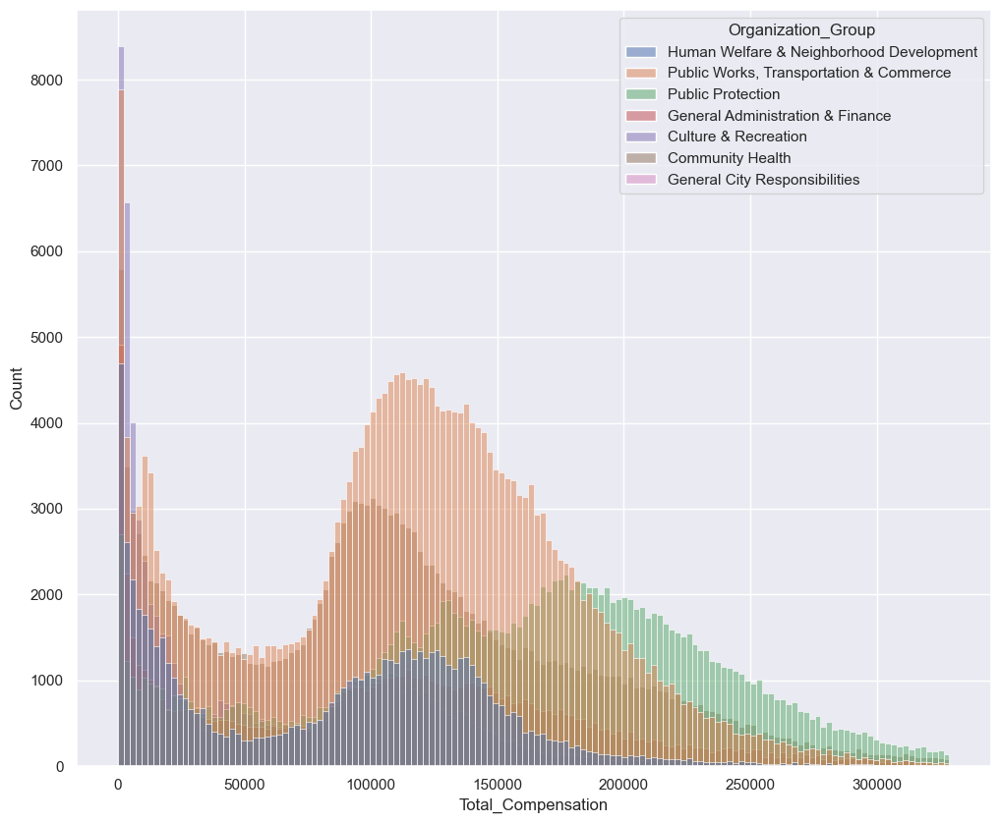

In [101]:
q1 = df['Total_Compensation'].quantile(0.25)
q3 = df['Total_Compensation'].quantile(0.75)
print("Q1 :",q1,"Q3 :",q3)
iqr = q3-q1
print('Inter Quartile Range ', iqr)
UF = q3+1.5*iqr
LF = q1-1.5*iqr
print("UPPER_FRAME :",UF,"LOWER_FRAME :",LF)
DC3 = df[(df['Total_Compensation']>LF)&(df['Total_Compensation']<UF)]

fig, ax = plt.subplots(figsize=(12, 10))
sns.set(style="darkgrid")

sns.histplot(x=DC3['Total_Compensation'],hue=DC3['Organization_Group'])

In [102]:
df.Organization_Group.value_counts()

Public Works, Transportation & Commerce     264685
Community Health                            186936
Public Protection                           161380
General Administration & Finance             77863
Culture & Recreation                         73711
Human Welfare & Neighborhood Development     73656
General City Responsibilities                  387
Name: Organization_Group, dtype: int64

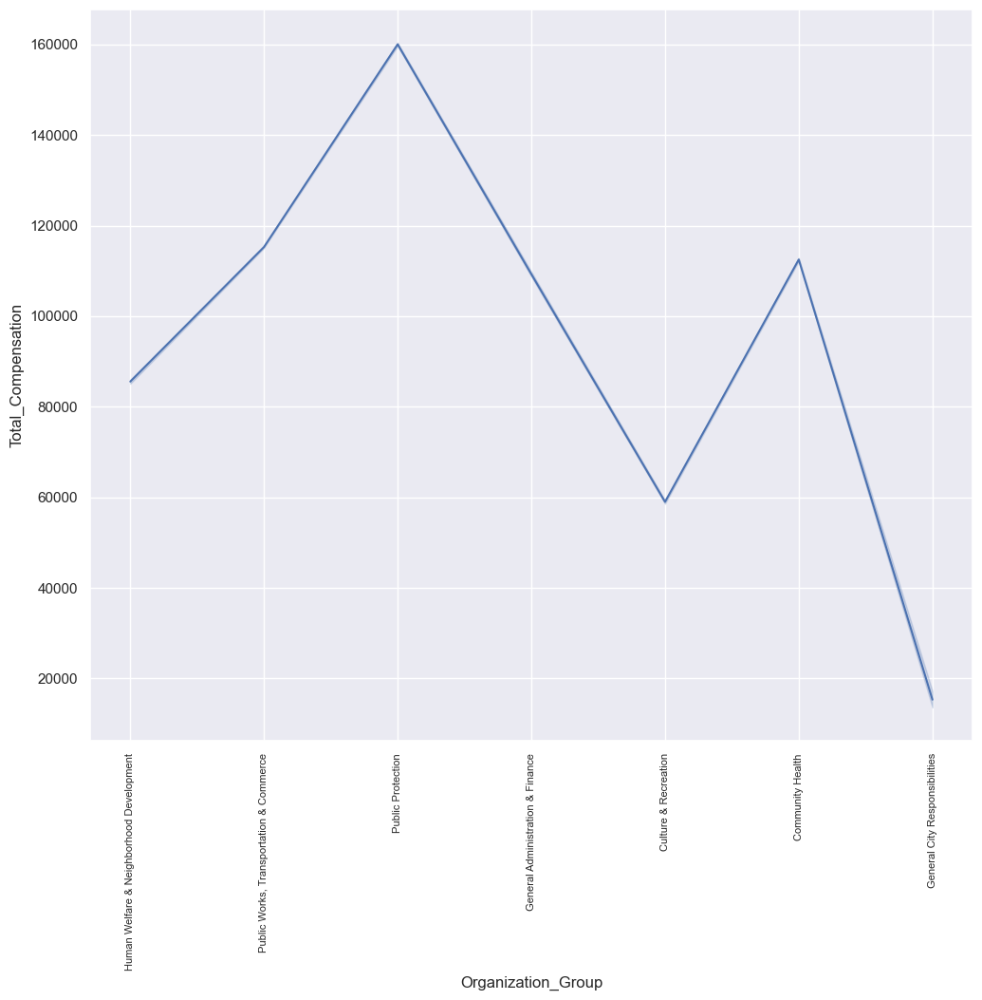

In [103]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.set(style="darkgrid")

sns.lineplot(y=df.Total_Compensation,x=df.Organization_Group)
plt.xticks(rotation=90,fontsize=8);


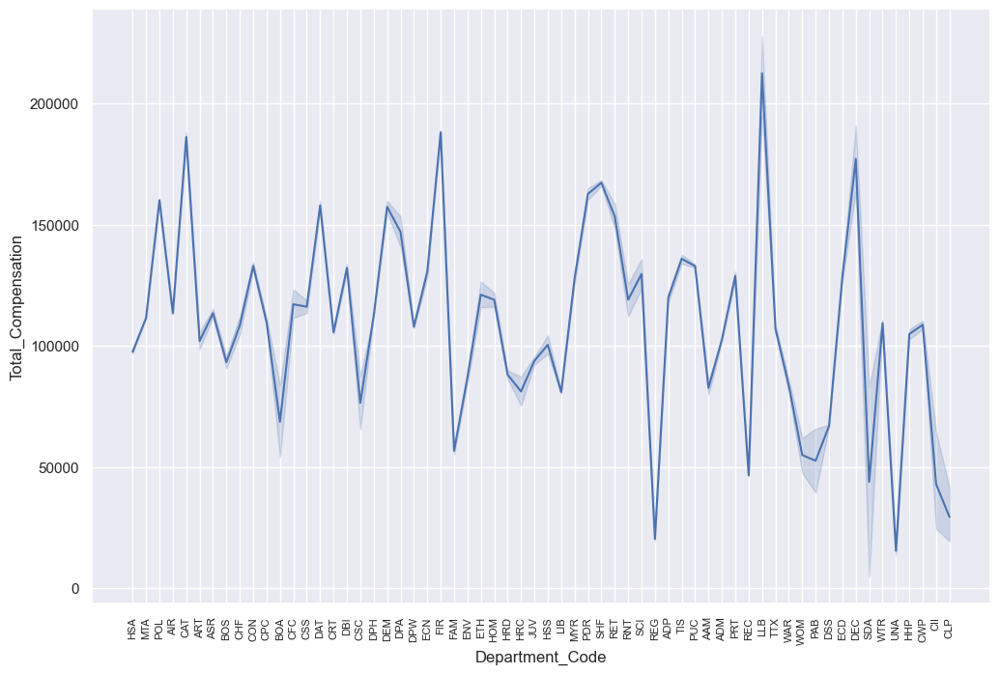

In [104]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set(style="darkgrid")

sns.lineplot(y=df.Total_Compensation,x=df.Department_Code)
plt.xticks(rotation=90,fontsize=8);

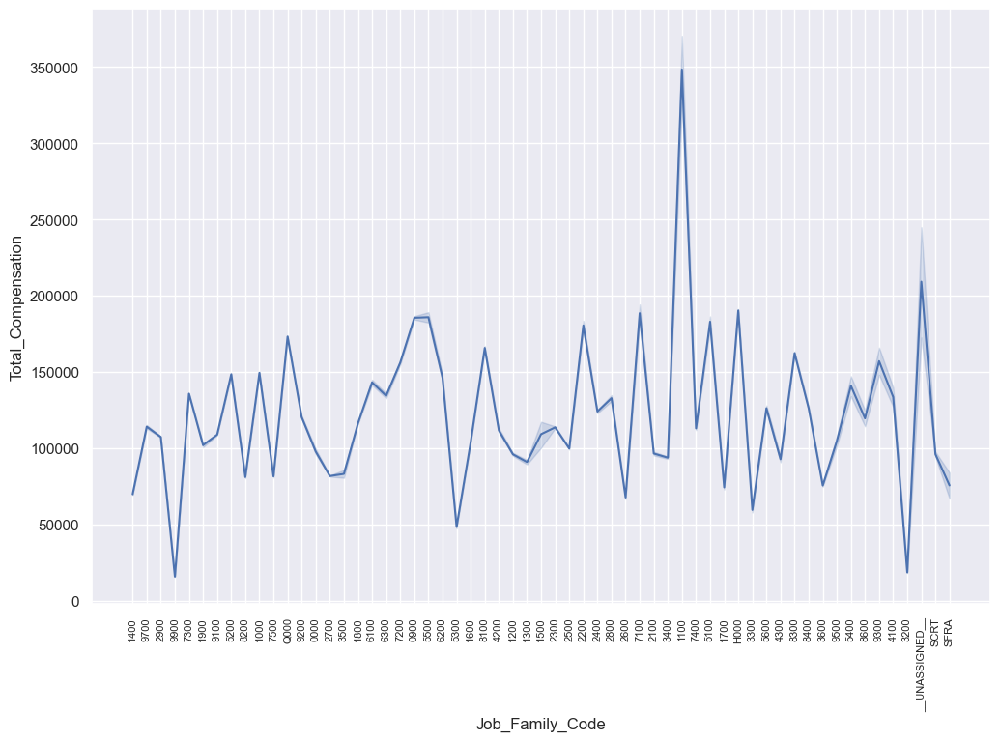

In [105]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set(style="darkgrid")

sns.lineplot(y=df.Total_Compensation,x=df.Job_Family_Code)
plt.xticks(rotation=90,fontsize=8);

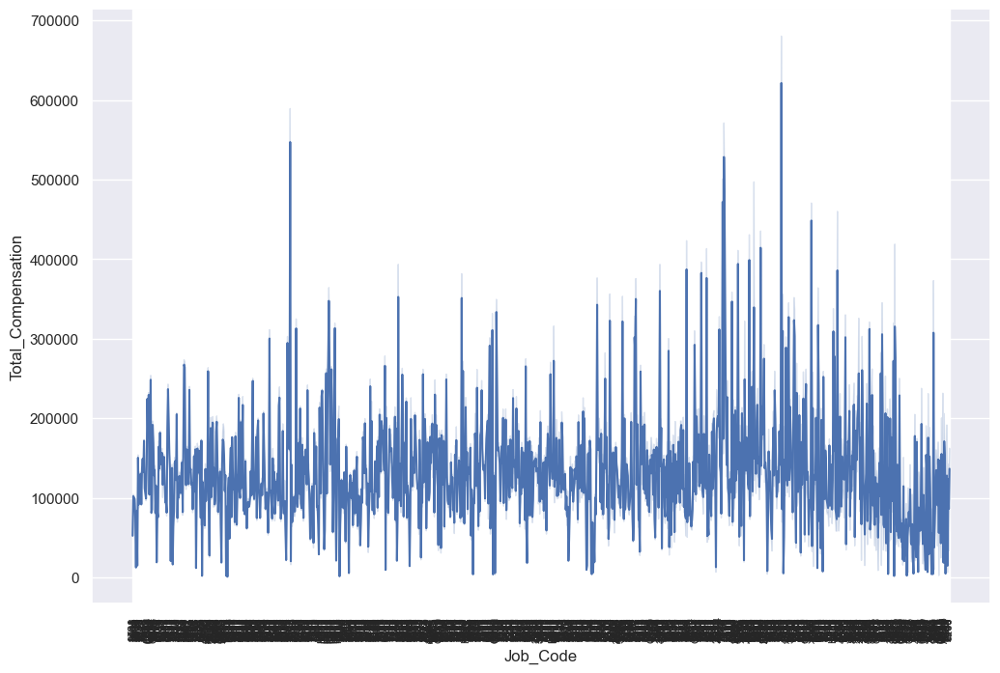

In [106]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set(style="darkgrid")

sns.lineplot(y=df.Total_Compensation,x=df.Job_Code)
plt.xticks(rotation=90,fontsize=8);

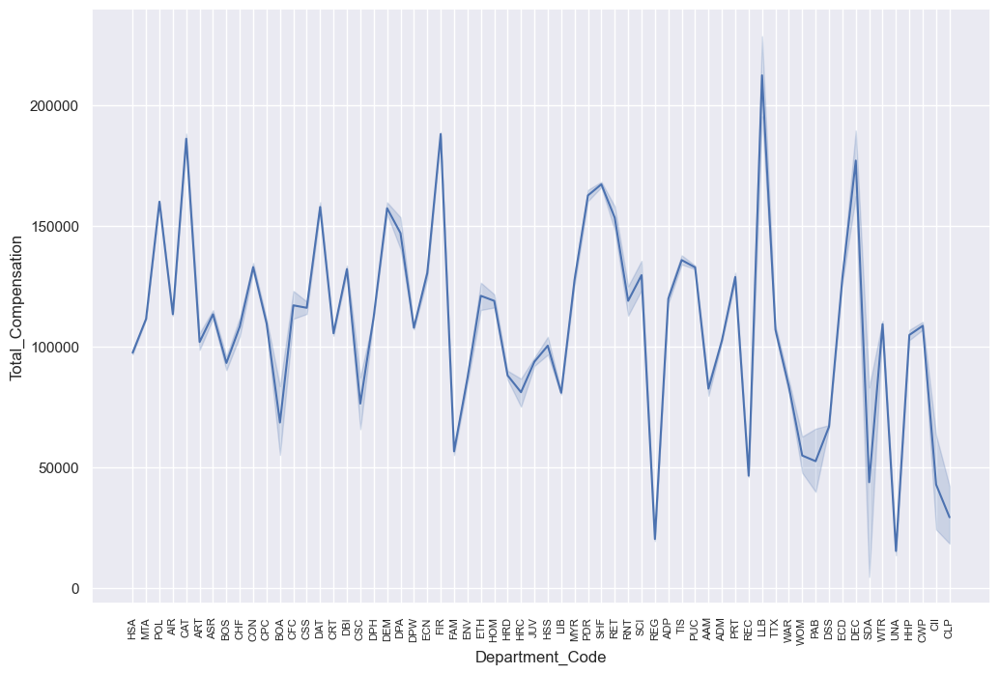

In [107]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set(style="darkgrid")

sns.lineplot(y=df.Total_Compensation,x=df.Department_Code)
plt.xticks(rotation=90,fontsize=8);

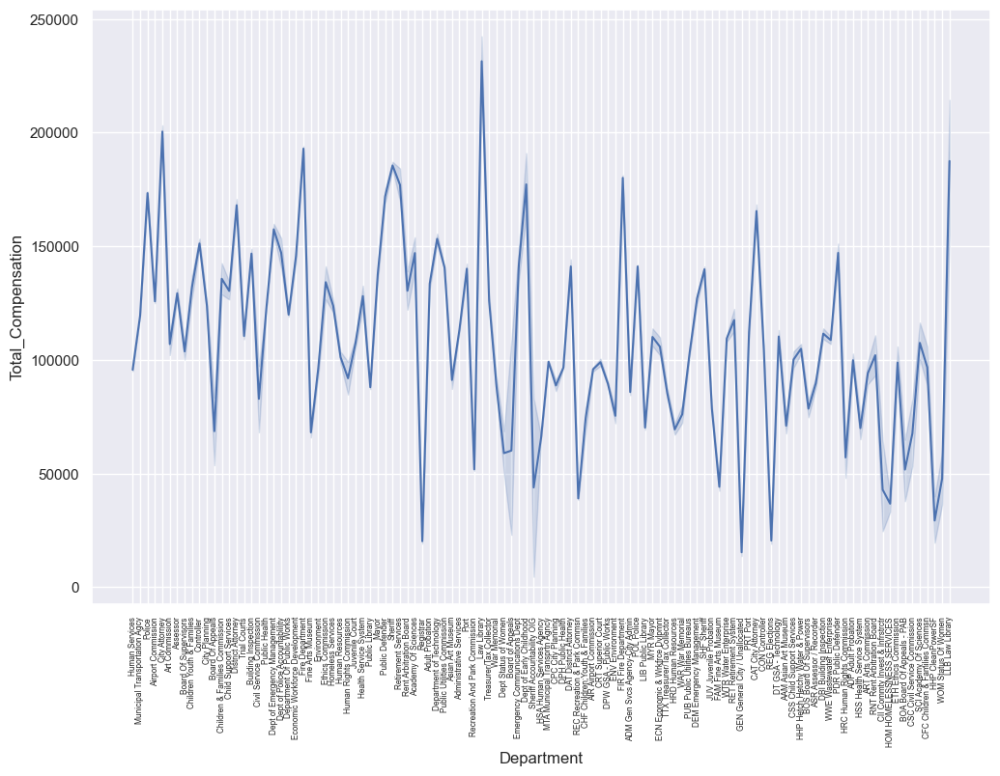

In [108]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set(style="darkgrid")

sns.lineplot(y=df.Total_Compensation,x=df.Department)
plt.xticks(rotation=90,fontsize=6);

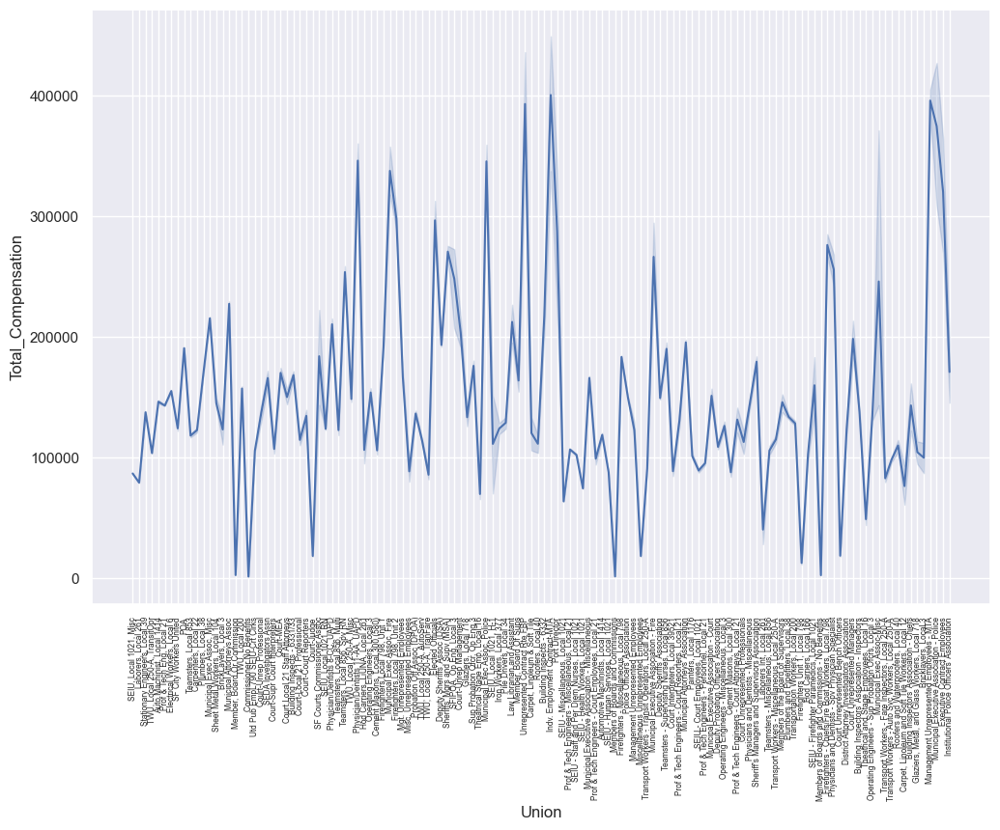

In [109]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set(style="darkgrid")

sns.lineplot(y=df.Total_Compensation,x=df.Union)
plt.xticks(rotation=90,fontsize=6);

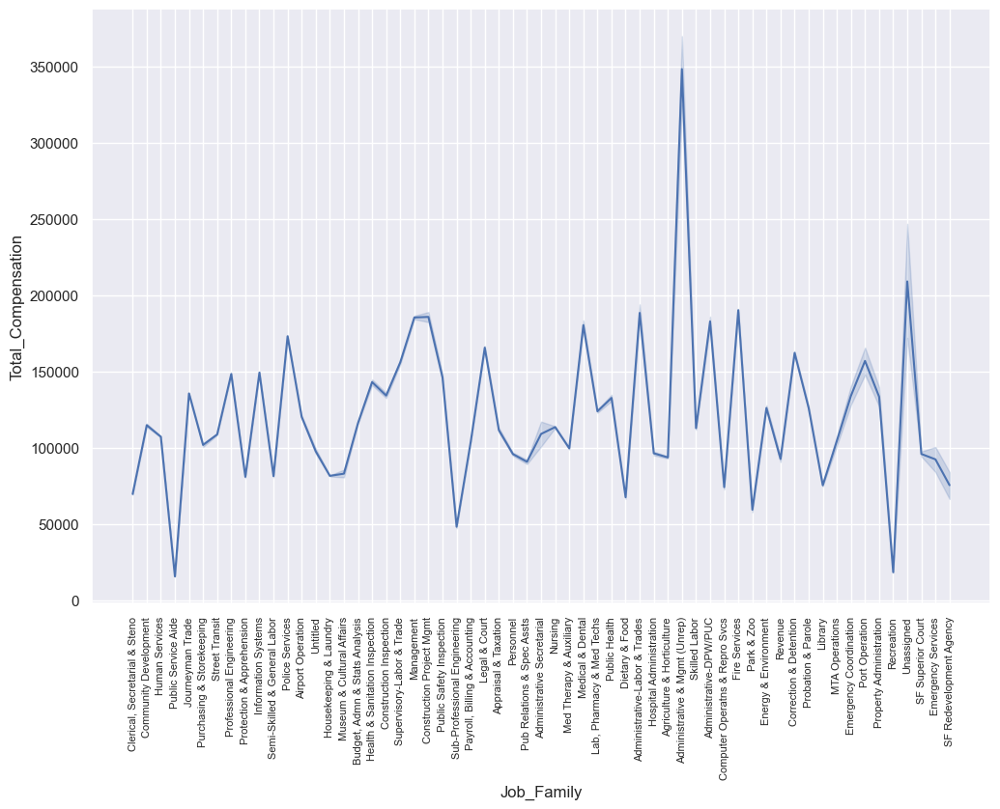

In [110]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set(style="darkgrid")

sns.lineplot(y=df.Total_Compensation,x=df.Job_Family)
plt.xticks(rotation=90,fontsize=8);

In [111]:
cat.columns

Index(['Job_Family_Code', 'Job_Code', 'Year_Type', 'Organization_Group',
       'Department_Code', 'Department', 'Union', 'Job_Family', 'Job'],
      dtype='object')

# 1. Identify the top-paying departments in terms of average total compensation and determine the factors contributing to their higher compensation levels.

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\109144506.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


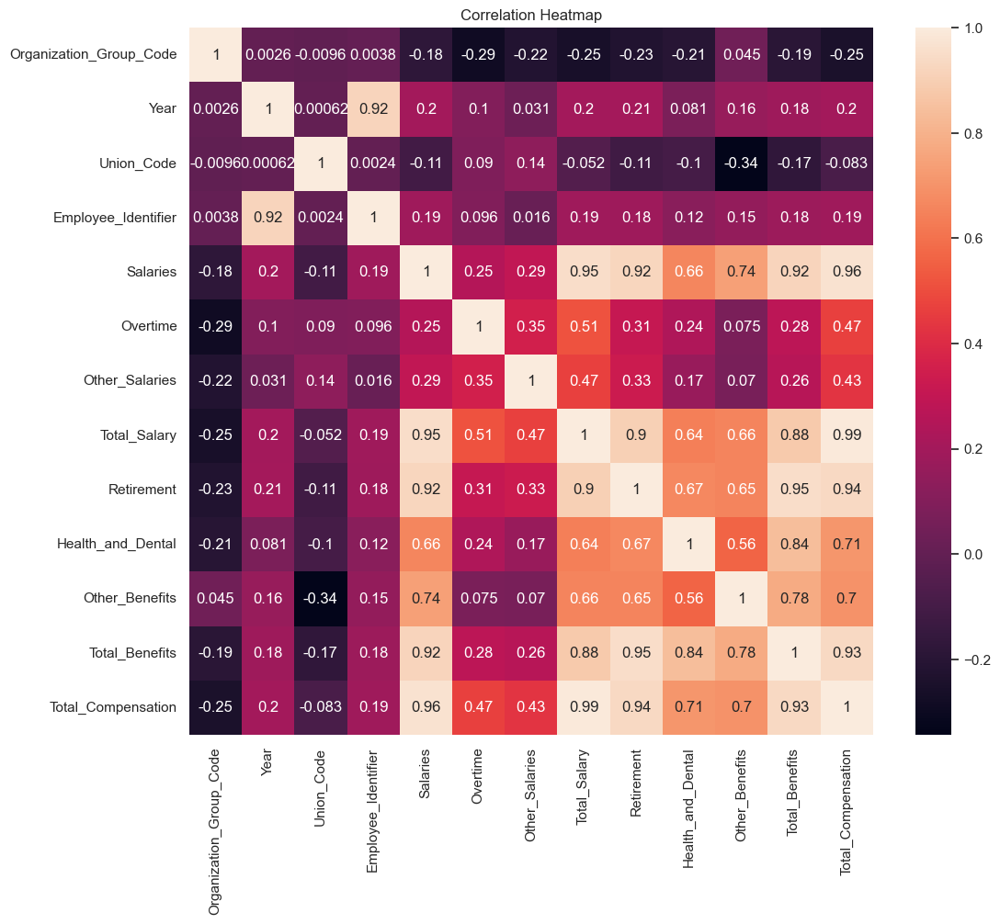

In [112]:
import seaborn as sns

fig, ax = plt.subplots(figsize=(12, 10))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Heatmap')
plt.show()


In [113]:
import pandas as pd

avg_compensation = df.groupby('Department')['Total_Compensation'].mean()

sorted_departments = avg_compensation.sort_values(ascending=False)

top_departments = sorted_departments.head(5) 
print("Top-Paying Departments:")
print(top_departments)

#factors = ['Salaries', 'Overtime', 'Retirement', 'Health_and_Dental', 'Other_Benefits','Total_Benefits','Total_Salary']

factors = ['Salaries', 'Overtime','Total_Benefits','Total_Salary']
top_department_data = df[df['Department'].isin(top_departments.index)]
factors_data = top_department_data.groupby('Department')[factors].mean()

print("\nFactors Contributing to Higher Compensation Levels:")
print(factors_data)

Top-Paying Departments:
Department
Law Library        231382.226250
City Attorney      200441.089364
Fire Department    192930.467066
LLB Law Library    187457.892778
Sheriff            185523.080058
Name: Total_Compensation, dtype: float64

Factors Contributing to Higher Compensation Levels:
                      Salaries      Overtime  Total_Benefits   Total_Salary
Department                                                                 
City Attorney    146457.711530    732.800342    51166.686194  149274.403170
Fire Department  110651.788416  26032.306850    40252.692982  152677.774084
LLB Law Library  125025.977222      0.000000    59912.195556  127545.697222
Law Library      166046.443333      0.000000    65148.582917  166233.643333
Sheriff           96116.838883  29340.996861    50484.548300  135038.531759


<Axes: xlabel='Total_Compensation', ylabel='Total_Benefits'>

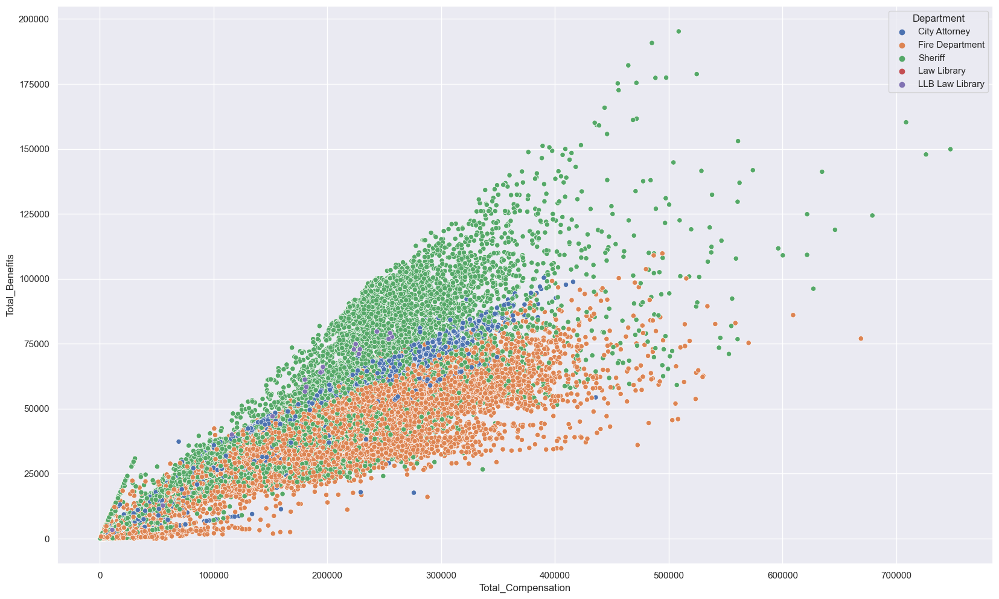

In [114]:
fig=plt.subplots(figsize=(20,12))
sns.scatterplot(x=top_department_data['Total_Compensation'],y=top_department_data['Total_Benefits'],hue=top_department_data.Department)

In [176]:
print((top_departments.index))

Index(['Law Library', 'City Attorney', 'Fire Department', 'LLB Law Library',
       'Sheriff'],
      dtype='object', name='Department')


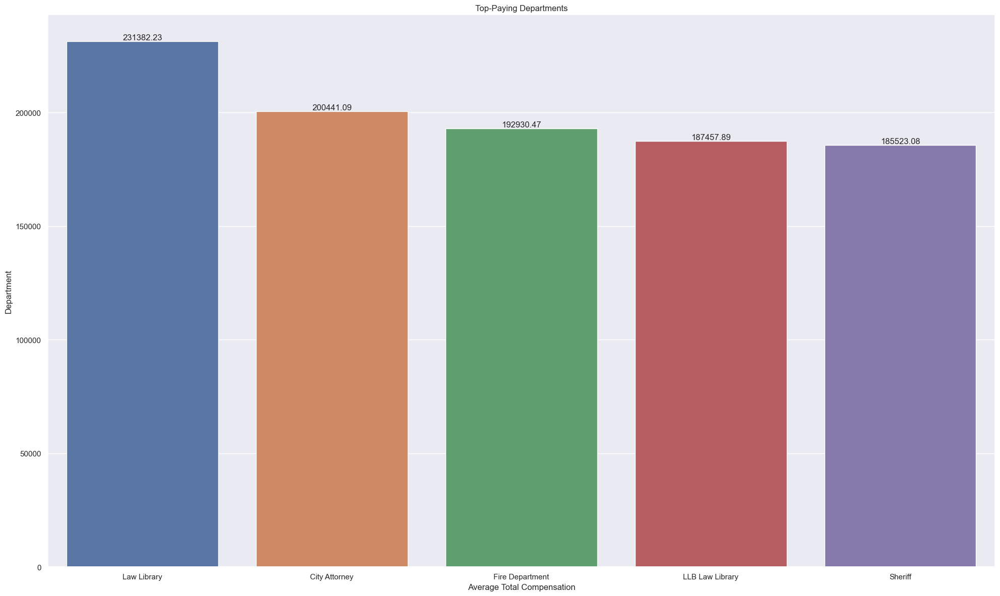

In [187]:
fig=plt.subplots(figsize=(20,12))
ax = sns.barplot(x=top_departments.index ,y=top_departments)
plt.xlabel('Average Total Compensation')
plt.ylabel('Department')
plt.title('Top-Paying Departments')
plt.xticks(rotation=0)
plt.tight_layout()
for bar in ax.patches:
    percentage =f'{round(bar.get_height(),2)}'
    x=bar.get_x()+bar.get_width()/2
    y=bar.get_height()
    ax.annotate(percentage,(x,y),va='bottom', ha='center')
plt.show()

In [182]:
sorted_departments1 = sorted_departments.iloc[0:20]
sorted_departments2 = sorted_departments.iloc[21:40]
sorted_departments3 = sorted_departments.iloc[41:60]
sorted_departments4 = sorted_departments.iloc[61:80]
sorted_departments5 = sorted_departments.iloc[81:100]
sorted_departments6 = sorted_departments.iloc[101:110]

In [183]:
def sort_dept(dept):
    plt.figure(figsize=(12, 6))
    #ax = dept.plot(kind='barh')
    #sns.countplot(dept)
    ax = sns.barplot(x=dept.values, y=dept.index, orient='h')
    plt.xlabel('Average Total Compensation')
    plt.ylabel('Department')
    plt.title('Top-Paying Departments')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

In [194]:
def sort_dept1(dept):
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x=dept.values, y=dept.index, orient='h')
    
    # Add count values to each bar
    for index, value in enumerate(dept.values):
        ax.text(round(value,2), index, f"{round(value,2)}", ha='left', va='center', fontsize=12)
    
    plt.xlabel('Average Total Compensation')
    plt.ylabel('Department')
    plt.title('Top-Paying Departments')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

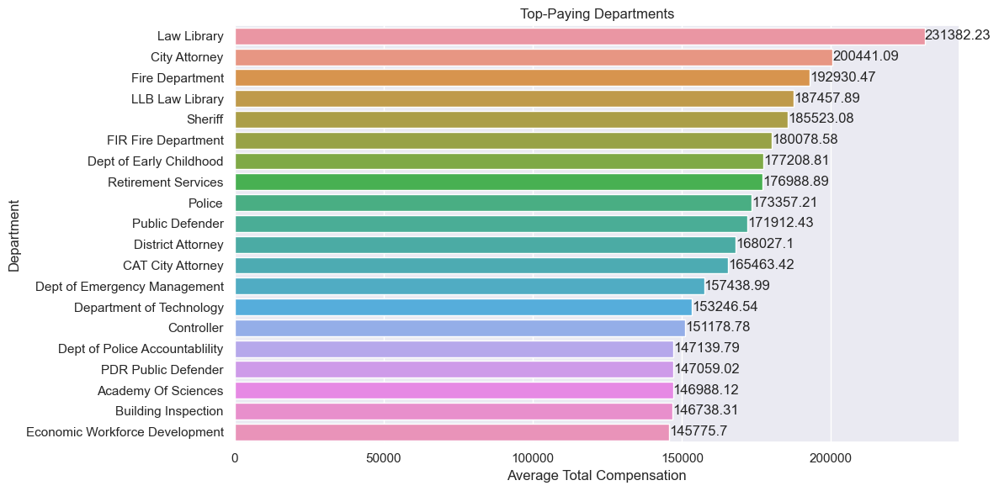

In [196]:
sort_dept1(sorted_departments1)

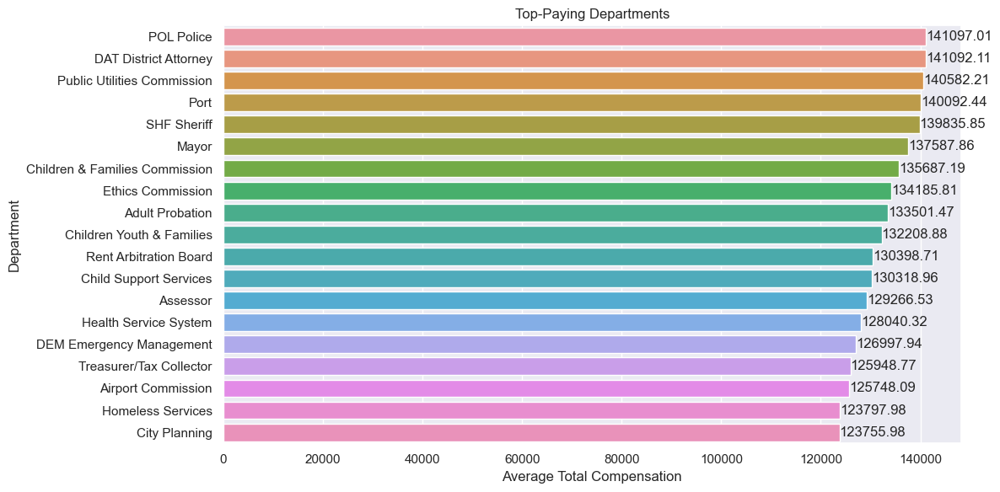

In [197]:
sort_dept1(sorted_departments2)

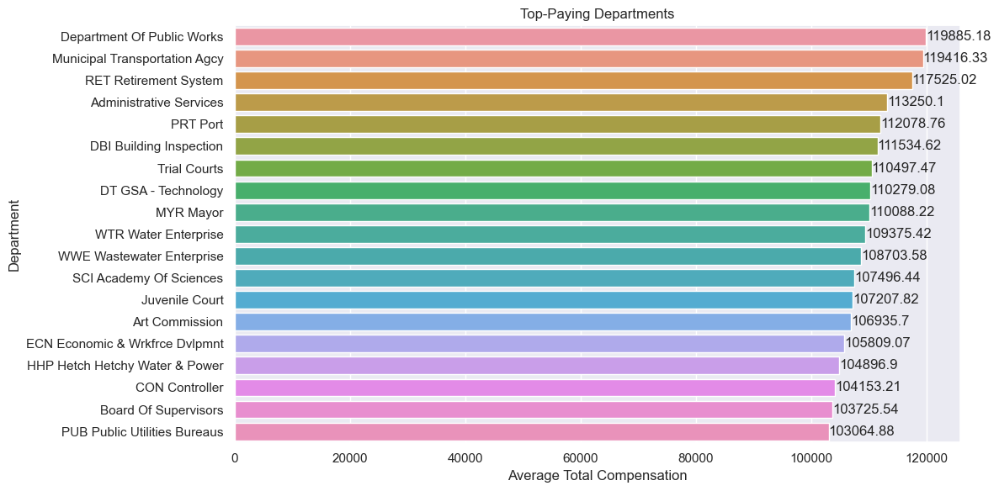

In [198]:
sort_dept1(sorted_departments3)

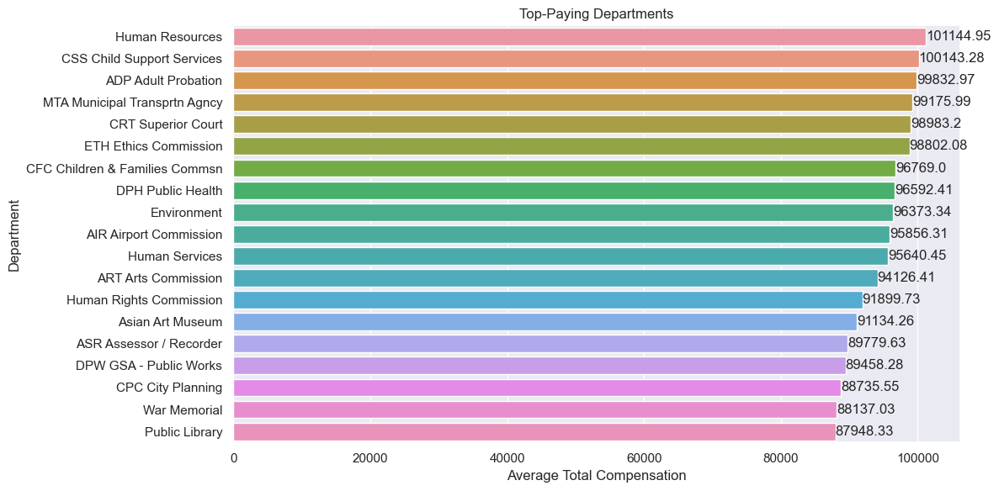

In [199]:
sort_dept1(sorted_departments4)

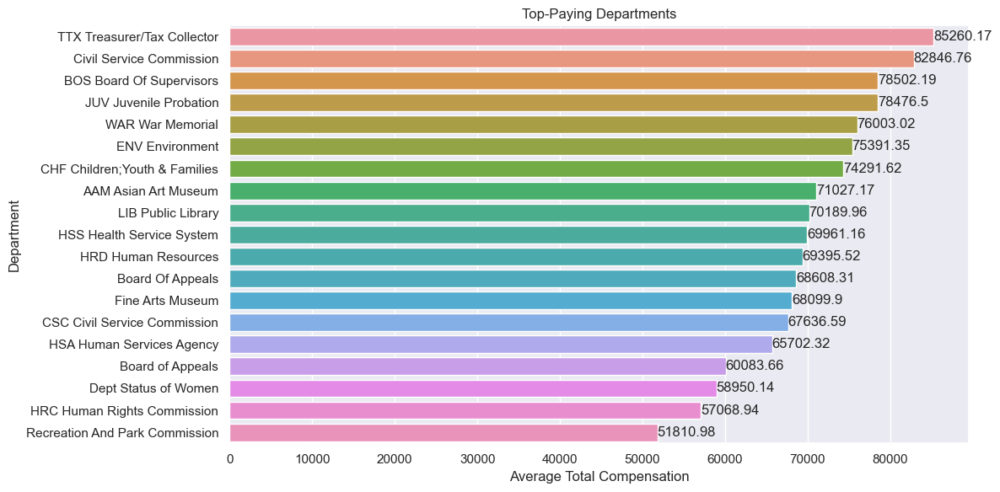

In [200]:
sort_dept1(sorted_departments5)

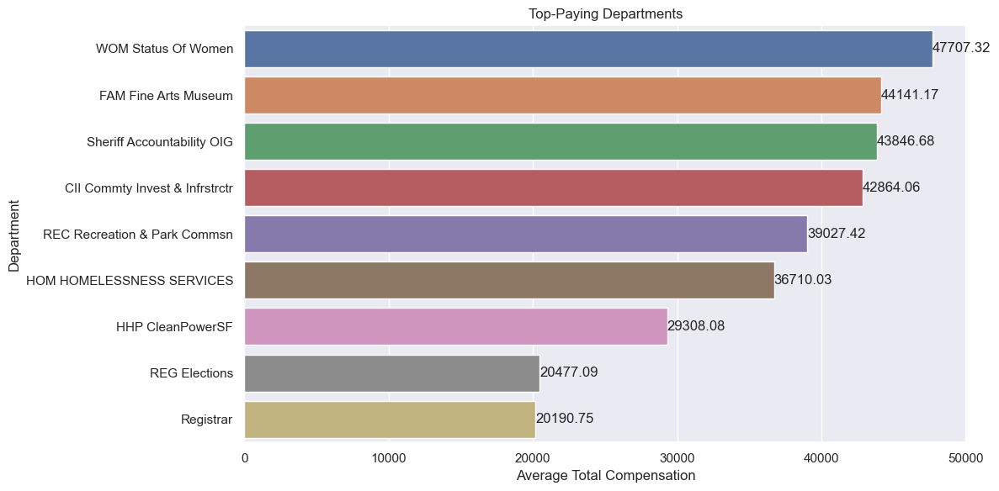

In [201]:
sort_dept1(sorted_departments6)

# 2  Investigate the trends in employee compensation over the years, comparing fiscal and calendar years, and identify any significant changes or patterns.

<Figure size 2000x600 with 0 Axes>

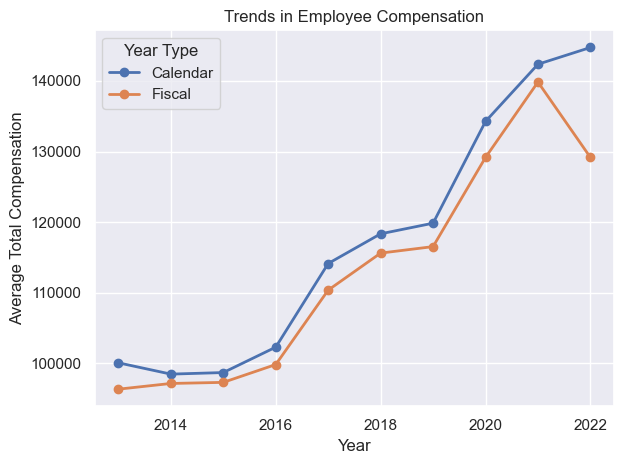

In [202]:
avg_compensation = df.groupby(['Year', 'Year_Type'])['Total_Compensation'].mean().unstack()

plt.figure(figsize=(20, 6))
avg_compensation.plot(marker='o', linestyle='-', linewidth=2)
plt.xlabel('Year')
plt.ylabel('Average Total Compensation')
plt.title('Trends in Employee Compensation')
plt.legend(title='Year Type')
plt.tight_layout()
plt.show()

# 3  Analyze the distribution of salaries and benefits to understand the overall compensation structure in San Francisco. Identify any outliers or anomalies in the data.

In [430]:

# columns_of_interest =  ['Salaries', 'Overtime', 'Retirement', 'Health_and_Dental', 'Other_Benefits','Total_Salary']

# summary_stats = df[columns_of_interest].describe()

# plt.figure(figsize=(16, 6))
# df[columns_of_interest].hist(bins=20, edgecolor='k', alpha=0.7,figsize=(12, 6))
# #plt.xlabel('Compensation')
# plt.ylabel('Frequency')
# #plt.title('Distribution of Salaries and Benefits')
# plt.tight_layout()
# plt.show()

In [431]:
def outl(col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    #print("Q1 :",q1,"Q3 :",q3)
    iqr = q3-q1
    #print('Inter Quartile Range ', iqr)
    UF = q3+1.5*iqr
    LF = q1-1.5*iqr
    #print("UPPER_FRAME :",UF,"LOWER_FRAME :",LF)
    DC2 = df[(df[col]>LF)&(df[col]<UF)]
    return DC2

Text(0.5, 1.0, 'Total_Salary Without Outlier')

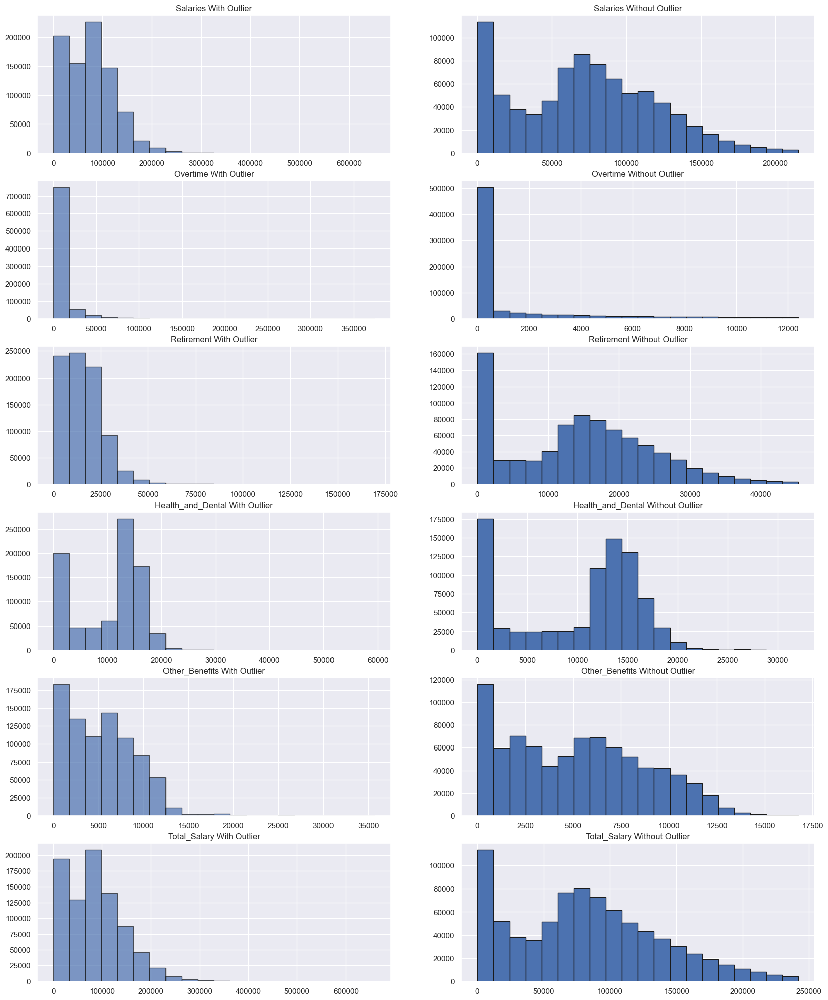

In [480]:
fig,ax = plt.subplots(6,2,figsize=(20, 25))
ax[0,0] = df.Salaries.hist(bins=20, edgecolor='k', alpha=0.7,ax = ax[0,0])
ax[0,1] = outl('Salaries').Salaries.hist(bins=20, edgecolor='k',ax = ax[0,1])
ax[1,0] = df.Overtime.hist(bins=20, edgecolor='k', alpha=0.7,ax = ax[1,0])
ax[1,1] = outl('Overtime').Overtime.hist(bins=20, edgecolor='k',ax = ax[1,1])
ax[2,0] = df.Retirement.hist(bins=20, edgecolor='k', alpha=0.7,ax = ax[2,0])
ax[2,1] = outl('Retirement').Retirement.hist(bins=20, edgecolor='k',ax = ax[2,1])
ax[3,0] = df.Health_and_Dental.hist(bins=20, edgecolor='k', alpha=0.7,ax = ax[3,0])
ax[3,1] = outl('Health_and_Dental').Health_and_Dental.hist(bins=20, edgecolor='k',ax = ax[3,1])
ax[4,0] = df.Other_Benefits.hist(bins=20, edgecolor='k', alpha=0.7,ax = ax[4,0])
ax[4,1] = outl('Other_Benefits').Other_Benefits.hist(bins=20, edgecolor='k',ax = ax[4,1])
ax[5,0] = df.Total_Salary.hist(bins=20, edgecolor='k', alpha=0.7,ax = ax[5,0])
ax[5,1] = outl('Total_Salary').Total_Salary.hist(bins=20, edgecolor='k',ax = ax[5,1])

ax[0, 0].set_title('Salaries With Outlier')
ax[1, 0].set_title('Overtime With Outlier')
ax[2, 0].set_title('Retirement With Outlier')
ax[3, 0].set_title('Health_and_Dental With Outlier')
ax[4, 0].set_title('Other_Benefits With Outlier')
ax[5, 0].set_title('Total_Salary With Outlier')

ax[0, 1].set_title('Salaries Without Outlier')
ax[1, 1].set_title('Overtime Without Outlier')
ax[2, 1].set_title('Retirement Without Outlier')
ax[3, 1].set_title('Health_and_Dental Without Outlier')
ax[4, 1].set_title('Other_Benefits Without Outlier')
ax[5, 1].set_title('Total_Salary Without Outlier')

#  4 Examine the relationship between salaries, overtime, and other forms of compensation to determine if certain job families or departments have higher instances of overtime or irregular payments.

In [420]:
grouped_data = df.groupby('Job_Family')['Salaries', 'Overtime', 'Other_Salaries'].mean().round(2)
#print(grouped_data.shape)

grouped_data['Overtime_Ratio'] = round((grouped_data['Overtime'] / grouped_data['Salaries']),2)

grouped_data['Other_Salary_Ratio'] = round((grouped_data['Other_Salaries'] / grouped_data['Salaries']),2)

sorted_data1 = grouped_data.sort_values(by='Overtime_Ratio', ascending=False)

#print(sorted_data1['Overtime_Ratio'],end="   |   ")




C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3963879834.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  grouped_data = df.groupby('Job_Family')['Salaries', 'Overtime', 'Other_Salaries'].mean().round(2)


In [421]:
grouped_data.shape

(59, 5)

In [422]:
sorted_data2 = grouped_data.sort_values(by='Other_Salary_Ratio', ascending=False)

#print(sorted_data2['Other_Salary_Ratio'])

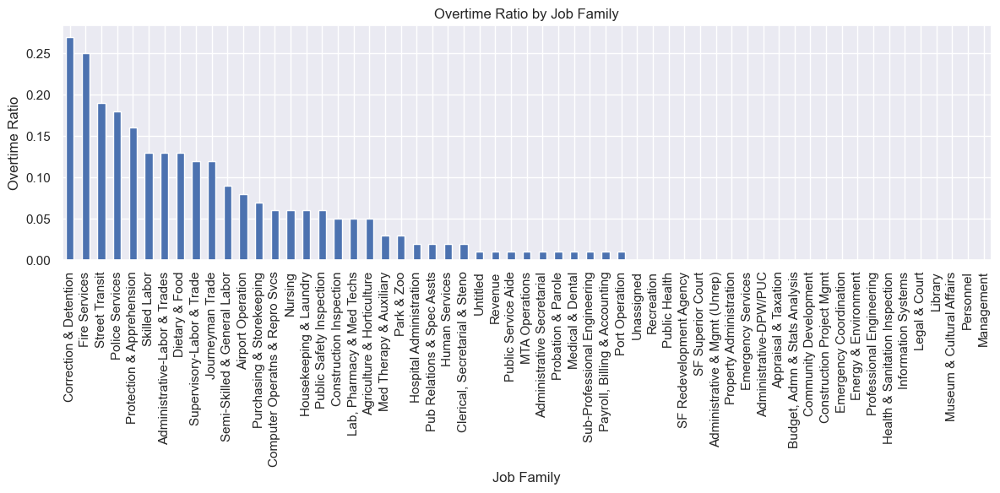

In [423]:

plt.figure(figsize=(12, 6))
sorted_data1['Overtime_Ratio'].plot(kind='bar')
plt.xlabel('Job Family')
plt.ylabel('Overtime Ratio')
plt.title('Overtime Ratio by Job Family')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

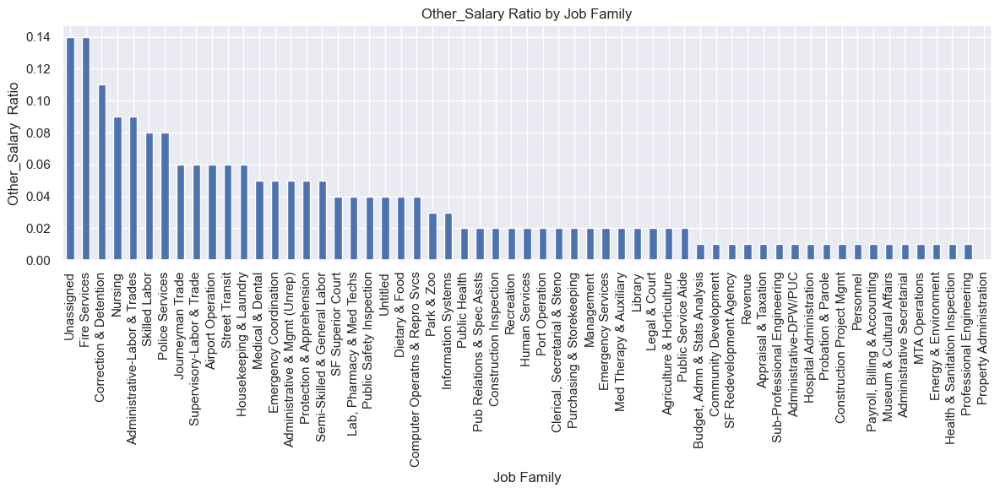

In [137]:

plt.figure(figsize=(12, 6))
sorted_data2['Other_Salary_Ratio'].plot(kind='bar')
plt.xlabel('Job Family')
plt.ylabel('Other_Salary  Ratio')
plt.title('Other_Salary Ratio by Job Family')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# 5 Explore the distribution of benefits across different organization groups and unions to understand the variations in benefit packages provided to employees.

In [433]:
grouped_data1 = df.groupby(['Organization_Group', 'Union'])['Retirement', 'Health_and_Dental', 'Other_Benefits'].mean()


grouped_data1['Benefit_Range'] = grouped_data1.max(axis=1) - grouped_data1.min(axis=1)

grouped_data1['Benefit_Range'] = grouped_data1['Benefit_Range'].sort_values()
#print(grouped_data1)
#for x in grouped_data1:
#    print(type(x))

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\3986767809.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  grouped_data1 = df.groupby(['Organization_Group', 'Union'])['Retirement', 'Health_and_Dental', 'Other_Benefits'].mean()


In [465]:
grouped_data1 = grouped_data1.sort_values(by="Benefit_Range",ascending=False)

In [466]:
grouped_data2 = grouped_data1.iloc[0:33]
grouped_data3 = grouped_data1.iloc[34:66]
grouped_data4 = grouped_data1.iloc[67:99]
grouped_data5 = grouped_data1.iloc[100:133]
grouped_data6 = grouped_data1.iloc[134:166]
grouped_data7 = grouped_data1.iloc[167:199]
grouped_data8 = grouped_data1.iloc[200:233]
grouped_data9 = grouped_data1.iloc[234:266]
grouped_data10 = grouped_data1.iloc[267:299]
grouped_data11 = grouped_data1.iloc[300:329]

In [467]:
def barcount(ax):
    for bar in ax.patches:
        percentage =f'{round(bar.get_height(),2)}'
        x=bar.get_y()+bar.get_width()/2
        y=bar.get_height()
        ax.annotate(percentage,(x,y),va='bottom', ha='center',rotation=90)

In [468]:
def barcount_w(ax):
    for bar in ax.patches:
        percentage = f'{int(bar.get_width())}'
        x = bar.get_width() + 0.5  # Adjust the x-coordinate
        y = bar.get_y() + bar.get_height() / 2
        ax.text(x, y, percentage, ha='left', va='center')

In [469]:
def union_and_org(grp):
    plt.figure(figsize=(12, 6))
    ax = grp['Benefit_Range'].plot(kind='barh')
    plt.xlabel('Benefit Range')
    plt.ylabel('Organization Group - Union')
    plt.title('Variations in Benefit Packages')
    plt.xticks(rotation=90)
    plt.tight_layout()
    barcount_w(ax)
    plt.show()

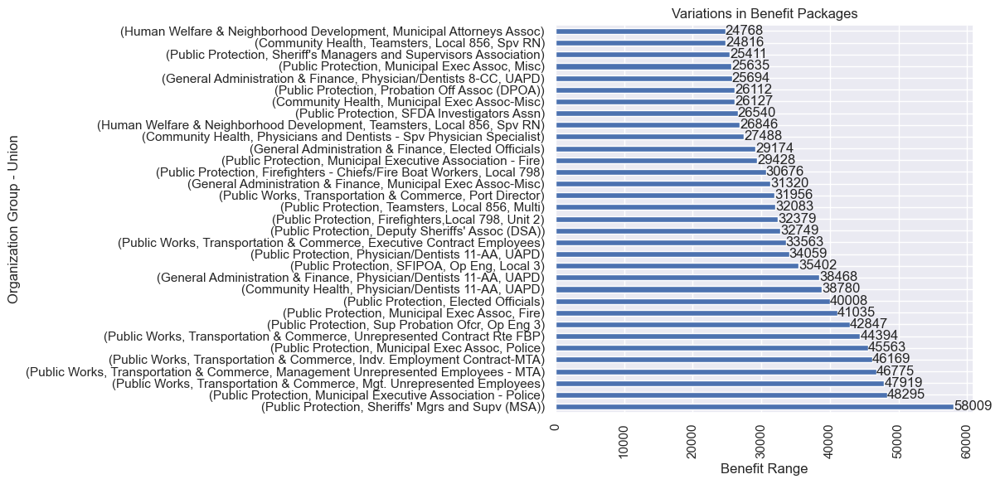

In [470]:
union_and_org(grouped_data2)

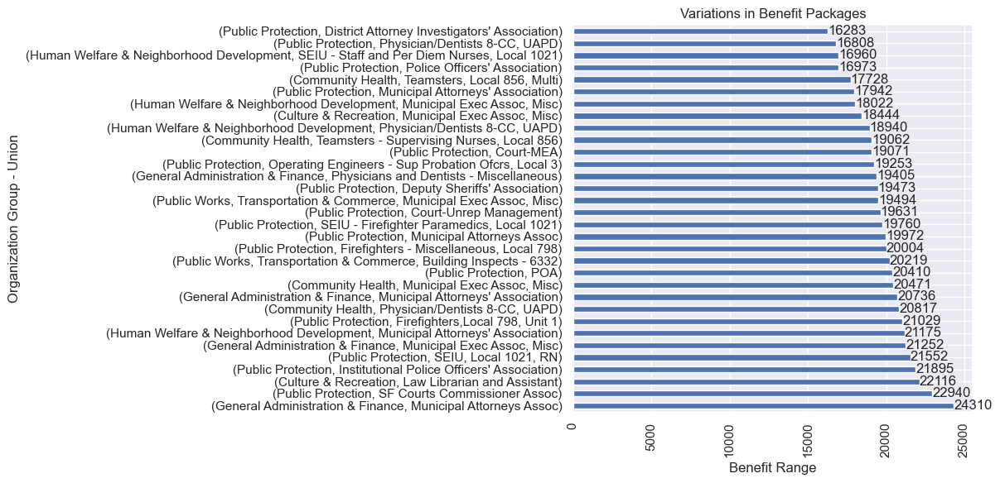

In [471]:
union_and_org(grouped_data3)

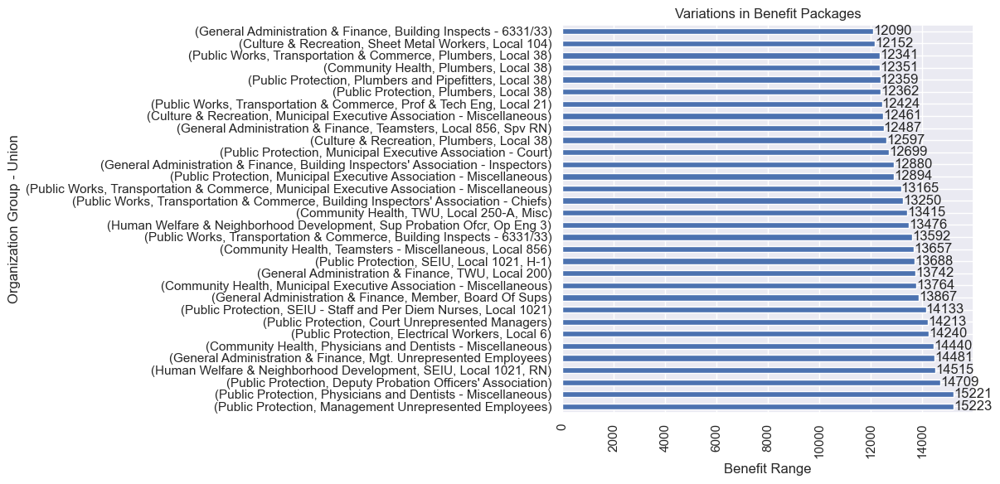

In [472]:
union_and_org(grouped_data4)

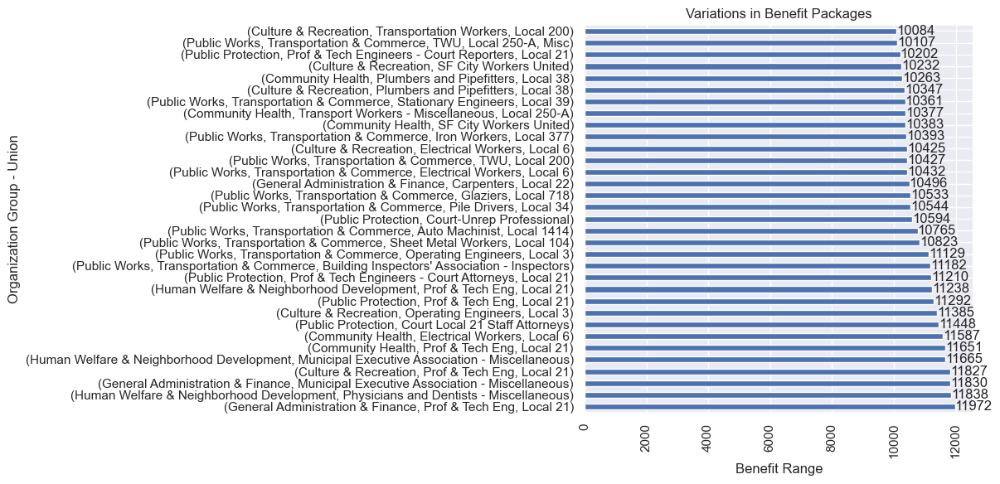

In [473]:
union_and_org(grouped_data5)

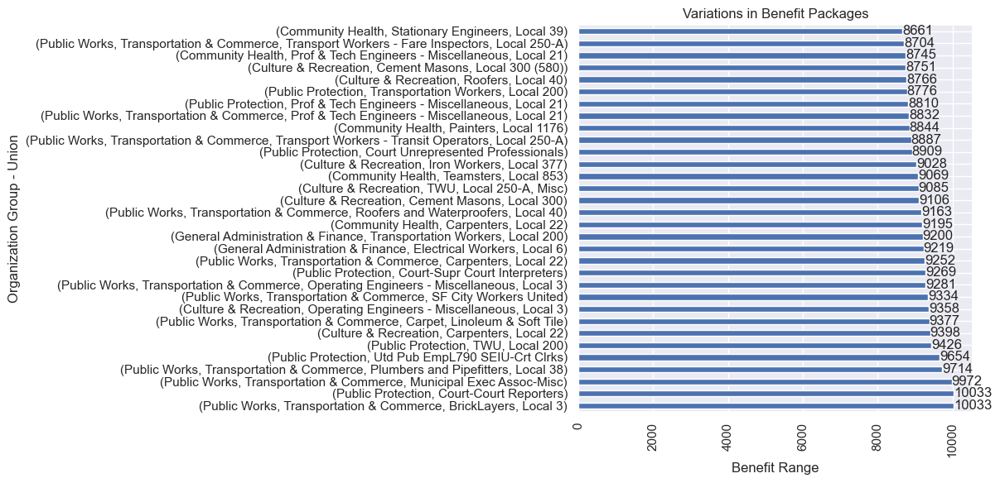

In [474]:
union_and_org(grouped_data6)

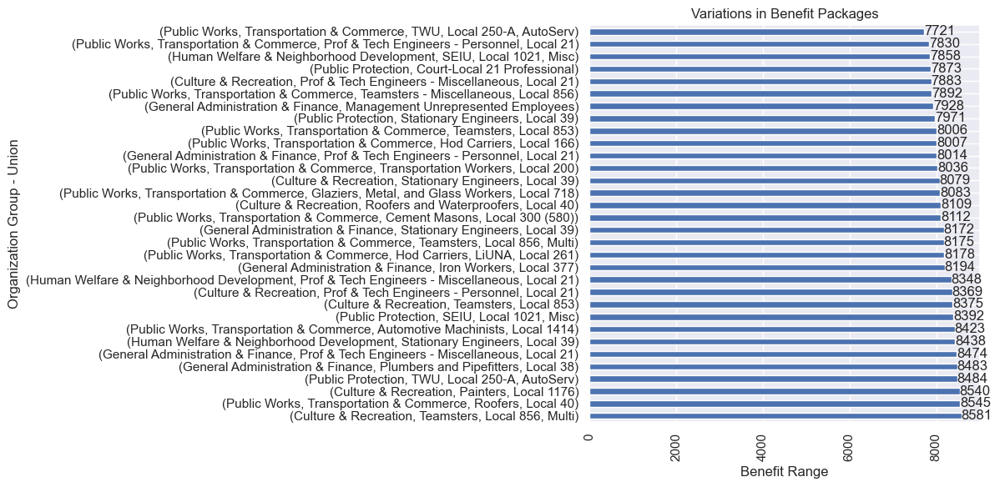

In [475]:
union_and_org(grouped_data7)

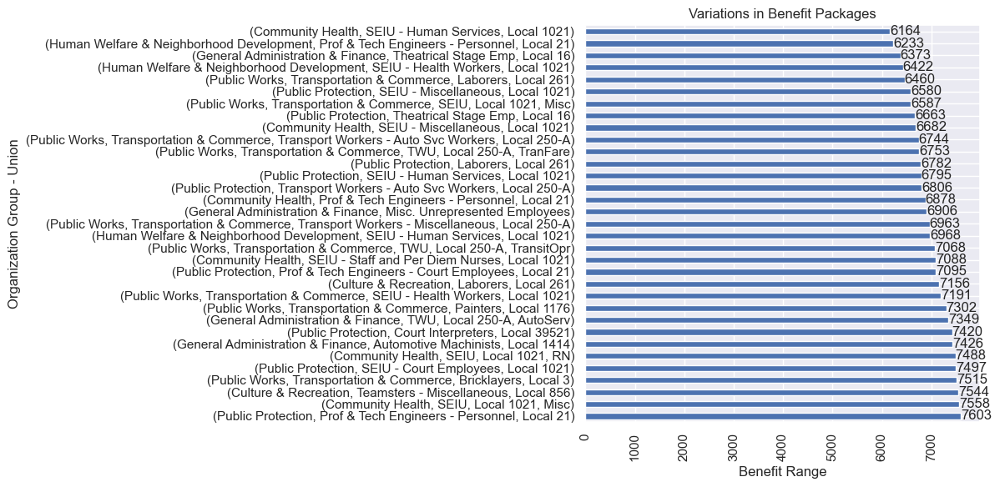

In [476]:
union_and_org(grouped_data8)

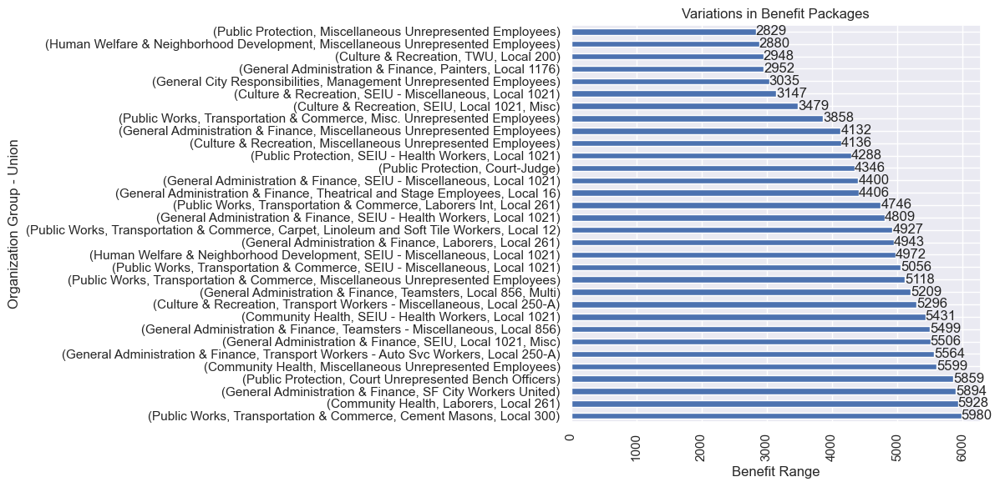

In [477]:
union_and_org(grouped_data9)

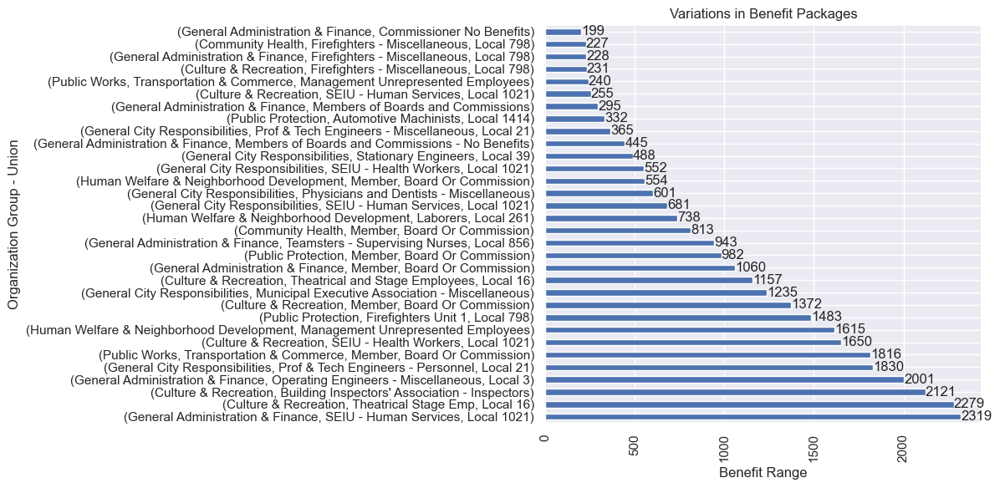

In [478]:
union_and_org(grouped_data10)

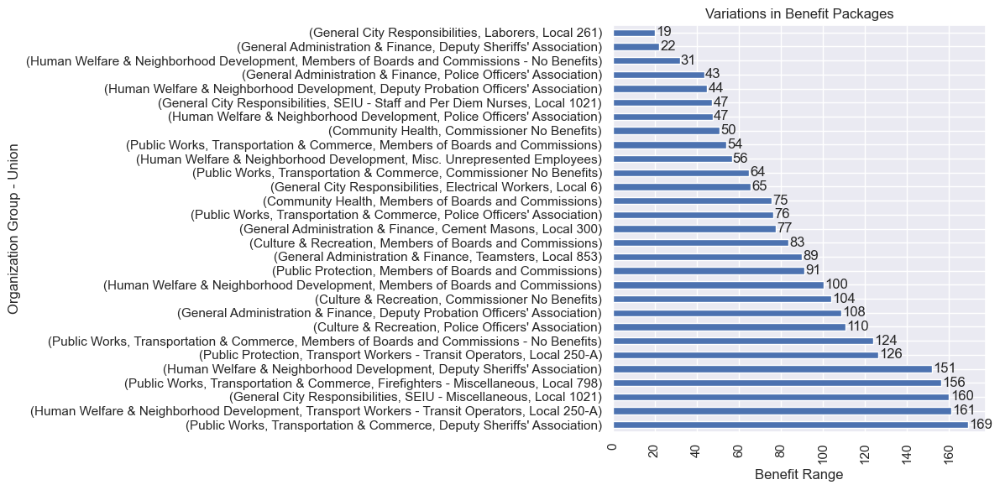

In [479]:
union_and_org(grouped_data11)

# 6 Investigate the impact of job family on compensation levels and identify the job families with the highest and lowest average total compensation.

In [207]:
avg_compensation = df.groupby('Job_Family')['Total_Compensation'].mean()

highest_compensation_job_family = avg_compensation.idxmax()
lowest_compensation_job_family = avg_compensation.idxmin()

highest_compensation = avg_compensation.max()
lowest_compensation = avg_compensation.min()

print("Job Family with Highest Average Total Compensation:")
print(highest_compensation_job_family, highest_compensation)

print("\nJob Family with Lowest Average Total Compensation:")
print(lowest_compensation_job_family, lowest_compensation)

Job Family with Highest Average Total Compensation:
Administrative & Mgmt (Unrep) 348412.00963414635

Job Family with Lowest Average Total Compensation:
Public Service Aide 15694.772339055795


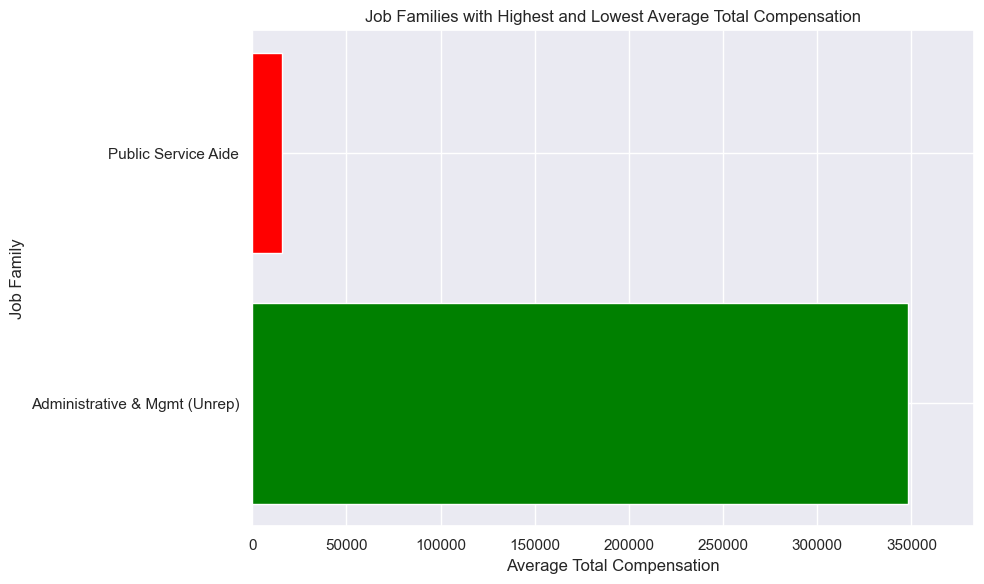

In [211]:
data = pd.DataFrame({'Job_Family': [highest_compensation_job_family, lowest_compensation_job_family],
                     'Average_Total_Compensation': [highest_compensation, lowest_compensation]})

plt.figure(figsize=(10, 6))
ax = plt.barh(data['Job_Family'], data['Average_Total_Compensation'], color=['green', 'red'])
plt.xlabel('Average Total Compensation')
plt.ylabel('Job Family')
plt.title('Job Families with Highest and Lowest Average Total Compensation')
plt.xlim(0, max(data['Average_Total_Compensation']) * 1.1)
plt.tight_layout()
plt.show()

# 7 Analyze the proportion of benefits in total compensation and assess how it varies across different departments and job families.

In [237]:
df['Proportion_Benefits'] = (df['Retirement'] + df['Health_and_Dental'] + df['Other_Benefits']) / df['Total_Compensation']

department_proportion = df.groupby('Department')['Proportion_Benefits'].mean().sort_values()

job_family_proportion = df.groupby('Job_Family')['Proportion_Benefits'].mean().sort_values()

print("Average Proportion of Benefits by Department:")
print(department_proportion.shape)

print("\nAverage Proportion of Benefits by Job Family:")
print(job_family_proportion.shape)


Average Proportion of Benefits by Department:
(111,)

Average Proportion of Benefits by Job Family:
(59,)


In [238]:
department_proportion1 = department_proportion.iloc[0:22]
department_proportion2 = department_proportion.iloc[23:44]
department_proportion3 = department_proportion.iloc[45:66]
department_proportion4 = department_proportion.iloc[67:88]
department_proportion5 = department_proportion.iloc[89:111]


In [239]:
# Plotting the average proportion of benefits by department
def department_proportion(dept):
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x=dept.values, y=dept.index, orient='h')
    for index, value in enumerate(dept.values):
        ax.text(round(value,2), index, f"{round(value,2)}", ha='left', va='center', fontsize=12)
    plt.xlabel('Average Proportion of Benefits')
    plt.ylabel('Department')
    plt.title('Average Proportion of Benefits by Department')
    plt.tight_layout()
    plt.show()

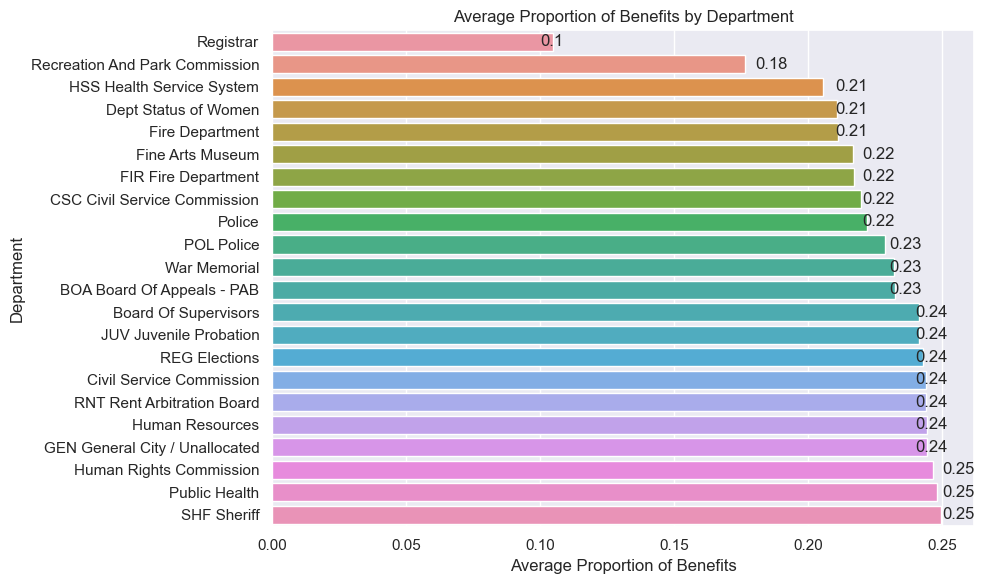

In [240]:
department_proportion(department_proportion1)

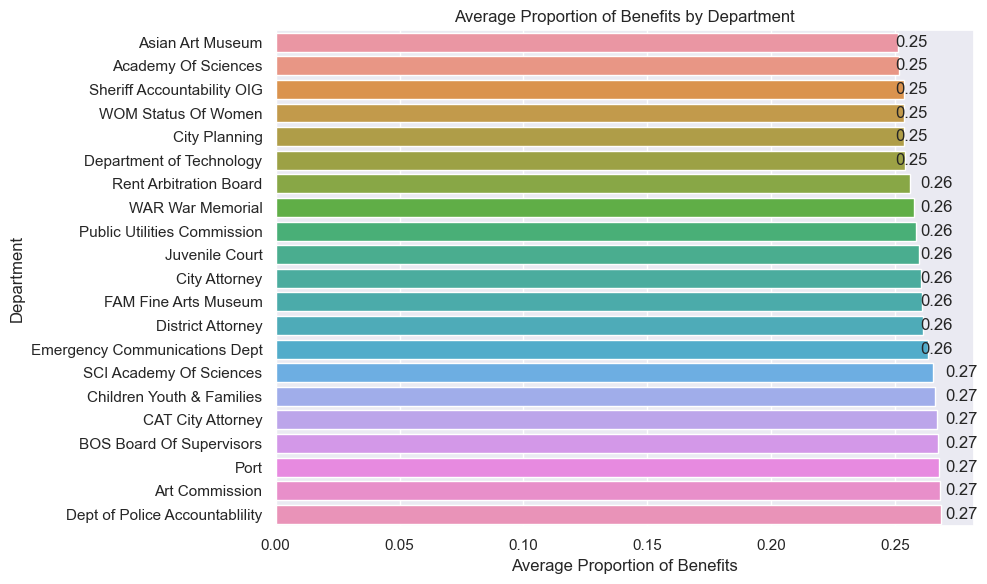

In [241]:
department_proportion(department_proportion2)

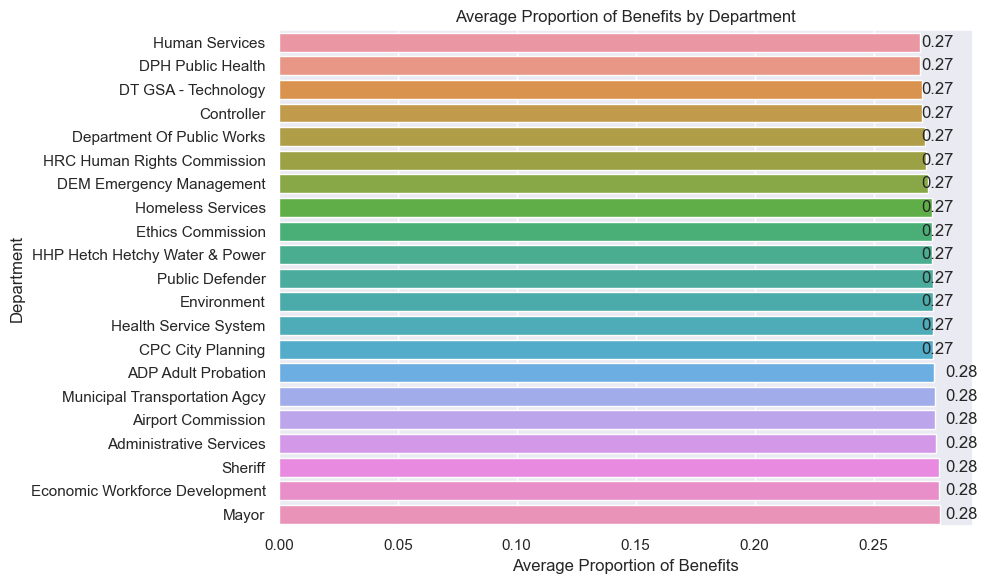

In [242]:
department_proportion(department_proportion3)

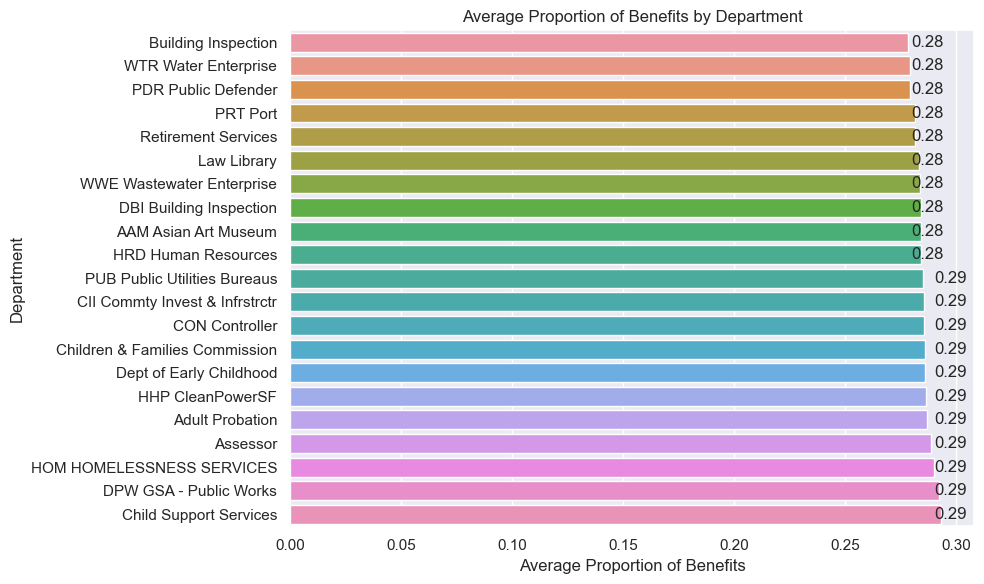

In [243]:
department_proportion(department_proportion4)

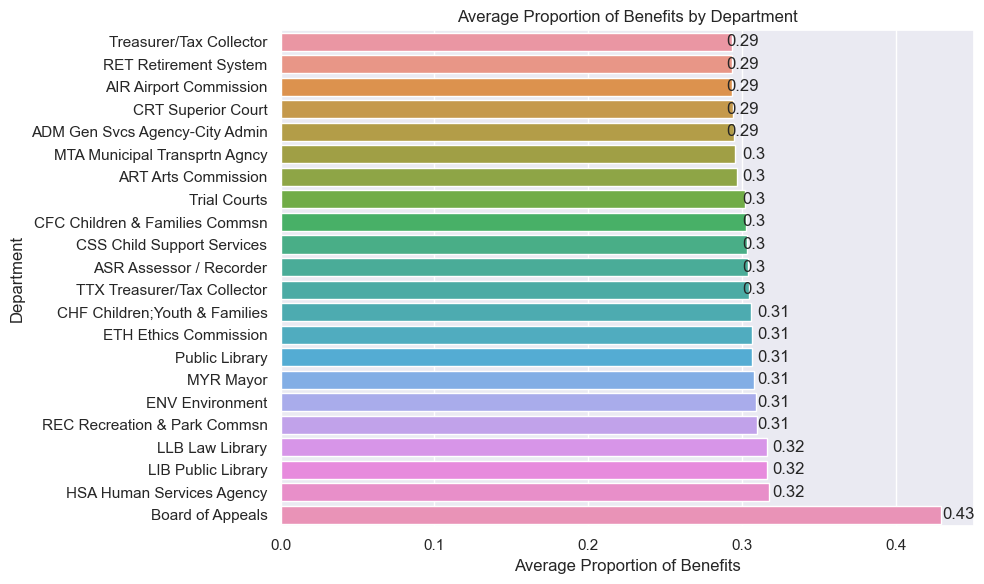

In [244]:
department_proportion(department_proportion5)

In [245]:
job_family_proportion1 = job_family_proportion.iloc[0:20]
job_family_proportion2 = job_family_proportion.iloc[21:40]
job_family_proportion3 = job_family_proportion.iloc[41:59]

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=prop.values, y=prop.index, orient='h')
for index, value in enumerate(prop.values):
    ax.text(round(value,2), index, f"{round(value,2)}", ha='left', va='center', fontsize=12)
plt.xlabel('Average Proportion of Benefits')
plt.ylabel('Job Family')
plt.title('Average Proportion of Benefits by Job Family')
plt.tight_layout()
plt.show()

In [246]:
def job_family_prop(prop):
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x=prop.values, y=prop.index, orient='h')
    for index, value in enumerate(prop.values):
        ax.text(round(value,2), index, f"{round(value,2)}", ha='left', va='center', fontsize=12)
    plt.xlabel('Average Proportion of Benefits')
    plt.ylabel('Job Family')
    plt.title('Average Proportion of Benefits by Job Family')
    plt.tight_layout()
    plt.show()
    

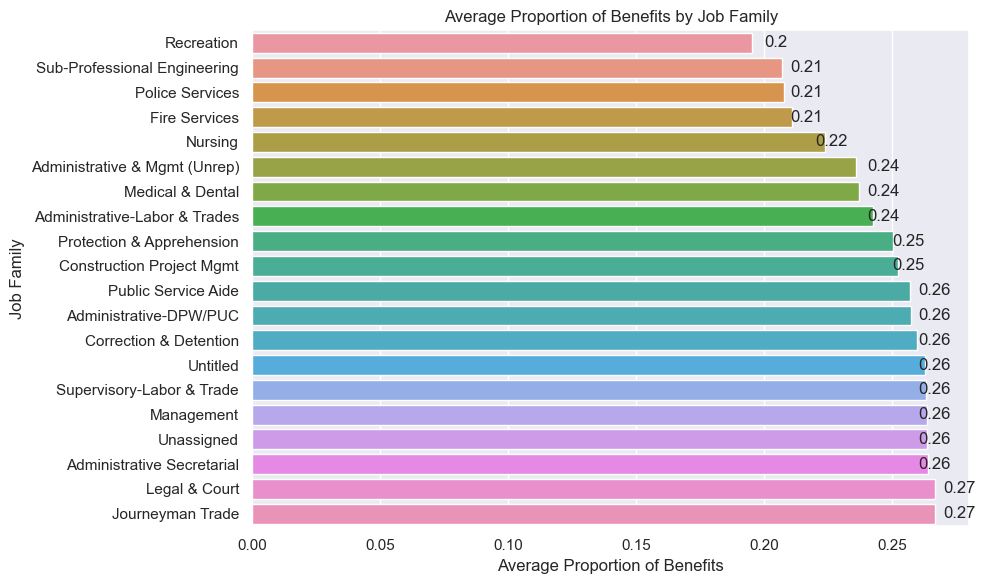

In [247]:
job_family_prop(job_family_proportion1)

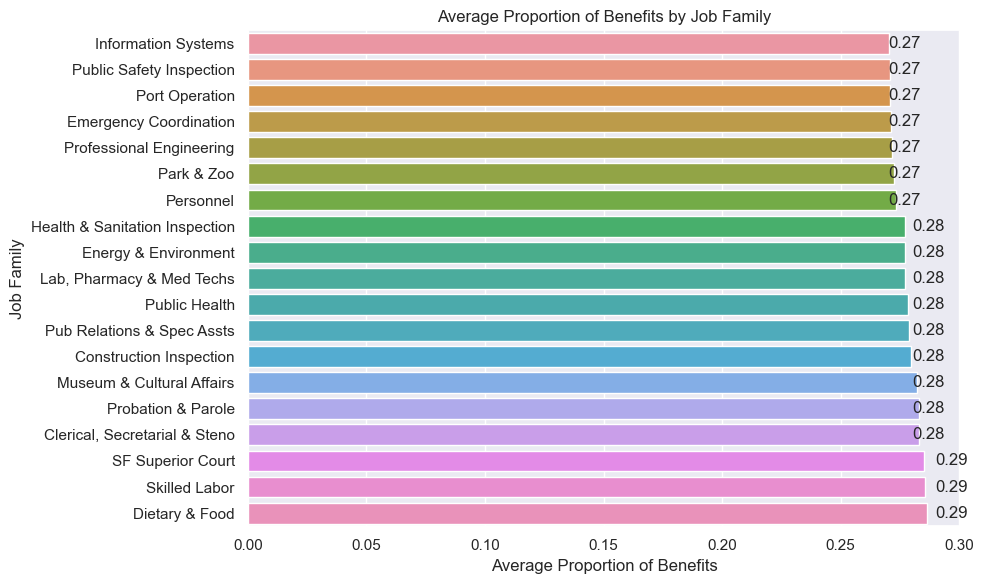

In [248]:
job_family_prop(job_family_proportion2)

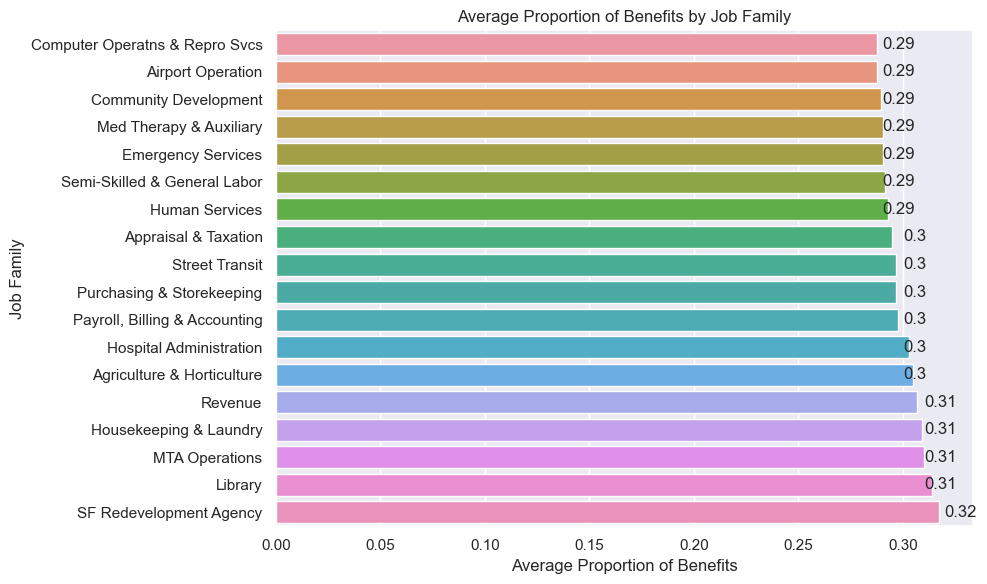

In [249]:
job_family_prop(job_family_proportion3)

# 8 Identify any correlations between employee compensation and factors such as years of service, job level, or union affiliation.

In [252]:
df.columns

Index(['Organization_Group_Code', 'Job_Family_Code', 'Job_Code', 'Year_Type',
       'Year', 'Organization_Group', 'Department_Code', 'Department',
       'Union_Code', 'Union', 'Job_Family', 'Job', 'Employee_Identifier',
       'Salaries', 'Overtime', 'Other_Salaries', 'Total_Salary', 'Retirement',
       'Health_and_Dental', 'Other_Benefits', 'Total_Benefits',
       'Total_Compensation', 'Proportion_Benefits'],
      dtype='object')

In [253]:
columns_interest = ['Total_Compensation', 'Year', 'Union']

# Subset the dataframe with selected columns
subset_df = df[columns_interest]

# Calculate correlation coefficients
correlation_matrix = subset_df.corr()

# Analyze the correlation coefficients
print(correlation_matrix)

                    Total_Compensation      Year
Total_Compensation            1.000000  0.197838
Year                          0.197838  1.000000


C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\2177137468.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = subset_df.corr()


In [287]:
df.Union_Code.value_counts()

790.0    235134
21.0     110365
791.0     65649
253.0     53437
911.0     51271
          ...  
220.0        42
357.0        26
969.0        22
302.0        21
604.0        11
Name: Union_Code, Length: 70, dtype: int64

In [288]:
df11 = df[['Union_Code','Year','Total_Compensation']]

In [289]:
df11['current_year']=2023

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\895788666.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df11['current_year']=2023


In [290]:
df11['job_level']=df11['current_year']-df11['Year']

C:\Users\Futurense\AppData\Local\Temp\ipykernel_5428\24438319.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df11['job_level']=df11['current_year']-df11['Year']


In [291]:
df11.head()

,Union_Code,Year,Total_Compensation,current_year,job_level
0,790.0,2019,94011.31,2023,4
1,535.0,2019,131346.09,2023,4
2,535.0,2019,130108.91,2023,4
3,535.0,2019,126881.73,2023,4
4,535.0,2019,127464.62,2023,4


In [292]:
df11.job_level.value_counts()

4     89008
7     88192
8     85841
5     85602
6     84266
3     83286
1     81864
9     81519
2     80020
10    79020
Name: job_level, dtype: int64

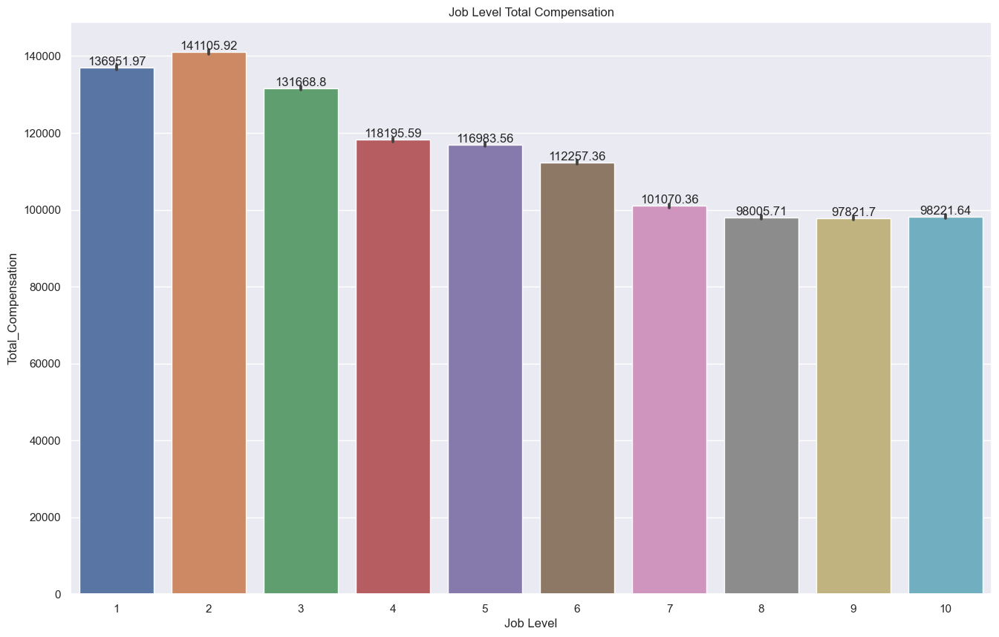

In [355]:
fig=plt.subplots(figsize=(16,10))
ax = sns.barplot(x=df11.job_level ,y=df11.Total_Compensation)
#ax = sns.lineplot(x=df11.job_level ,y=df11.Total_Compensation)
plt.xlabel('Job Level')
plt.ylabel('Total_Compensation')
plt.title('Job Level Total Compensation')
plt.xticks(rotation=0)
#plt.tight_layout()
for bar in ax.patches:
    percentage =f'{round(bar.get_height(),2)}'
    x=bar.get_x()+bar.get_width()/2
    y=bar.get_height()
    ax.annotate(percentage,(x,y),va='bottom', ha='center')
plt.show()

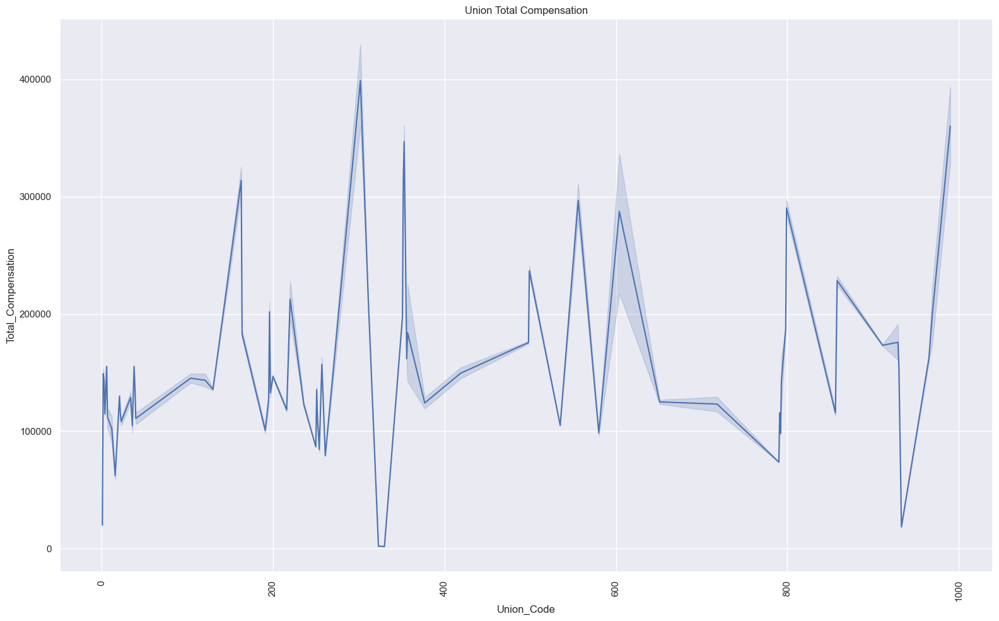

In [354]:
fig=plt.subplots(figsize=(16,10))
ax = sns.lineplot(x=df11.Union_Code ,y=df11.Total_Compensation)
plt.xlabel('Union_Code')
plt.ylabel('Total_Compensation')
plt.title('Union Total Compensation')
plt.xticks(rotation=90)
plt.tight_layout()

In [298]:
df12 = df11[['Union_Code','job_level','Total_Compensation']]

In [300]:
df12.groupby('Union_Code')['Total_Compensation'].count()

Union_Code
1.0       7877
2.0       1618
3.0       1201
4.0       2695
6.0      17299
         ...  
930.0     1427
933.0     1052
965.0      531
969.0       22
990.0       44
Name: Total_Compensation, Length: 70, dtype: int64

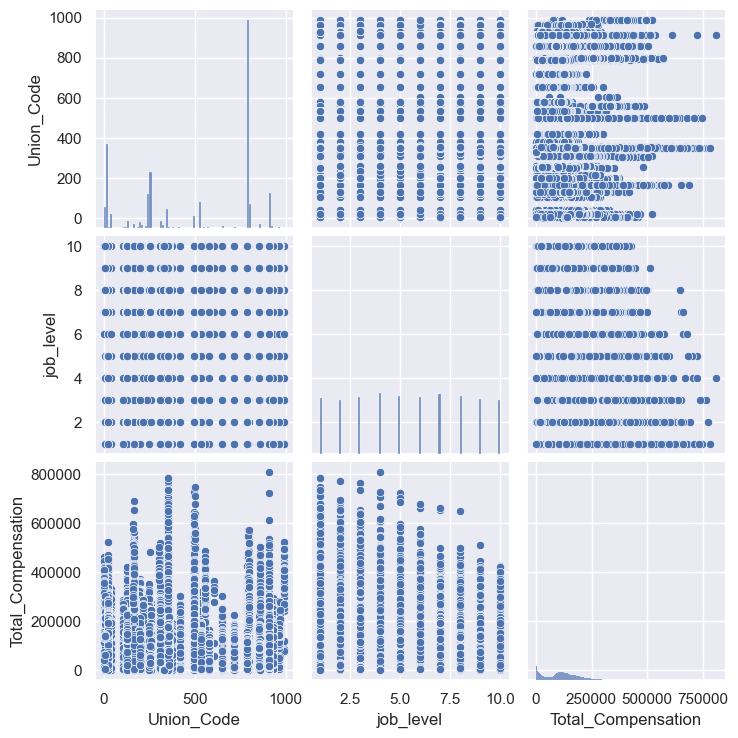

In [301]:
#fig=plt.subplots(figsize=(10,12))
sns.pairplot(df12)

In [304]:
df12.corr()

,Union_Code,job_level,Total_Compensation
Union_Code,1.000000,-0.000618,-0.083075
job_level,-0.000618,1.000000,-0.197838
Total_Compensation,-0.083075,-0.197838,1.000000


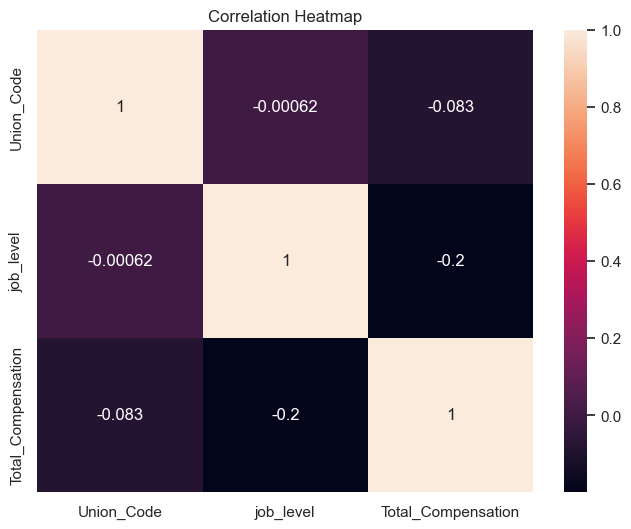

In [308]:
fig, ax = plt.subplots(figsize=(8, 6))
correlation_matrix1 = df12.corr()
sns.heatmap(correlation_matrix1, annot=True)
plt.title('Correlation Heatmap')
plt.show()

# 9 Assess the impact of retirement contributions and health/dental benefits on total compensation and explore any variations across departments or job families.

In [154]:
columns_of_interest = ['Retirement', 'Health_and_Dental', 'Total_Compensation', 'Department', 'Job_Family']

subset_df = df[columns_of_interest]

department_stats = subset_df.groupby('Department').agg({'Retirement': 'mean', 'Health_and_Dental': 'mean', 'Total_Compensation': 'mean'}).round(2)

job_family_stats = subset_df.groupby('Job_Family').agg({'Retirement': 'mean', 'Health_and_Dental': 'mean', 'Total_Compensation': 'mean'}).round(2)

print("Department Statistics:")
print(department_stats)


Department Statistics:
                                Retirement  Health_and_Dental  \
Department                                                      
AAM Asian Art Museum               8825.85            8327.92   
ADM Gen Svcs Agency-City Admin    11201.56            9031.53   
ADP Adult Probation               14347.64           10102.84   
AIR Airport Commission            12807.00            9841.77   
ART Arts Commission               12692.37            9897.52   
...                                    ...                ...   
WAR War Memorial                   9602.03            8052.10   
WOM Status Of Women                5986.96            4476.91   
WTR Water Enterprise              14295.39            9852.06   
WWE Wastewater Enterprise         14439.80            9984.44   
War Memorial                      11181.04            8657.61   

                                Total_Compensation  
Department                                          
AAM Asian Art Museum     

In [155]:

print("\nJob Family Statistics:")
print(job_family_stats)


Job Family Statistics:
                                Retirement  Health_and_Dental  \
Job_Family                                                      
Administrative & Mgmt (Unrep)     52053.28           14486.69   
Administrative Secretarial        14700.07            9861.33   
Administrative-DPW/PUC            26011.54           12035.99   
Administrative-Labor & Trades     23284.01           12579.64   
Agriculture & Horticulture        12421.43           10800.53   
Airport Operation                 15779.00           11931.80   
Appraisal & Taxation              15489.33           11213.81   
Budget, Admn & Stats Analysis     16182.84           10853.76   
Clerical, Secretarial & Steno      9256.65            9078.86   
Community Development             15970.76           11183.05   
Computer Operatns & Repro Svcs     9426.27            9104.18   
Construction Inspection           18167.26           11641.60   
Construction Project Mgmt         26812.15           10751.89   
C

In [156]:
def dept_stat(dept):
    melted_df = dept.melt(id_vars='Department', var_name='Benefit', value_name='Average Amount')
    
    # Plotting the Seaborn plot
    plt.figure(figsize=(10, 6))
    sns.barplot(data=melted_df, x='Department', y='Average Amount', hue='Benefit')
    plt.xlabel('Department')
    plt.ylabel('Average Amount')
    plt.title('Impact of Retirement Contributions and Health/Dental Benefits on Total Compensation')
    plt.legend(title='Benefit', loc='upper right')
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    plt.show()

In [157]:
department_stats = department_stats.reset_index()

# Melt the dataframe to convert columns into categorical variables


In [158]:
department_stats1 = department_stats.iloc[0:22]
department_stats2 = department_stats.iloc[23:44]
department_stats3 = department_stats.iloc[45:66]
department_stats4 = department_stats.iloc[67:88]
department_stats5 = department_stats.iloc[89:111]

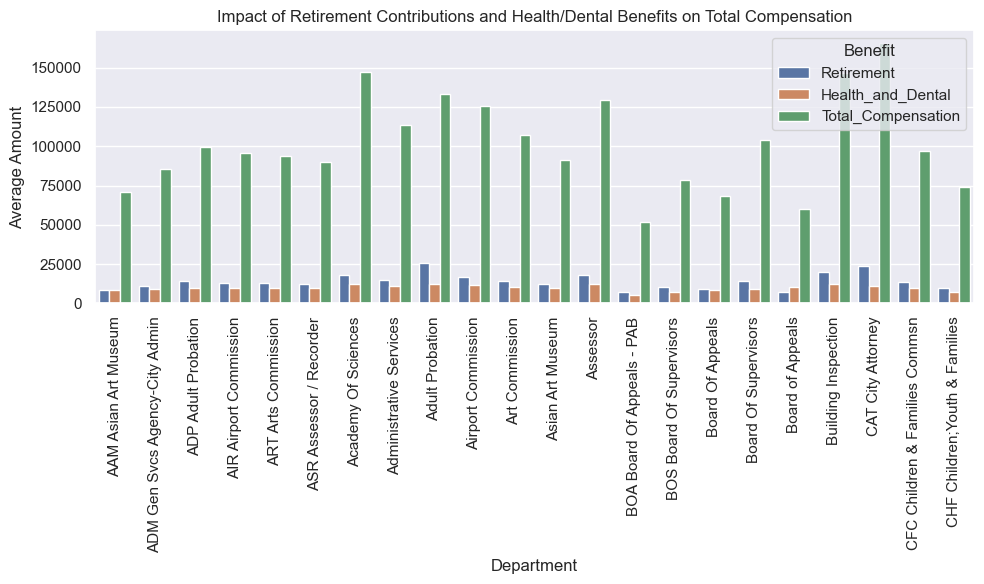

In [159]:
dept_stat(department_stats1)

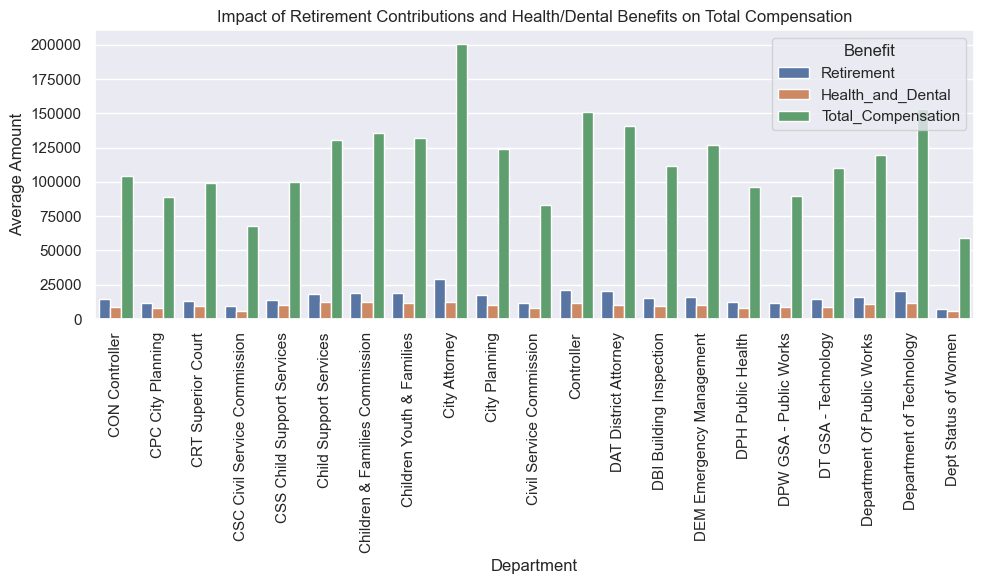

In [160]:
dept_stat(department_stats2)

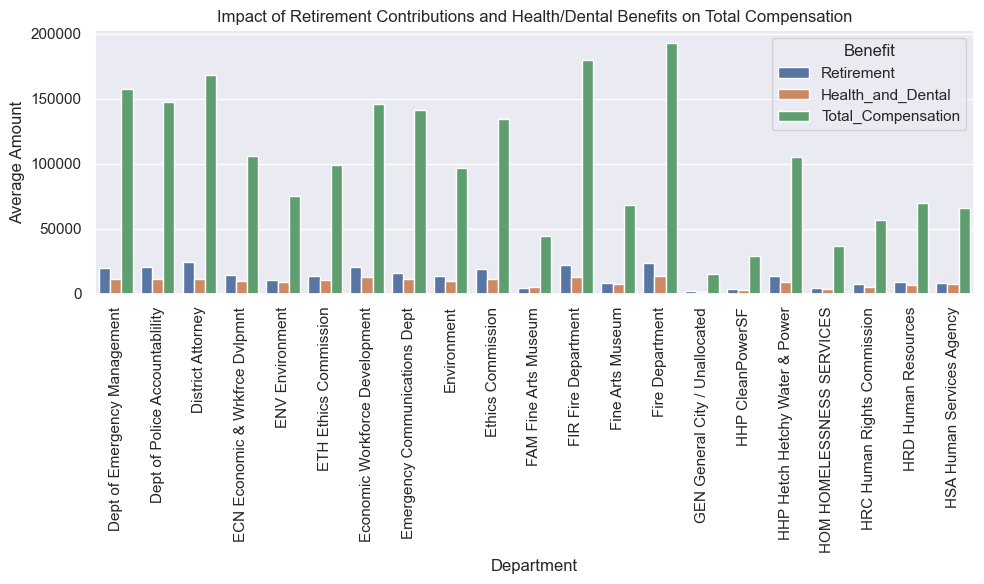

In [161]:
dept_stat(department_stats3)

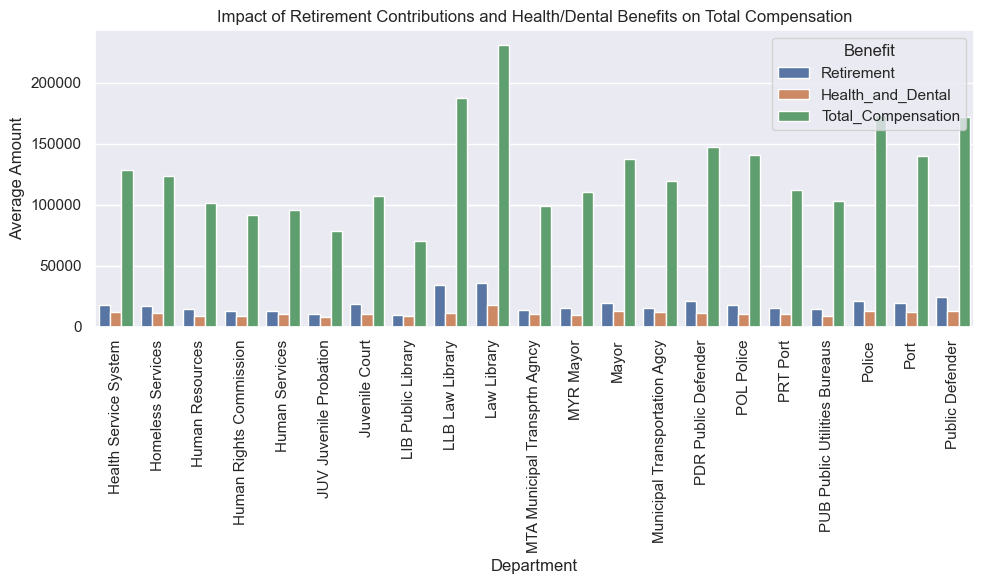

In [162]:
dept_stat(department_stats4)

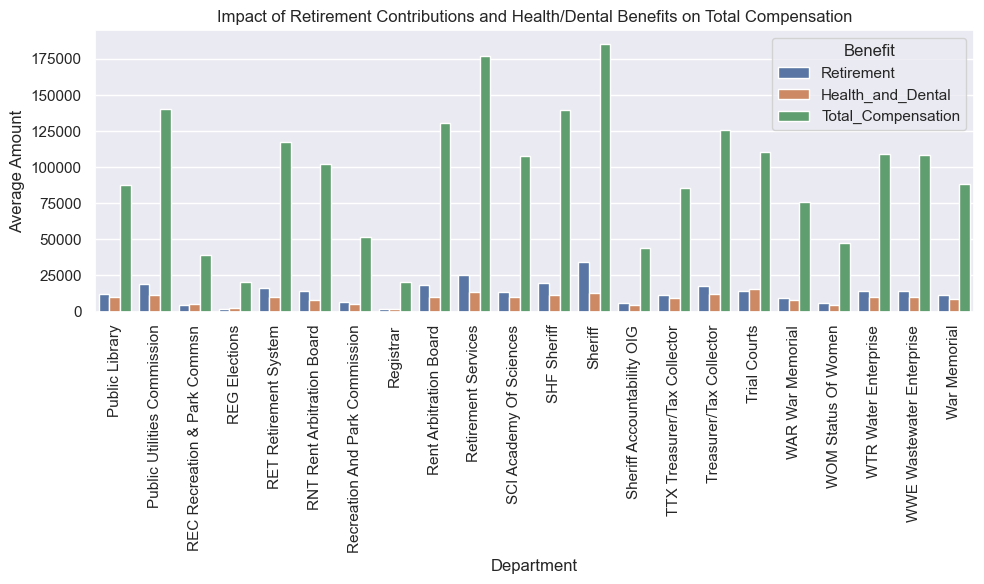

In [163]:
dept_stat(department_stats5)

#  10 Analyze which department Clerk takes maximum salary. Display Top 5 Departments which pays maximum salary to clerk.

In [481]:
df.columns

Index(['Organization_Group_Code', 'Job_Family_Code', 'Job_Code', 'Year_Type',
       'Year', 'Organization_Group', 'Department_Code', 'Department',
       'Union_Code', 'Union', 'Job_Family', 'Job', 'Employee_Identifier',
       'Salaries', 'Overtime', 'Other_Salaries', 'Total_Salary', 'Retirement',
       'Health_and_Dental', 'Other_Benefits', 'Total_Benefits',
       'Total_Compensation', 'Proportion_Benefits'],
      dtype='object')

In [482]:
df13 = df[df['Job']=='Clerk'];df13.shape

(6865, 23)

In [483]:
pivot = pd.pivot_table(df13,index='Department',values='Salaries',columns='Job',aggfunc='max')

In [484]:
pivot

Job,Clerk
Department,
ADM Gen Svcs Agency-City Admin,56344.93
ADP Adult Probation,56344.93
AIR Airport Commission,56344.93
Administrative Services,69319.25
Adult Probation,64108.00
Airport Commission,69319.28
Building Inspection,49889.16
CAT City Attorney,2342.00
CON Controller,52901.40


In [486]:
 top_clerk = df13.groupby('Department')['Salaries'].mean().sort_values(ascending=False).head(5)

In [487]:
top_clerk

Department
Treasurer/Tax Collector    60368.266774
War Memorial               60313.745000
District Attorney          60055.737500
Adult Probation            57340.100000
Public Library             57241.940000
Name: Salaries, dtype: float64

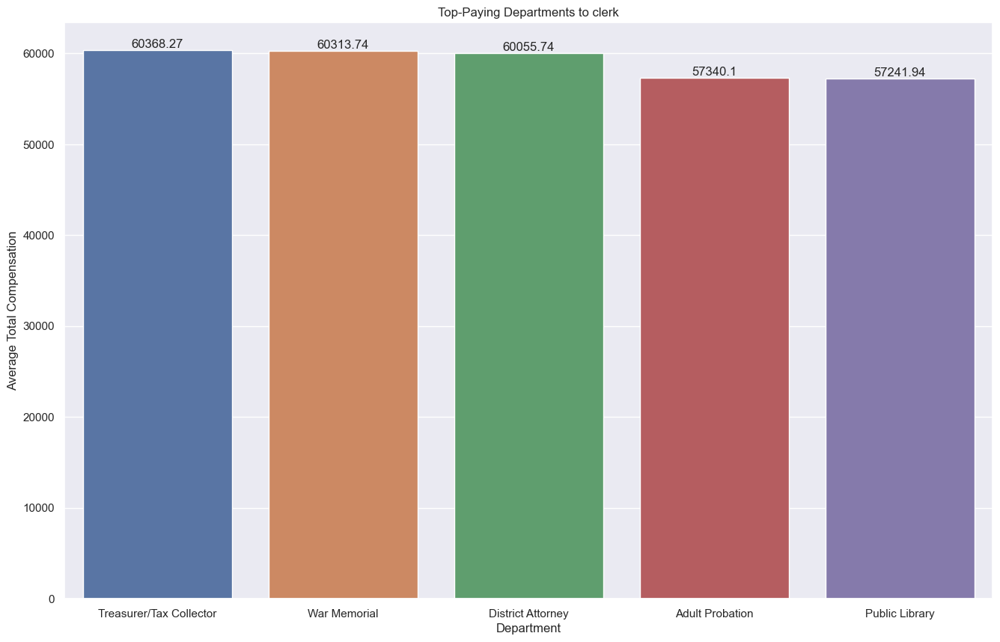

In [488]:
fig=plt.subplots(figsize=(16,10))
ax = sns.barplot(x=top_clerk.index ,y=top_clerk)
plt.ylabel('Average Total Compensation',fontsize=12)
plt.xlabel('Department',fontsize=12)
plt.title('Top-Paying Departments to clerk')
plt.xticks(rotation=0)
#plt.tight_layout()
for bar in ax.patches:
    percentage =f'{round(bar.get_height(),2)}'
    x=bar.get_x()+bar.get_width()/2
    y=bar.get_height()
    ax.annotate(percentage,(x,y),va='bottom', ha='center')
plt.show()